For this first assignment we will study the golden ball player of the 2023 Women's World Cup, Aitana Bonmatí.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from statsbombpy import sb
from mplsoccer import Pitch

First of all let's find the competition we need.

In [2]:
competitions_df = sb.competitions()
competitions_df

,competition_id,season_id,country_name,competition_name,competition_gender,competition_youth,competition_international,season_name,match_updated,match_updated_360,match_available_360,match_available
0,9,27,Germany,1. Bundesliga,male,False,False,2015/2016,2023-08-17T23:51:11.837478,None,None,2023-08-17T23:51:11.837478
1,16,4,Europe,Champions League,male,False,False,2018/2019,2023-03-07T12:20:48.118250,2021-06-13T16:17:31.694,None,2023-03-07T12:20:48.118250
2,16,1,Europe,Champions League,male,False,False,2017/2018,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2021-01-23T21:55:30.425330
3,16,2,Europe,Champions League,male,False,False,2016/2017,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2020-07-29T05:00
4,16,27,Europe,Champions League,male,False,False,2015/2016,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2020-07-29T05:00
...,...,...,...,...,...,...,...,...,...,...,...,...
62,55,43,Europe,UEFA Euro,male,False,True,2020,2023-02-24T21:26:47.128979,2023-04-27T22:38:34.970148,2023-04-27T22:38:34.970148,2023-02-24T21:26:47.128979
63,35,75,Europe,UEFA Europa League,male,False,False,1988/1989,2023-06-18T19:28:39.443883,2021-06-13T16:17:31.694,None,2023-06-18T19:28:39.443883
64,53,106,Europe,UEFA Women's Euro,female,False,True,2022,2023-07-17T21:19:03.032991,2023-07-17T21:21:56.497106,2023-07-17T21:21:56.497106,2023-07-17T21:19:03.032991
65,72,107,International,Women's World Cup,female,False,True,2023,2023-09-01T12:34:19.705316,2023-09-01T12:35:45.762196,2023-09-01T12:35:45.762196,2023-09-01T12:34:19.705316


In [4]:
competitions_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67 entries, 0 to 66
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   competition_id             67 non-null     int64 
 1   season_id                  67 non-null     int64 
 2   country_name               67 non-null     object
 3   competition_name           67 non-null     object
 4   competition_gender         67 non-null     object
 5   competition_youth          67 non-null     bool  
 6   competition_international  67 non-null     bool  
 7   season_name                67 non-null     object
 8   match_updated              67 non-null     object
 9   match_updated_360          51 non-null     object
 10  match_available_360        5 non-null      object
 11  match_available            67 non-null     object
dtypes: bool(2), int64(2), object(8)
memory usage: 5.5+ KB


In [5]:
competitions_df.competition_name.unique()

array(['1. Bundesliga', 'Champions League', 'Copa del Rey',
       "FA Women's Super League", 'FIFA U20 World Cup', 'FIFA World Cup',
       'Indian Super league', 'La Liga', 'Liga Profesional', 'Ligue 1',
       'North American League', 'NWSL', 'Premier League', 'Serie A',
       'UEFA Euro', 'UEFA Europa League', "UEFA Women's Euro",
       "Women's World Cup"], dtype=object)

In [6]:
competition_name = "Women's World Cup"
competitions_df[competitions_df['competition_name'] == competition_name]

,competition_id,season_id,country_name,competition_name,competition_gender,competition_youth,competition_international,season_name,match_updated,match_updated_360,match_available_360,match_available
65,72,107,International,Women's World Cup,female,False,True,2023,2023-09-01T12:34:19.705316,2023-09-01T12:35:45.762196,2023-09-01T12:35:45.762196,2023-09-01T12:34:19.705316
66,72,30,International,Women's World Cup,female,False,True,2019,2023-07-27T10:33:48.273734,2021-06-13T16:17:31.694,None,2023-07-27T10:33:48.273734


In [7]:
competition_id = 72
season_id = 107

wwc2023 = competitions_df[(competitions_df['competition_id'] == competition_id) & (competitions_df['season_id'] == season_id)]
wwc2023

,competition_id,season_id,country_name,competition_name,competition_gender,competition_youth,competition_international,season_name,match_updated,match_updated_360,match_available_360,match_available
65,72,107,International,Women's World Cup,female,False,True,2023,2023-09-01T12:34:19.705316,2023-09-01T12:35:45.762196,2023-09-01T12:35:45.762196,2023-09-01T12:34:19.705316


In [7]:
help(sb.competition_events)

Help on function competition_events in module statsbombpy.sb:

competition_events(country: str, division: str, season: str, gender: str = 'male', split: bool = False, filters: dict = {}, fmt: str = 'dataframe', creds: dict = {'user': None, 'passwd': None}, include_360_metrics=False) -> Union[pandas.core.frame.DataFrame, dict]



In [8]:
matches_df = sb.matches(competition_id, season_id)
matches_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64 entries, 0 to 63
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   match_id               64 non-null     int64 
 1   match_date             64 non-null     object
 2   kick_off               64 non-null     object
 3   competition            64 non-null     object
 4   season                 64 non-null     object
 5   home_team              64 non-null     object
 6   away_team              64 non-null     object
 7   home_score             64 non-null     int64 
 8   away_score             64 non-null     int64 
 9   match_status           64 non-null     object
 10  match_status_360       64 non-null     object
 11  last_updated           64 non-null     object
 12  last_updated_360       64 non-null     object
 13  match_week             64 non-null     int64 
 14  competition_stage      64 non-null     object
 15  stadium                64

In [9]:
unique_home_teams = set(matches_df['home_team'])
unique_away_teams = set(matches_df['away_team'])

unique_teams = unique_home_teams.union(unique_away_teams)
unique_teams

{"Argentina Women's",
 "Australia Women's",
 "Brazil Women's",
 "Canada Women's",
 "China PR Women's",
 "Colombia Women's",
 "Costa Rica Women's",
 "Denmark Women's",
 "England Women's",
 "France Women's",
 "Germany Women's",
 "Haiti Women's",
 "Italy Women's",
 "Jamaica Women's",
 "Japan Women's",
 "Korea Republic Women's",
 "Morocco Women's",
 "Netherlands Women's",
 "New Zealand Women's",
 "Nigeria Women's",
 "Norway Women's",
 "Panama Women's",
 "Philippines Women's",
 "Portugal Women's",
 "Republic of Ireland Women's",
 "South Africa Women's",
 "Spain Women's",
 "Sweden Women's",
 "Switzerland Women's",
 "United States Women's",
 "Vietnam Women's",
 "Zambia Women's"}

In [10]:
top2_teams = ["Spain Women's", "England Women's"]
top4_teams = top2_teams + ["Sweden Women's", "Australia Women's"]
top8_teams = top4_teams + ["Netherlands Women's", "Japan Women's", "Colombia Women's", "France Women's"]

In [37]:
teams_mask = (matches_df['home_team'].isin(top4_teams)) | (matches_df['away_team'].isin(top4_teams))
teams_matches_df = matches_df[teams_mask]
teams_matches_df

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,...,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version
0,3904629,2023-08-16,13:00:00.000,International - Women's World Cup,2023,Australia Women's,England Women's,1,3,available,...,2023-08-30T11:17:47.551826,6,Semi-finals,Accor Stadium,Tori Penso,Tony Gustavsson,Sarina Glotzbach-Wiegman,1.1.0,2,2
1,3906390,2023-08-20,13:00:00.000,International - Women's World Cup,2023,Spain Women's,England Women's,1,0,available,...,2023-08-22T19:38:43.965521,7,Final,Accor Stadium,Tori Penso,Jorge Vilda,Sarina Glotzbach-Wiegman,1.1.0,2,2
2,3906389,2023-08-19,11:00:00.000,International - Women's World Cup,2023,Sweden Women's,Australia Women's,2,0,available,...,2023-08-29T21:19:57.035390,7,3rd Place Final,Brisbane Stadium,Cheryl Foster,Peter Gerhardsson,Tony Gustavsson,1.1.0,2,2
3,3904628,2023-08-15,11:00:00.000,International - Women's World Cup,2023,Spain Women's,Sweden Women's,2,1,available,...,2023-08-16T11:30:31.556462,6,Semi-finals,Eden Park,Edina Alves Batista,Jorge Vilda,Peter Gerhardsson,1.1.0,2,2
4,3893806,2023-07-26,10:30:00.000,International - Women's World Cup,2023,Spain Women's,Zambia Women's,5,0,available,...,2023-08-15T02:58:57.266594,2,Group Stage,Eden Park,Hyeon-Jeong Oh,Jorge Vilda,Bruce Mwape,1.1.0,2,2
7,3893822,2023-07-31,10:00:00.000,International - Women's World Cup,2023,Japan Women's,Spain Women's,4,0,available,...,2023-08-15T03:20:22.749909,3,Group Stage,Wellington Regional Stadium,Katja Koroleva,Futoshi Ikeda,Jorge Vilda,1.1.0,2,2
8,3893814,2023-07-29,10:30:00.000,International - Women's World Cup,2023,Sweden Women's,Italy Women's,5,0,available,...,2023-08-15T02:40:42.886046,2,Group Stage,Wellington Regional Stadium,Cheryl Foster,Peter Gerhardsson,Milena Bertolini,1.1.0,2,2
11,3902968,2023-08-12,10:00:00.000,International - Women's World Cup,2023,Australia Women's,France Women's,0,0,available,...,2023-08-31T14:34:02.359150,5,Quarter-finals,Brisbane Stadium,María Belén Carvajal Peña,Tony Gustavsson,Hervé Renard,1.1.0,2,2
12,3902967,2023-08-12,13:30:00.000,International - Women's World Cup,2023,England Women's,Colombia Women's,2,1,available,...,2023-08-31T18:33:33.643867,5,Quarter-finals,Accor Stadium,Katja Koroleva,Sarina Glotzbach-Wiegman,Nelson Abadía Aragón,1.1.0,2,2
13,3901797,2023-08-06,12:00:00.000,International - Women's World Cup,2023,Sweden Women's,United States Women's,0,0,available,...,2023-08-23T15:07:14.382077,4,Round of 16,AAMI Park,Stéphanie Frappart,Peter Gerhardsson,Vlatko Andonovski,1.1.0,2,2


In [72]:
midfielder_position_ids = [9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20]

midfielder_players = set()

for match_id in teams_matches_df.match_id:
    lineup = sb.lineups(match_id)
    
    for team in top4_teams:
        if team in lineup:
            team_lineup = lineup[team]

            team_lineup['position_ids'] = team_lineup['positions'].apply(lambda x: [item['position_id'] for item in x])
            mask = team_lineup['position_ids'].apply(lambda x: any(position_id in midfielder_position_ids for position_id in x))
            midfielder_players.update(set(team_lineup[mask].player_name))
            
midfielder_players

{'Aitana Bonmati Conca',
 'Alba María Redondo Ferrer',
 'Alexandra Chidiac',
 'Alexia Putellas Segura',
 'Bethany England',
 'Caitlin Jade Foord',
 'Charlotte Layne Grant',
 'Chloe Kelly',
 'Clare Elizabeth Polkinghorne',
 'Claudia  Zornoza Sánchez',
 'Cortnee Brooke Vine',
 'Elin Ingrid Johanna Rubensson',
 'Ella Toone',
 'Emily Louise van Egmond',
 'Emma Stina Blackstenius',
 'Fridolina Rolfö',
 'Georgia Stanway',
 'Gun Nathalie Björn',
 'Hanna Ulrika Bennison',
 'Hayley Emma Raso',
 'Ingrid Filippa Angeldal',
 'Irene Guerrero Sanmartín',
 'Jennifer Hermoso Fuentes',
 'Katie Zelem',
 'Katrina Gorry',
 'Keira Walsh',
 'Kosovare Asllani',
 'Kyra Lillee Cooney-Cross',
 'Laura Coombs',
 'Lauren Hemp',
 'Lauren James',
 'Lina Mona Andréa Hurtig',
 'Madelen Fatimma Maria Janogy',
 'Mary Boio Fowler',
 'María Pérez',
 'Olivia Alma Charlotta Schough',
 'Rachel Daly',
 'Rebecka Blomqvist',
 'Salma Paralluelo Ayingono',
 'Samantha May Kerr',
 'Sara Caroline Seger',
 'Tameka Yallop',
 'Teresa A

In [155]:
defender_position_ids = [2, 3, 4, 5, 6, 7, 8]
midfielder_position_ids = [9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20]
accepted_position_ids = midfielder_position_ids + defender_position_ids

spain_midfielder_players = set()

for match_id in team_matches_id:
    lineup = sb.lineups(match_id)

    team_lineup = lineup[team_name]

    team_lineup['position_ids'] = team_lineup['positions'].apply(lambda x: [item['position_id'] for item in x])
    mask = team_lineup['position_ids'].apply(lambda x: any(position_id in accepted_position_ids for position_id in x))
    spain_midfielder_players.update(set(team_lineup[mask].player_name))
            
spain_midfielder_players

{'Aitana Bonmati Conca',
 'Alba María Redondo Ferrer',
 'Alexia Putellas Segura',
 'Claudia  Zornoza Sánchez',
 'Irene Guerrero Sanmartín',
 'Irene Paredes Hernandez',
 'Ivana Andrés Sanz',
 'Jennifer Hermoso Fuentes',
 'Laia Codina Panedas',
 'María Pérez',
 'Oihane Hernández Zurbano',
 'Olga  Carmona García',
 'Ona Batlle Pascual',
 'Rocío Gálvez Luna',
 'Salma Paralluelo Ayingono',
 'Teresa Abelleira Dueñas'}

In [11]:
team_name = "Spain Women's"
team_mask = (matches_df['home_team'] == team_name) | (matches_df['away_team'] == team_name)
team_matches_df = matches_df[team_mask]
team_matches_df

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,...,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version
1,3906390,2023-08-20,13:00:00.000,International - Women's World Cup,2023,Spain Women's,England Women's,1,0,available,...,2023-08-22T19:38:43.965521,7,Final,Accor Stadium,Tori Penso,Jorge Vilda,Sarina Glotzbach-Wiegman,1.1.0,2,2
3,3904628,2023-08-15,11:00:00.000,International - Women's World Cup,2023,Spain Women's,Sweden Women's,2,1,available,...,2023-08-16T11:30:31.556462,6,Semi-finals,Eden Park,Edina Alves Batista,Jorge Vilda,Peter Gerhardsson,1.1.0,2,2
4,3893806,2023-07-26,10:30:00.000,International - Women's World Cup,2023,Spain Women's,Zambia Women's,5,0,available,...,2023-08-15T02:58:57.266594,2,Group Stage,Eden Park,Hyeon-Jeong Oh,Jorge Vilda,Bruce Mwape,1.1.0,2,2
7,3893822,2023-07-31,10:00:00.000,International - Women's World Cup,2023,Japan Women's,Spain Women's,4,0,available,...,2023-08-15T03:20:22.749909,3,Group Stage,Wellington Regional Stadium,Katja Koroleva,Futoshi Ikeda,Jorge Vilda,1.1.0,2,2
15,3902240,2023-08-11,04:00:00.000,International - Women's World Cup,2023,Spain Women's,Netherlands Women's,2,1,available,...,2023-08-14T09:22:25.109084,5,Quarter-finals,Wellington Regional Stadium,Stéphanie Frappart,Jorge Vilda,Andries Jonker,1.1.0,2,2
23,3901733,2023-08-05,08:00:00.000,International - Women's World Cup,2023,Switzerland Women's,Spain Women's,1,5,available,...,2023-08-27T22:14:35.209354,4,Round of 16,Eden Park,Cheryl Foster,Inka Grings,Jorge Vilda,1.1.0,2,2
37,3893791,2023-07-21,10:30:00.000,International - Women's World Cup,2023,Spain Women's,Costa Rica Women's,3,0,available,...,2023-08-24T15:33:45.726341,1,Group Stage,Wellington Regional Stadium,Casey Reibelt,Jorge Vilda,Amelia Valverde,1.1.0,2,2


In [12]:
team_matches_id = list(team_matches_df.match_id)
team_matches_id

[3906390, 3904628, 3893806, 3893822, 3902240, 3901733, 3893791]

In [13]:
wwc2023_events = sb.competition_events(
    country=wwc2023['country_name'].iloc[0],
    division=wwc2023['competition_name'].iloc[0],
    season=wwc2023['season_name'].iloc[0],
    gender=wwc2023['competition_gender'].iloc[0],
    # split=True
)

In [35]:
wwc2023_events[wwc2023_events.type == 'Substitution'].dropna(axis=1)

,duration,id,index,match_id,minute,period,play_pattern,player,player_id,position,possession,possession_team,possession_team_id,second,substitution_outcome,substitution_replacement,team,team_id,timestamp,type
224642,0.0,b9990ed1-a0e7-4286-a3a7-c5b4cc0dae99,2530,3904629,71,2,From Keeper,Hayley Emma Raso,6818.0,Right Midfield,127,England Women's,865,20,Tactical,Cortnee Brooke Vine,Australia Women's,1205,00:26:20.971,Substitution
224643,0.0,16843cef-7a6e-421d-8a6d-d68ed21415f4,2762,3904629,80,2,From Keeper,Clare Elizabeth Polkinghorne,8382.0,Left Center Back,142,Australia Women's,1205,8,Tactical,Emily Louise van Egmond,Australia Women's,1205,00:35:08.741,Substitution
224644,0.0,9d019244-712a-4eae-bd17-96718dd808df,2902,3904629,87,2,From Kick Off,Alessia Russo,47521.0,Right Center Forward,156,Australia Women's,1205,7,Tactical,Chloe Kelly,England Women's,865,00:42:07.052,Substitution
224645,0.0,55fbaafc-f1ed-4e98-b2f1-99976c4e33ce,2916,3904629,87,2,From Kick Off,Katrina Gorry,4979.0,Right Defensive Midfield,156,Australia Women's,1205,54,Tactical,Alexandra Chidiac,Australia Women's,1205,00:42:54.295,Substitution
224646,0.0,d9e73fa7-5588-4662-b100-809af3b078a1,2976,3904629,89,2,From Throw In,Ella Toone,31534.0,Left Wing,160,Australia Women's,1205,30,Tactical,Niamh Charles,England Women's,865,00:44:30.338,Substitution
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225131,0.0,817cfcf1-c728-4ace-ac7a-9504e8b26338,3104,3893793,76,2,Regular Play,Aoba Fujino,401925.0,Right Wing,168,Japan Women's,1210,18,Tactical,Hikaru Naomoto,Japan Women's,1210,00:31:18.954,Substitution
225132,0.0,241bb732-5232-41e2-90f3-62f9b8b2a4e9,3105,3893793,76,2,Regular Play,Jun Endo,25608.0,Left Wing Back,168,Japan Women's,1210,23,Tactical,Takako Seike,Japan Women's,1210,00:31:23.317,Substitution
225133,0.0,a023f5a2-09b3-4a3e-8409-4a018355e0ae,3286,3893793,81,2,Regular Play,Lushomo Mweemba,131624.0,Left Center Back,175,Japan Women's,1210,26,Injury,Vast Phiri,Zambia Women's,6045,00:36:26.015,Substitution
225134,0.0,47bb0a8a-b076-41ef-a41f-980f36827dbe,3821,3893793,92,2,Regular Play,Hinata Miyazawa,401932.0,Left Wing,195,Zambia Women's,6045,34,Tactical,Remina Chiba,Japan Women's,1210,00:47:34.217,Substitution


In [30]:
wwc2023_events[wwc2023_events.type == 'Starting XI']['tactics'][0]

{'formation': 442,
 'lineup': [{'player': {'id': 42787, 'name': 'Mackenzie Arnold'},
   'position': {'id': 1, 'name': 'Goalkeeper'},
   'jersey_number': 18},
  {'player': {'id': 5095, 'name': 'Ellie Madison Carpenter'},
   'position': {'id': 2, 'name': 'Right Back'},
   'jersey_number': 21},
  {'player': {'id': 401635, 'name': 'Clare Hunt'},
   'position': {'id': 3, 'name': 'Right Center Back'},
   'jersey_number': 15},
  {'player': {'id': 8382, 'name': 'Clare Elizabeth Polkinghorne'},
   'position': {'id': 5, 'name': 'Left Center Back'},
   'jersey_number': 4},
  {'player': {'id': 5000, 'name': 'Stephanie-Elise Catley'},
   'position': {'id': 6, 'name': 'Left Back'},
   'jersey_number': 7},
  {'player': {'id': 4979, 'name': 'Katrina Gorry'},
   'position': {'id': 9, 'name': 'Right Defensive Midfield'},
   'jersey_number': 19},
  {'player': {'id': 131586, 'name': 'Kyra Lillee Cooney-Cross'},
   'position': {'id': 11, 'name': 'Left Defensive Midfield'},
   'jersey_number': 23},
  {'play

In [127]:
# cols = [ 'pass_body_part', 'pass_end_location', 'pass_height', 'pass_outcome', 'pass_shot_assist', 'pass_goal_assist', 'pass_through_ball', 'pass_type', 'under_pressure']

In [14]:
cols = ['id', 'index', 'match_id', 'player', 'type', 'location', 'carry_end_location', 'pass_end_location', 'pass_shot_assist', 
        'pass_goal_assist', 'pass_through_ball']

In [15]:
gray_color = '#c0c0c0'

# Function to determine the color based on the conditions
def determine_color_and_alpha_and_zorder(row):
    if row['pass_goal_assist'] == True:
        color = 'green'
        alpha = 1.
        zorder = 2
    elif row['pass_shot_assist'] == True:  # or row['pass_danger_assist'] == True:
        color = 'blue'
        alpha = 1.
        zorder = 2
    elif row['pass_through_ball'] == True:
        color = 'red'
        alpha = 1.
        zorder = 2
    else:
        color = gray_color
        alpha = .15
        zorder = 1

    return color, alpha, zorder

In [16]:
match_id = 3901733
match_events = wwc2023_events[wwc2023_events['match_id'] == match_id].sort_values('index')
# match_events[match_events.pass_shot_assist == True][cols]

In [16]:
spain_players = wwc2023_events[wwc2023_events['team'] == team_name].player.unique()[1:]
spain_players

array(['Olga  Carmona García', 'Teresa Abelleira Dueñas',
       'Jennifer Hermoso Fuentes', 'Catalina Thomas Coll Lluch',
       'Irene Paredes Hernandez', 'Laia Codina Panedas',
       'María Francesca Caldentey Oliver', 'Ona Batlle Pascual',
       'Alba María Redondo Ferrer', 'Aitana Bonmati Conca',
       'Salma Paralluelo Ayingono', 'Oihane Hernández Zurbano',
       'Ivana Andrés Sanz', 'Alexia Putellas Segura', 'Eva Maria Navarro',
       'Esther Gonzalez Rodríguez', 'María Isabel Rodríguez Rivero',
       'Irene Guerrero Sanmartín', 'Athenea del Castillo Belvide',
       'Rocío Gálvez Luna', 'Claudia  Zornoza Sánchez', 'María Pérez'],
      dtype=object)

In [38]:
# aitana_forward_pass_not_preceded_by_carry_df[cols]

In [39]:
# only_pass_colors

In [17]:
# Define a function to apply to each row
def calculate_final_type(row):
    if row['type'] == 'Pass':
        return 'Pass'
    elif row['type'] == 'Carry' and pd.isnull(row['pass_end_location']):
        return 'Carry'
    else:
        return 'Carry + Pass'

In [19]:
# Define a function to calculate the result based on final_type
def calculate_result(row):
    if row['final_type'] == 'Carry':
        return row['carry_end_location'][0] - row['location'][0]
    elif row['final_type'] == 'Carry + Pass':
        return row['pass_end_location'][0] - row['location'][0]
    elif row['final_type'] == 'Pass':
        return row['pass_end_location'][0] - row['location'][0]
    else:
        return np.nan  # Handle other cases as needed

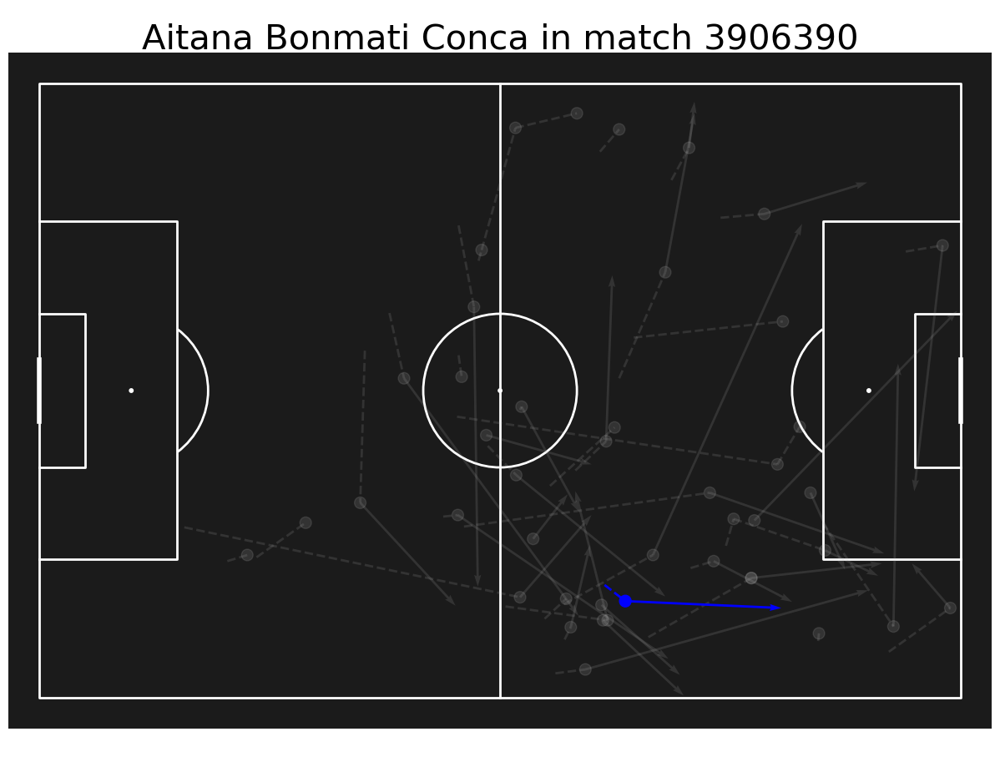

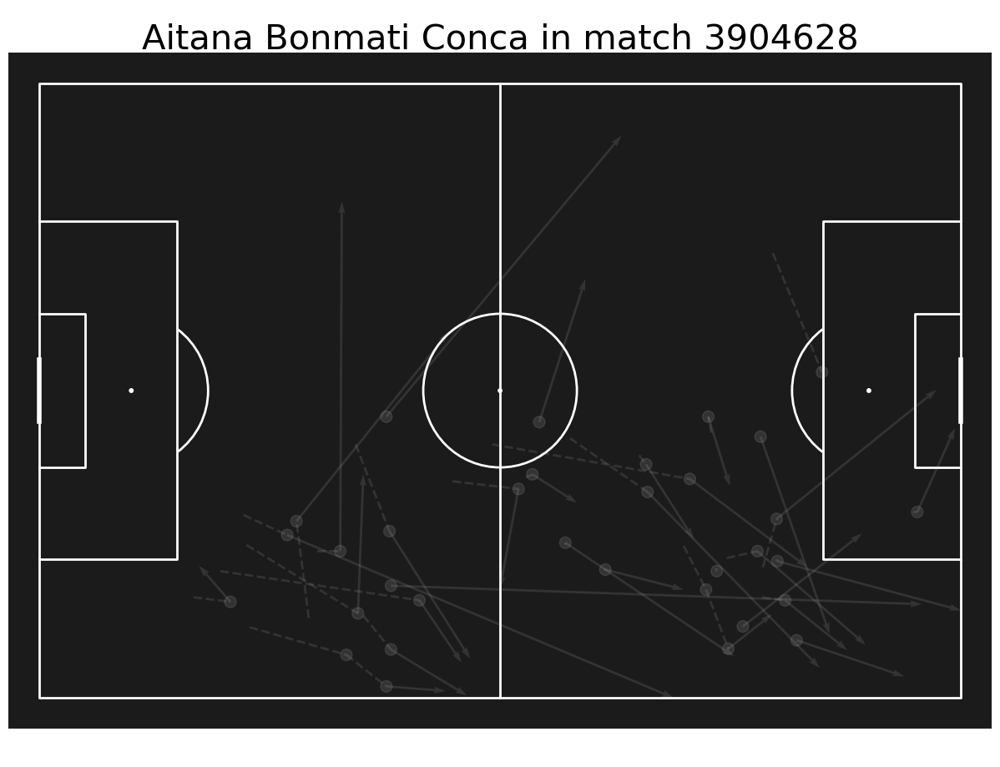

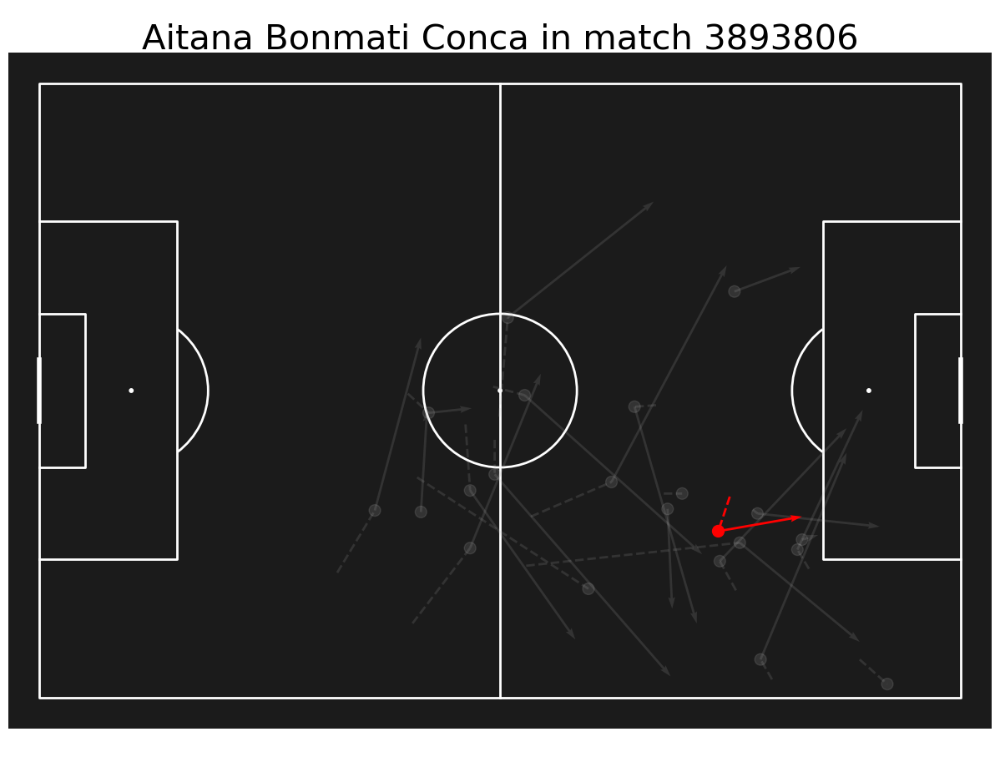

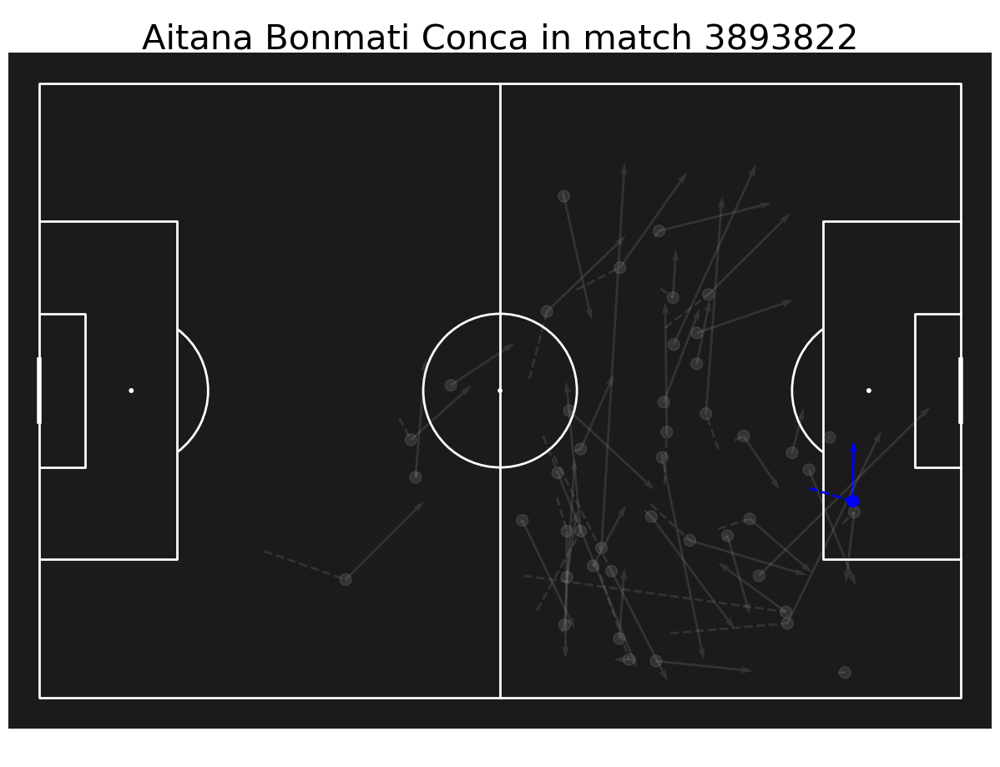

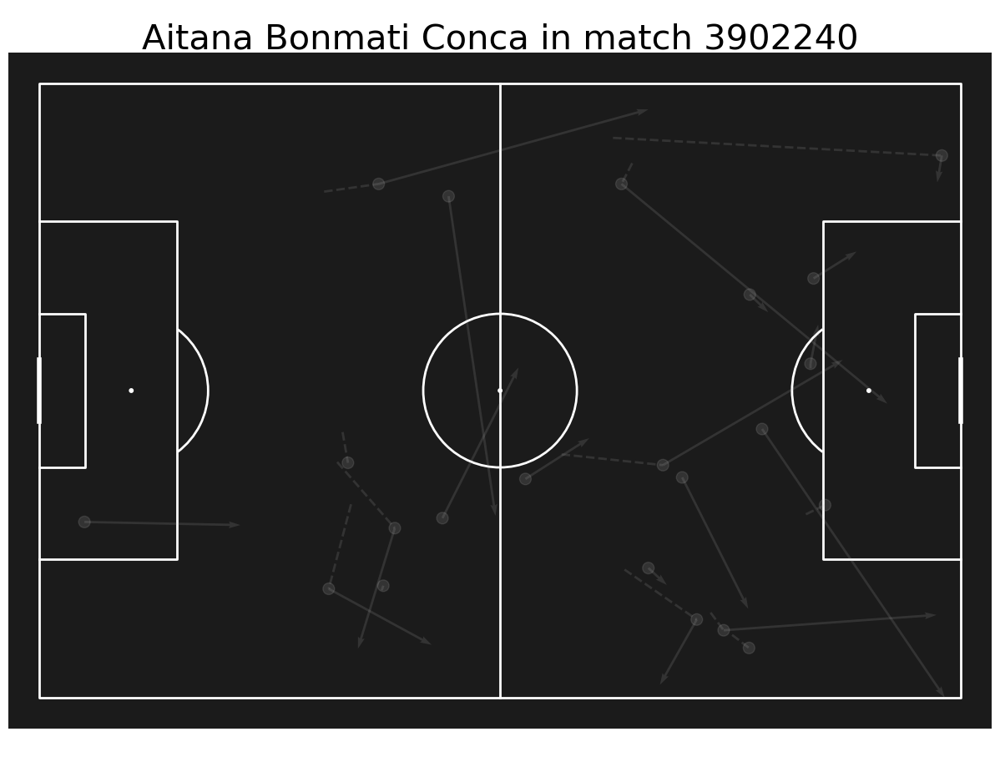

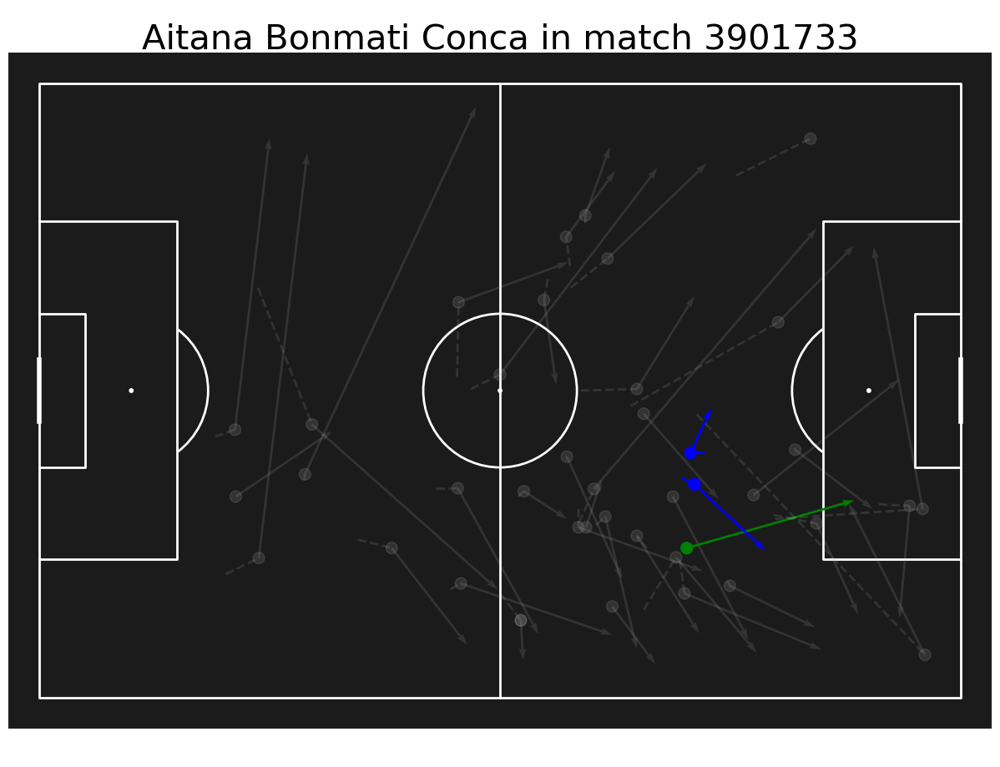

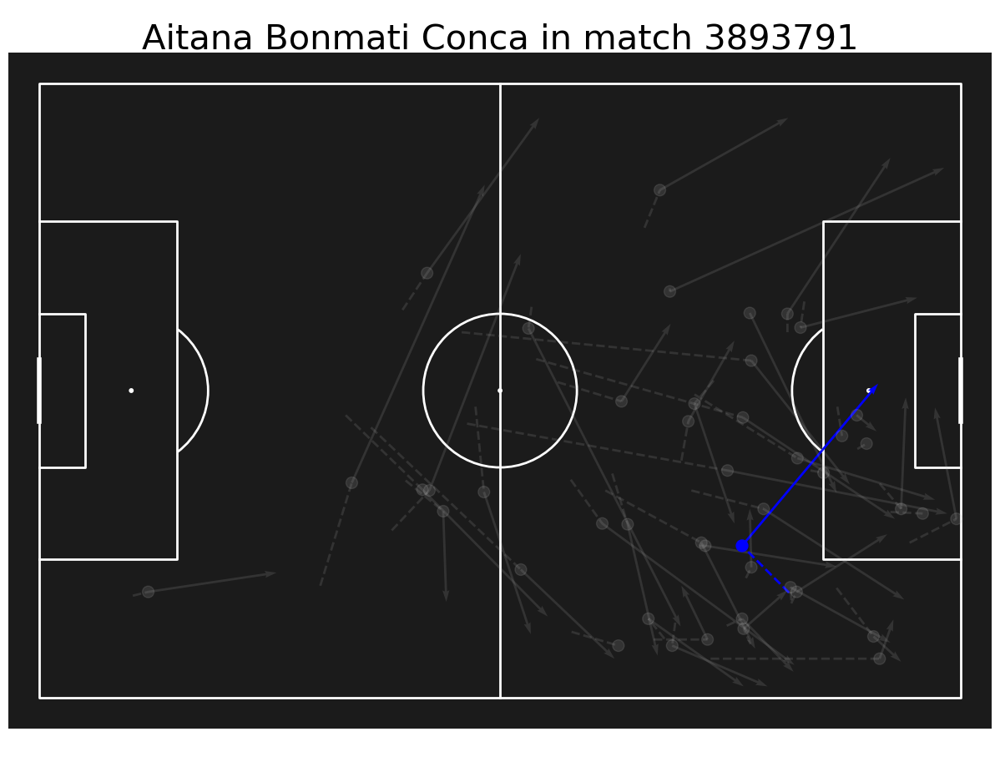

final_type
Carry            5.000000
Carry + Pass    26.142857
Pass             4.857143
dtype: float64
13.15079365079365


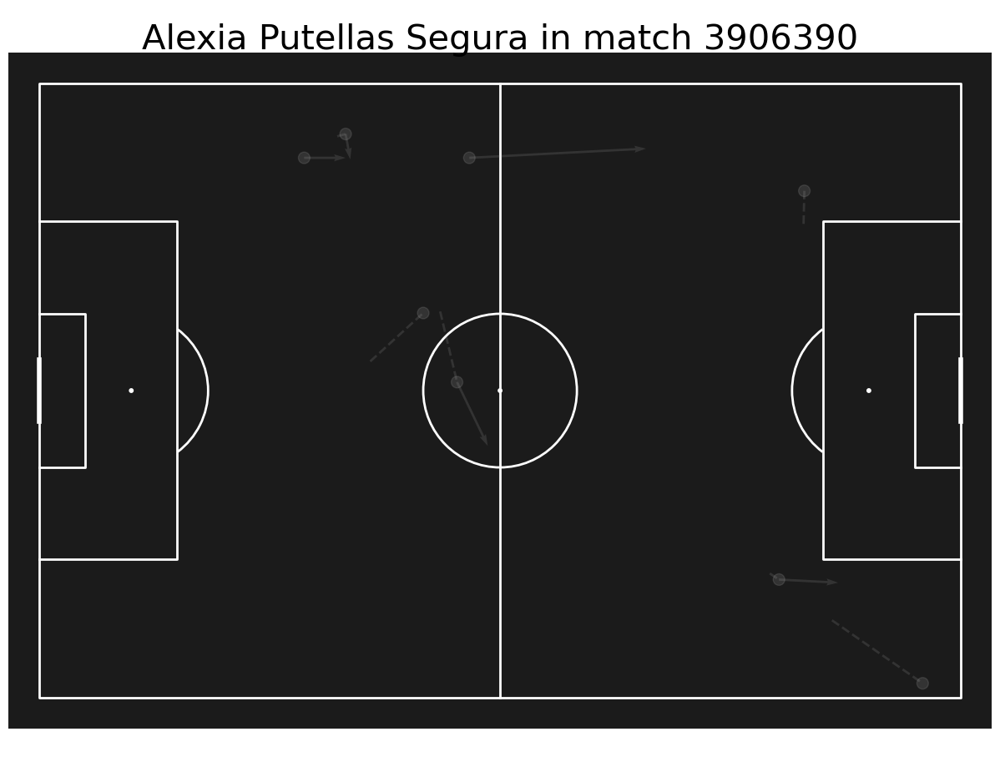

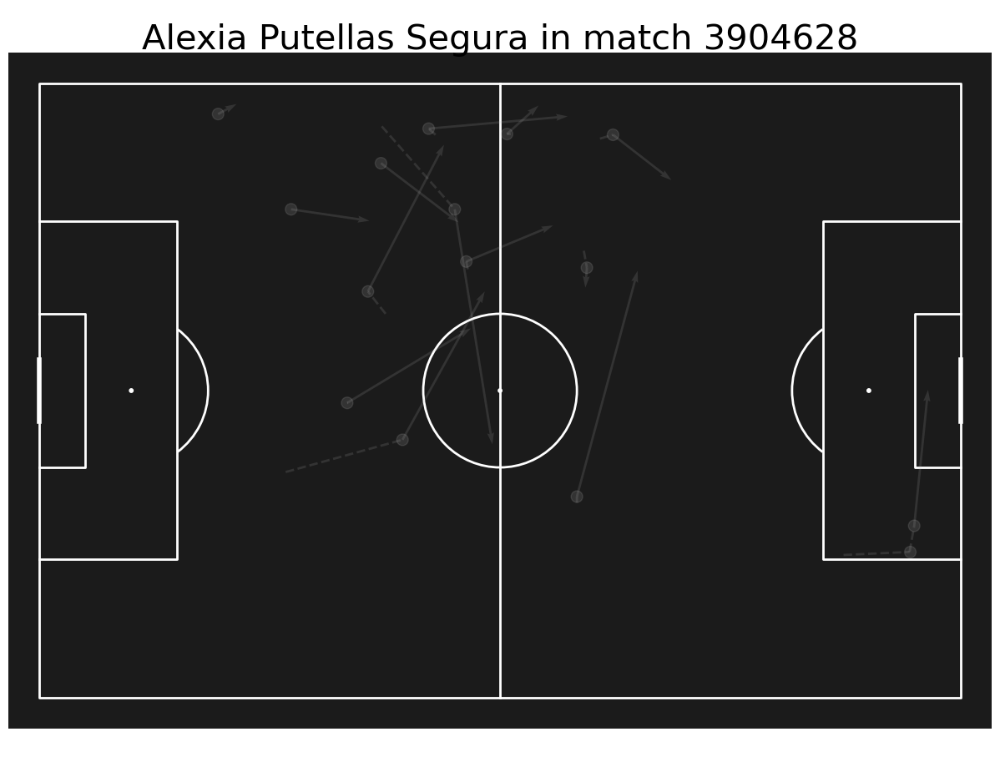

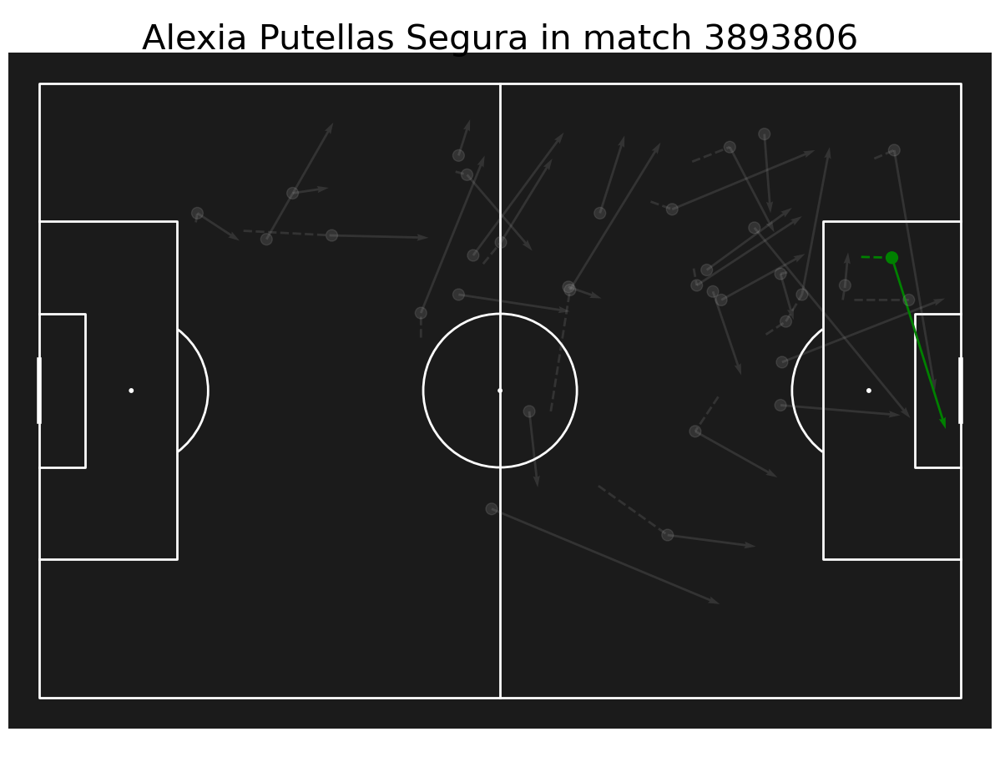

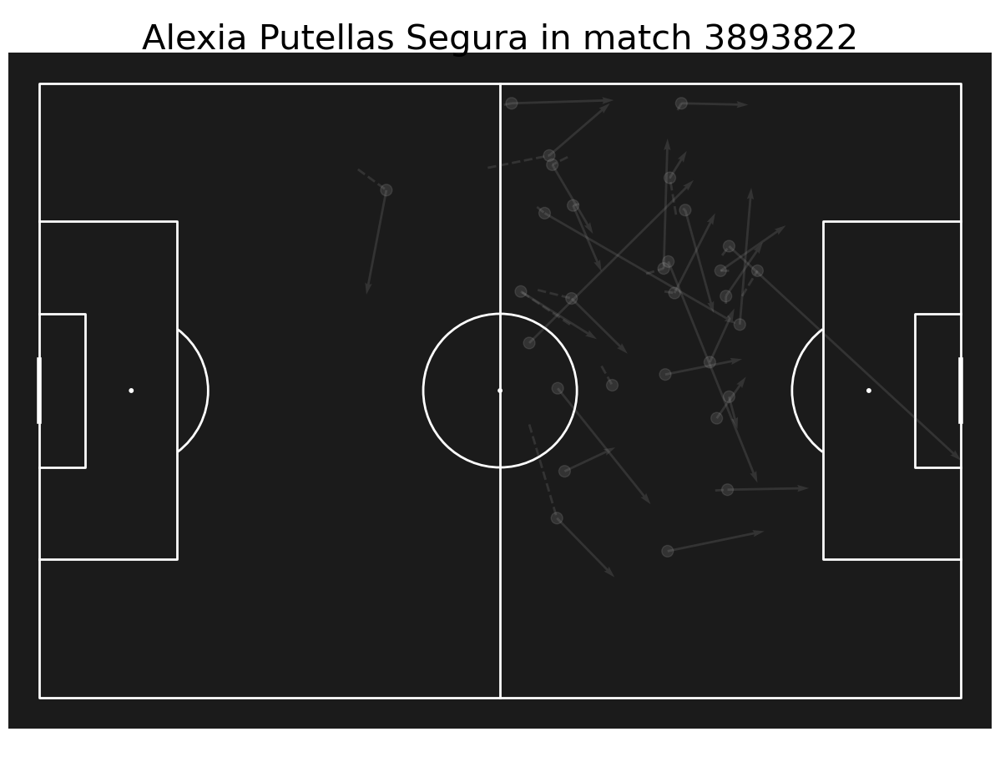

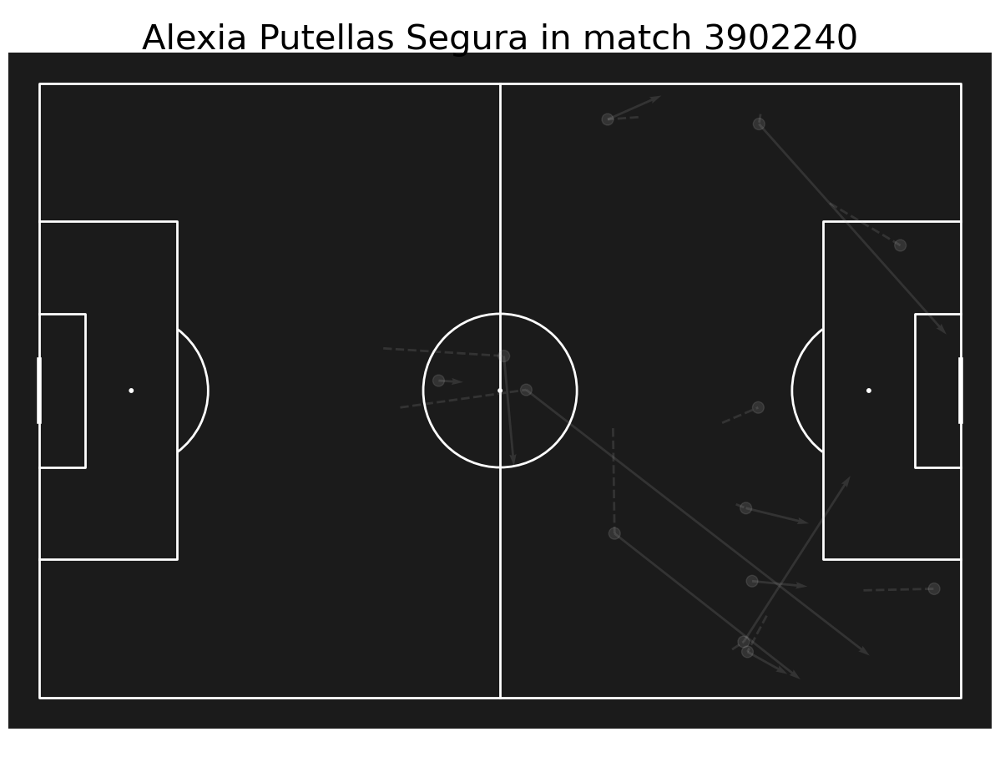

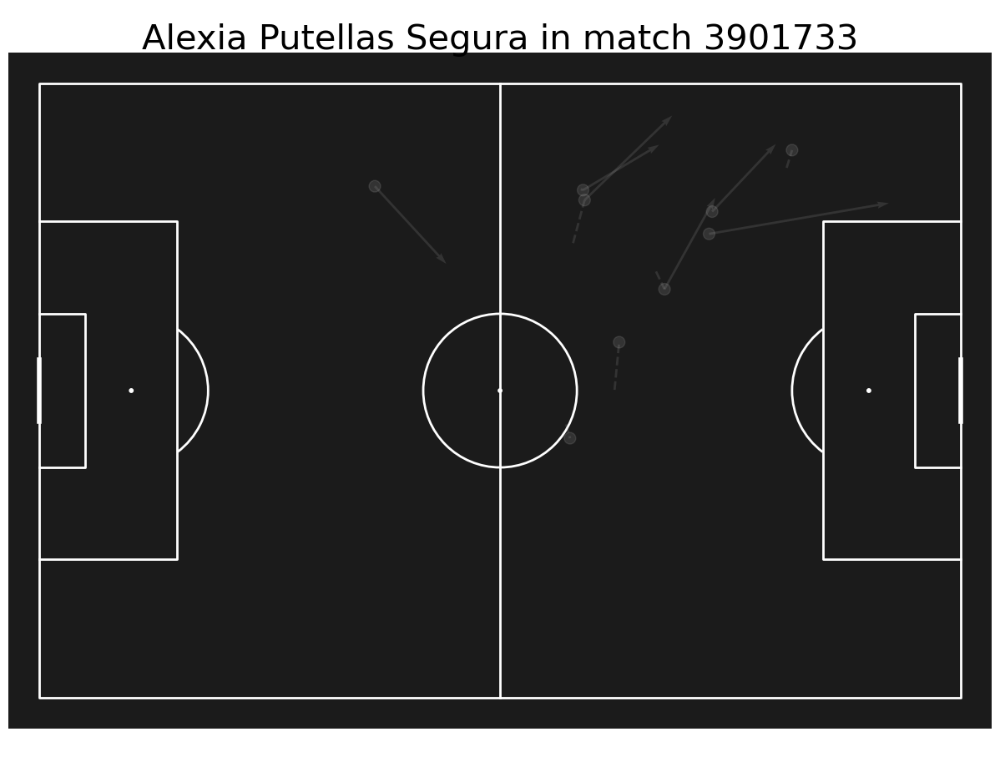

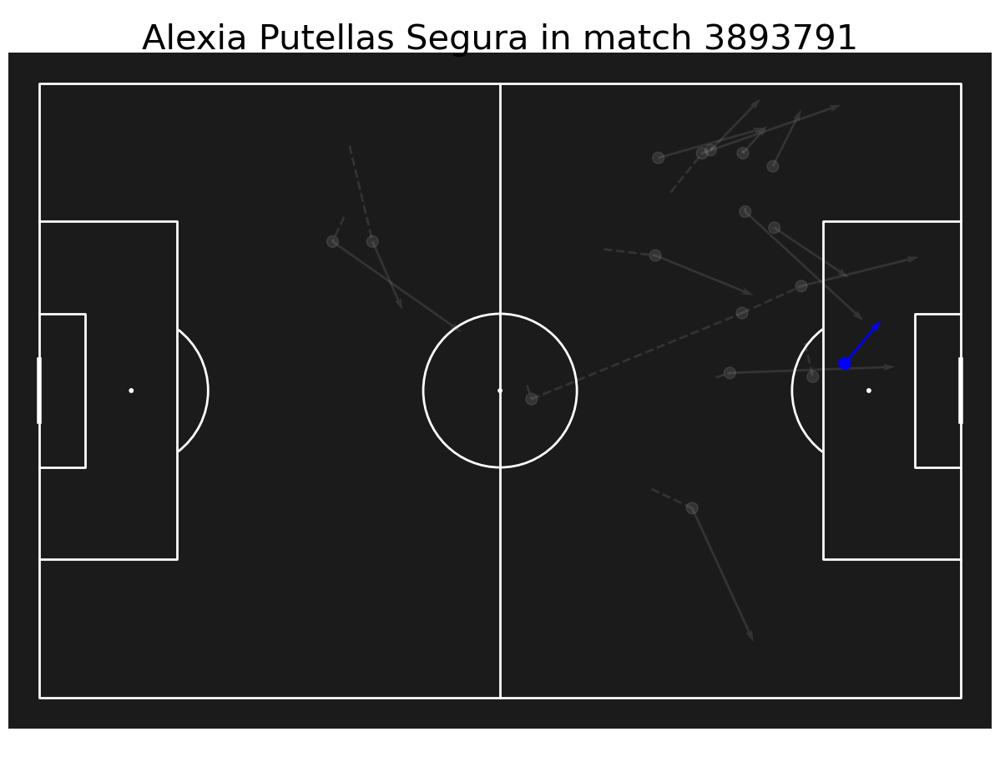

final_type
Carry            2.428571
Carry + Pass    11.142857
Pass             4.428571
dtype: float64
10.204761904761906


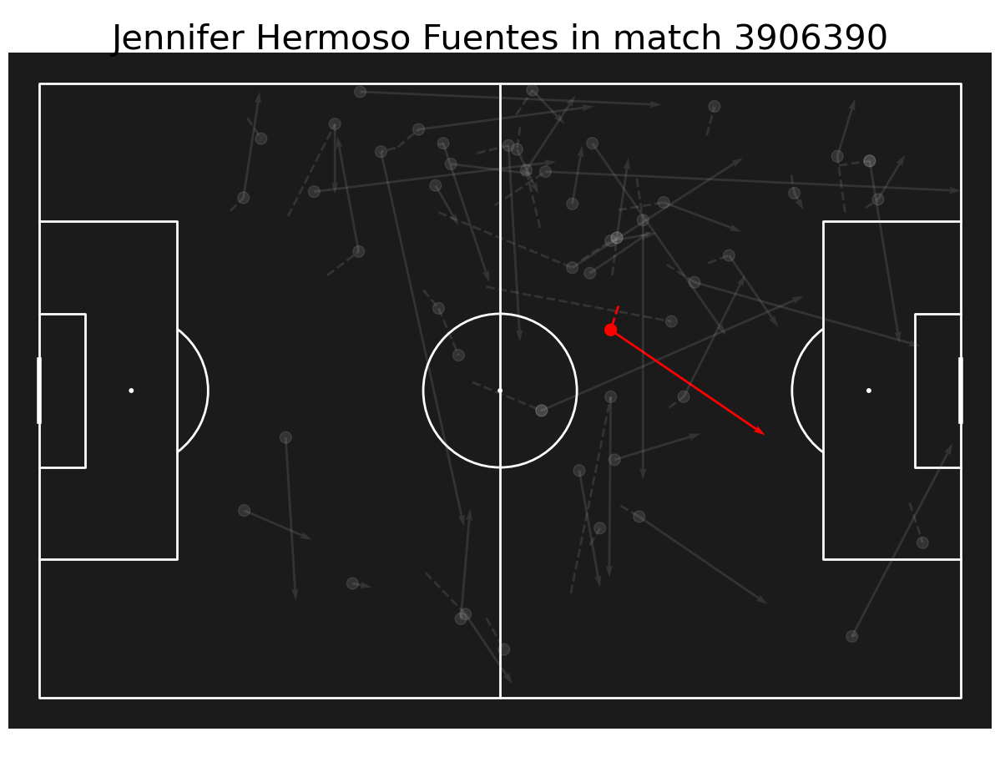

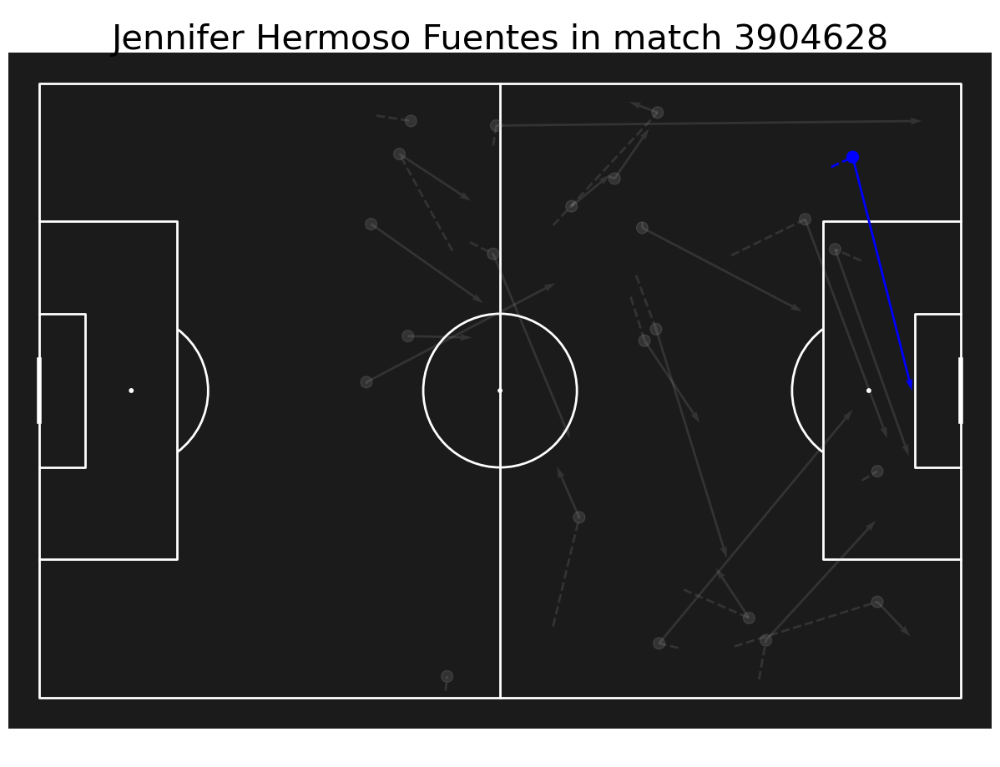

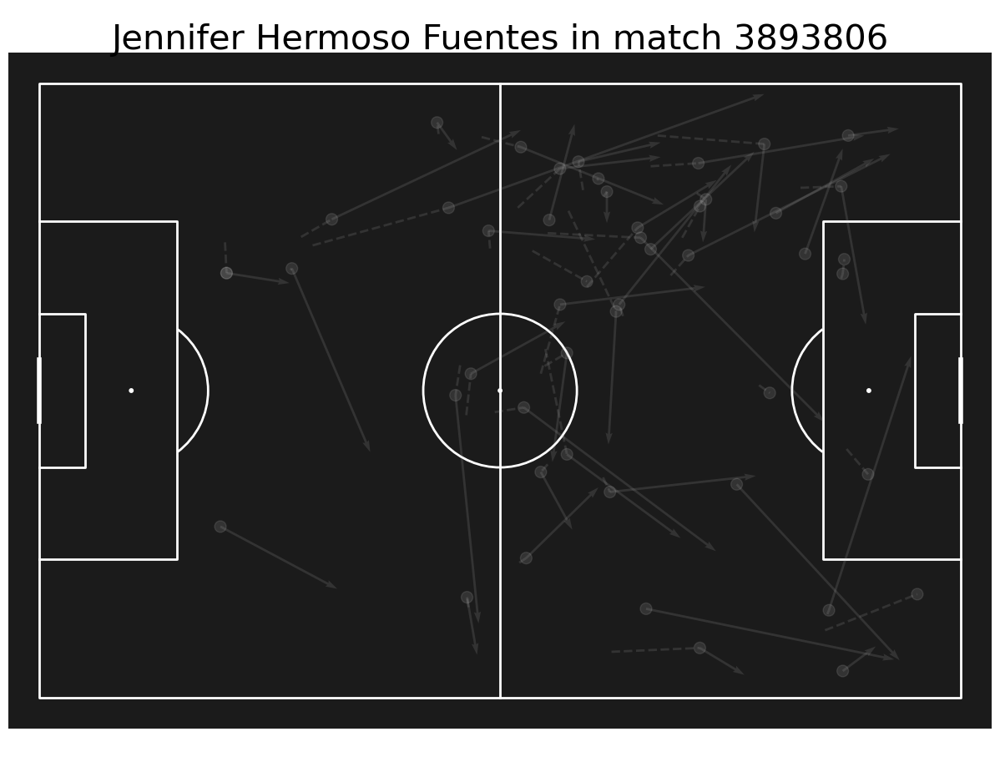

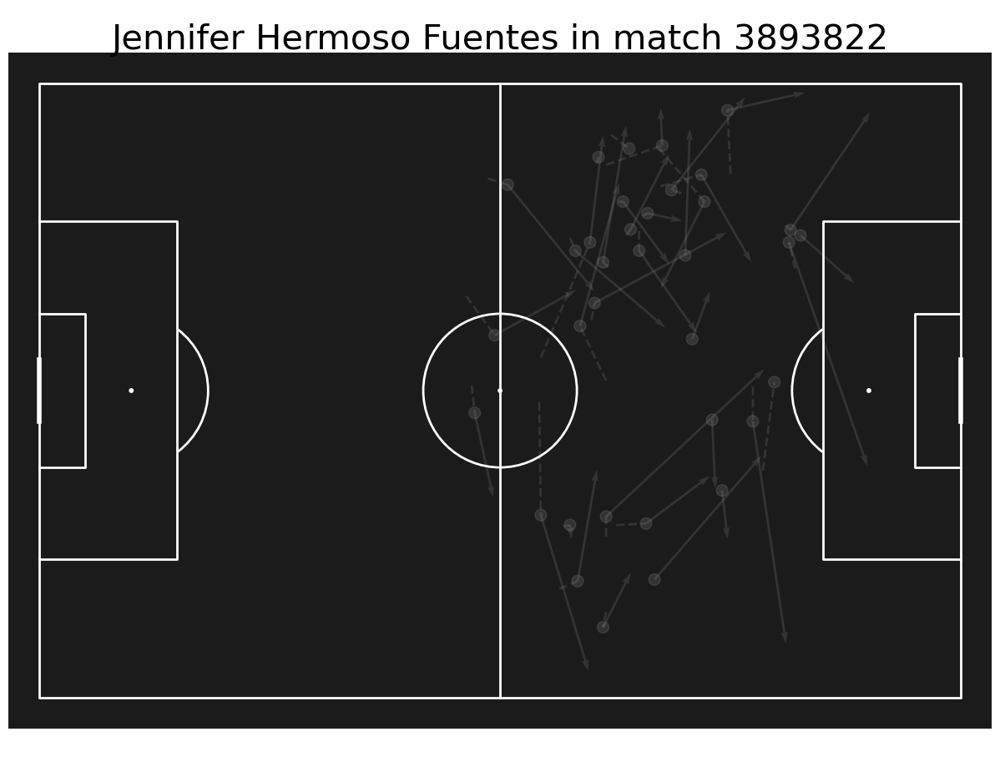

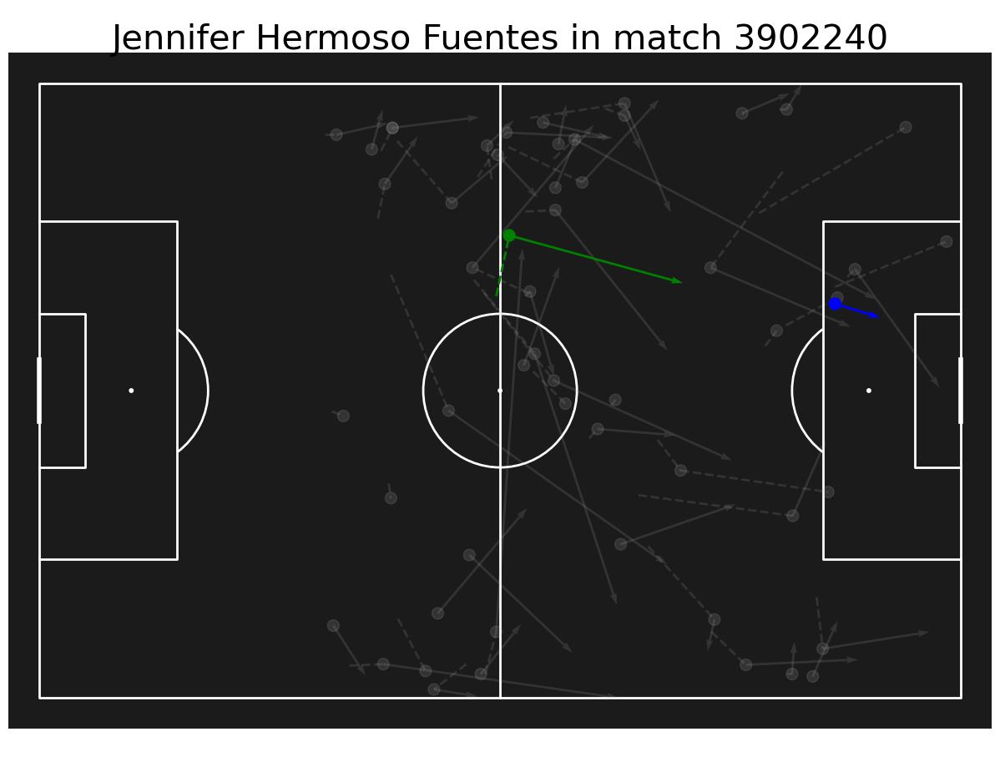

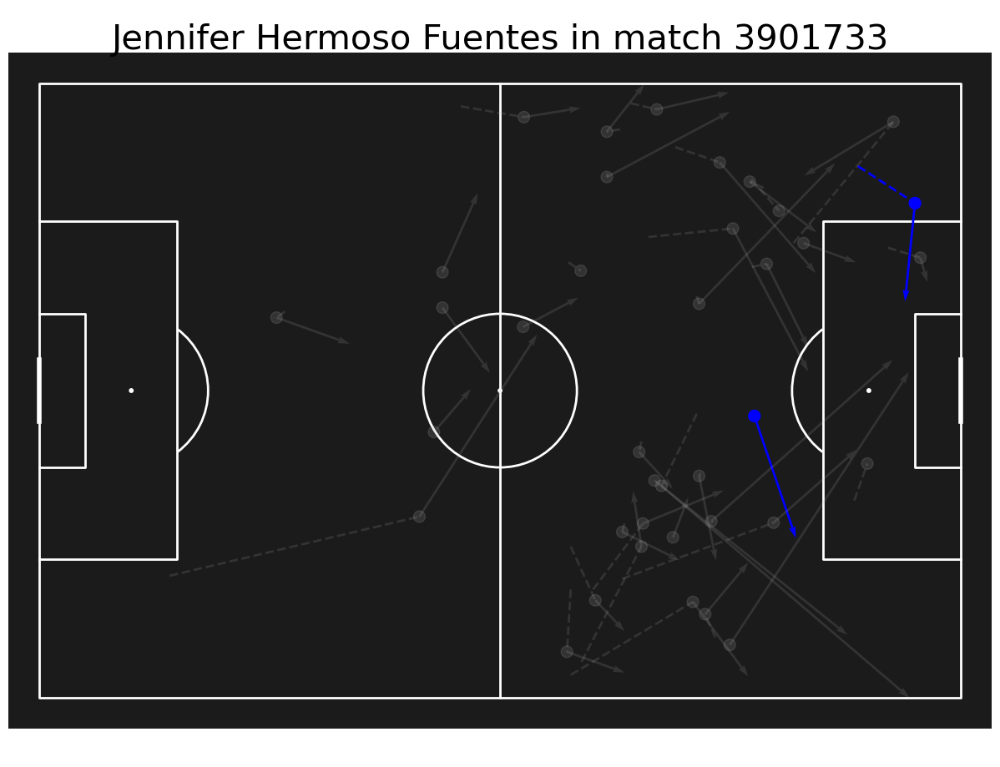

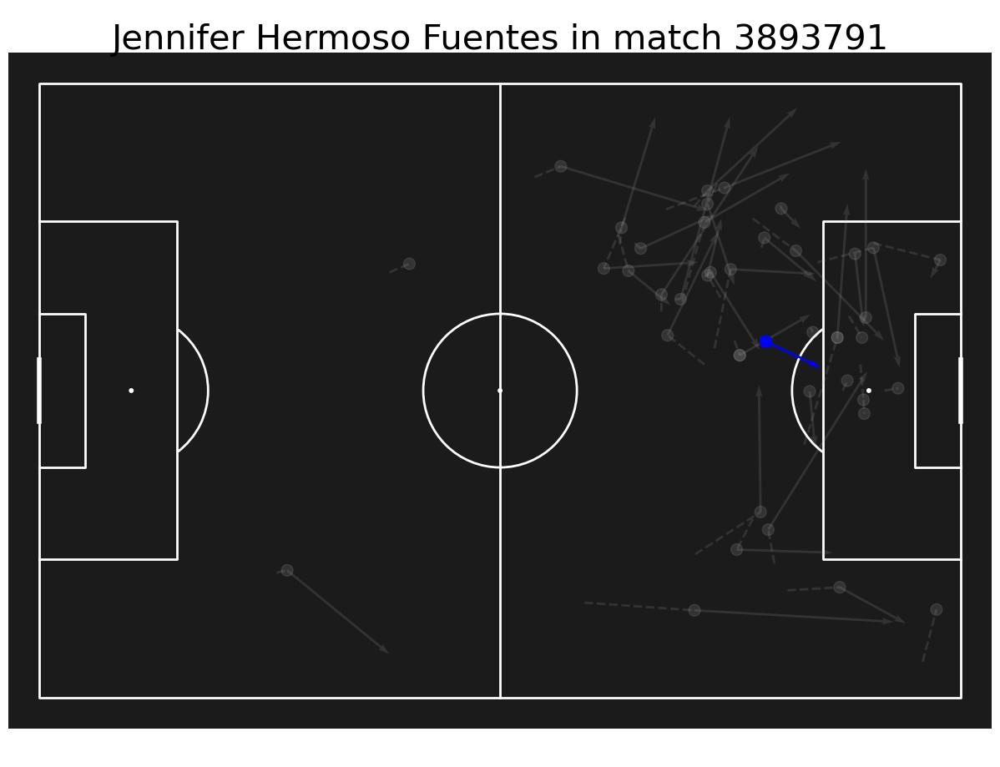

final_type
Carry            7.285714
Carry + Pass    28.571429
Pass             6.285714
dtype: float64
10.351864406779661


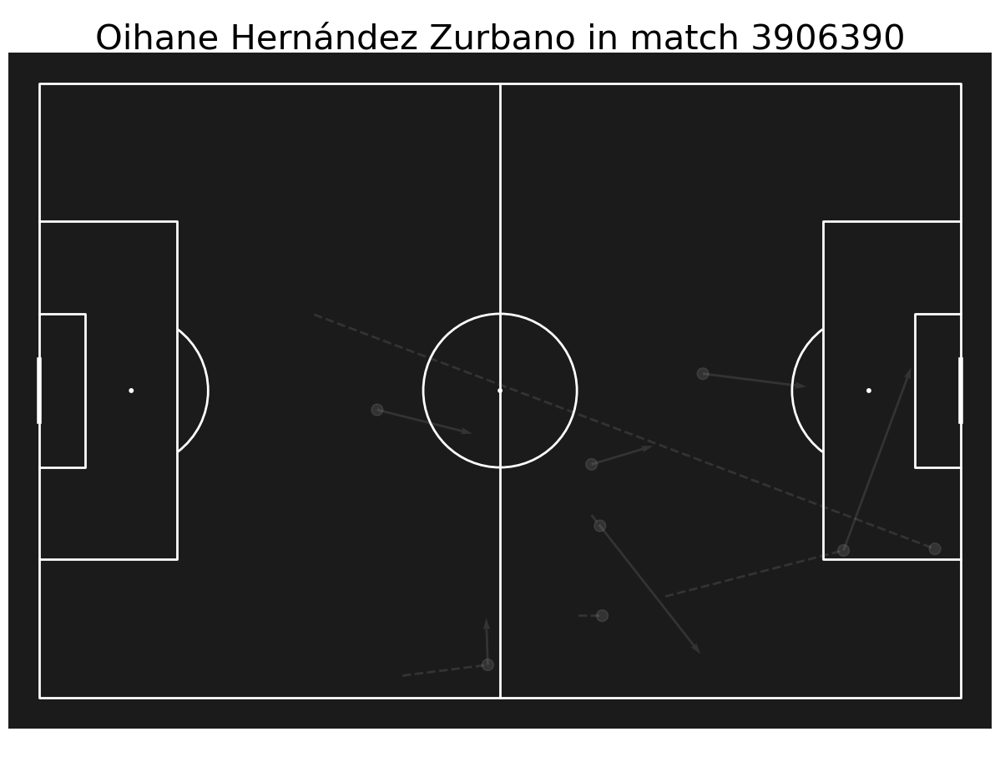

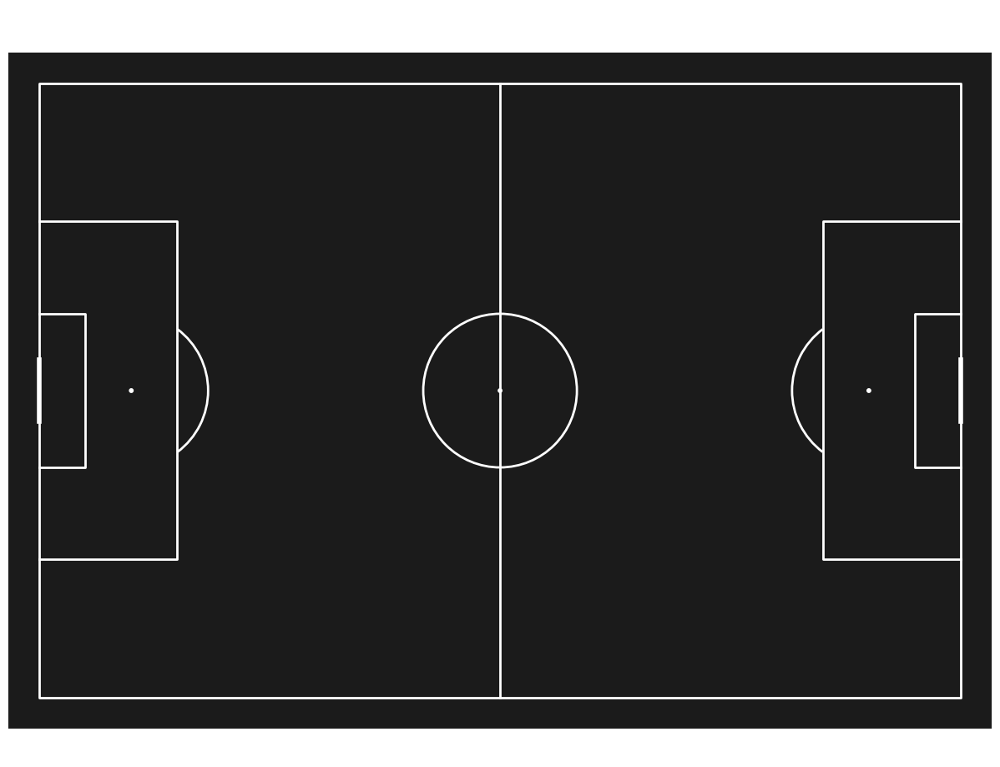

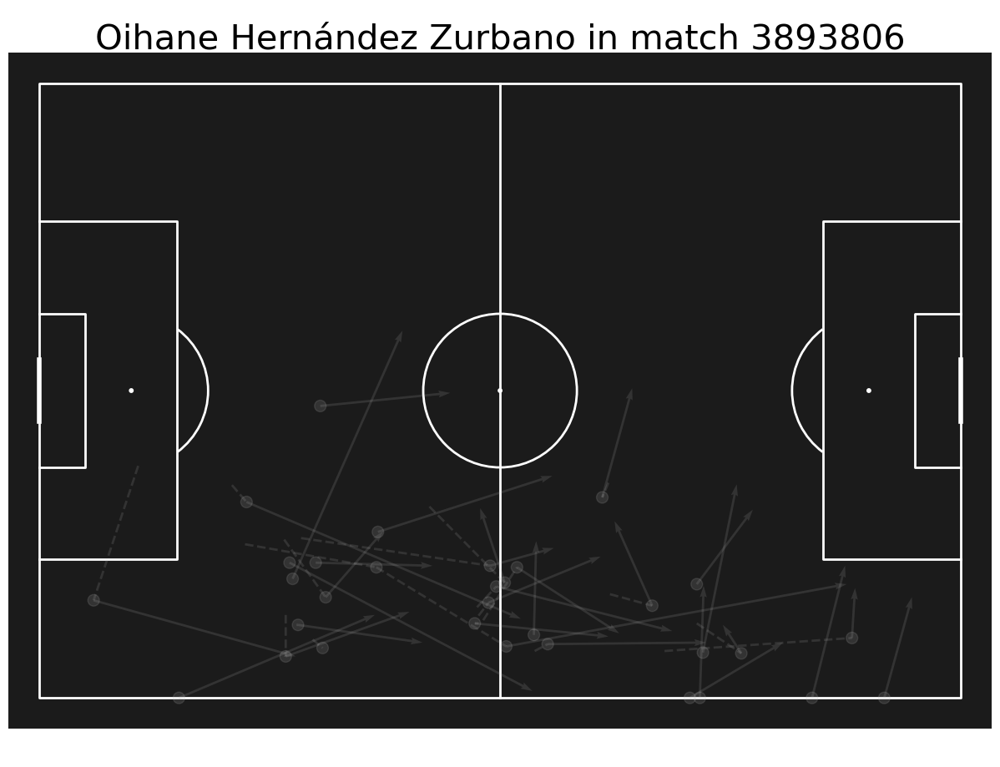

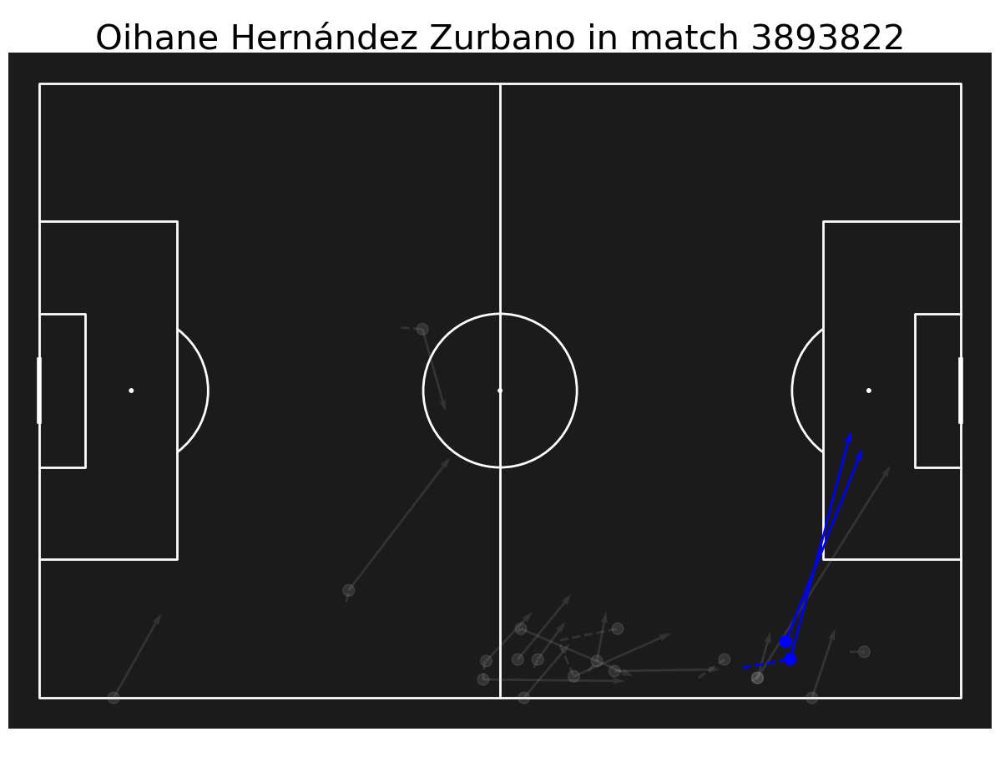

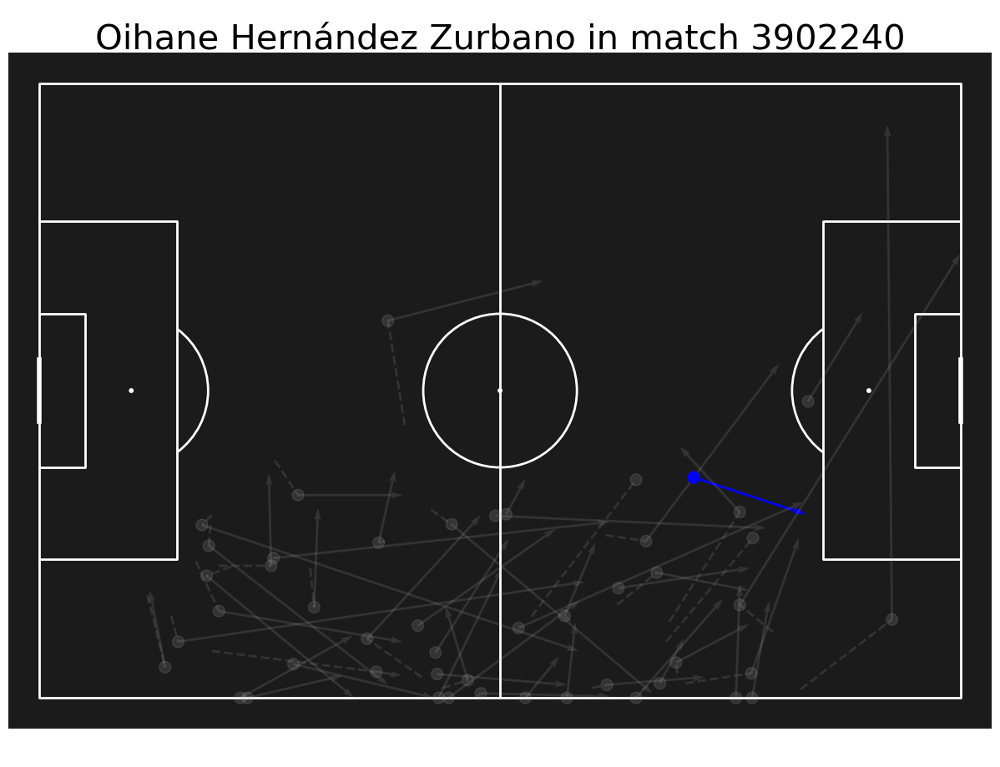

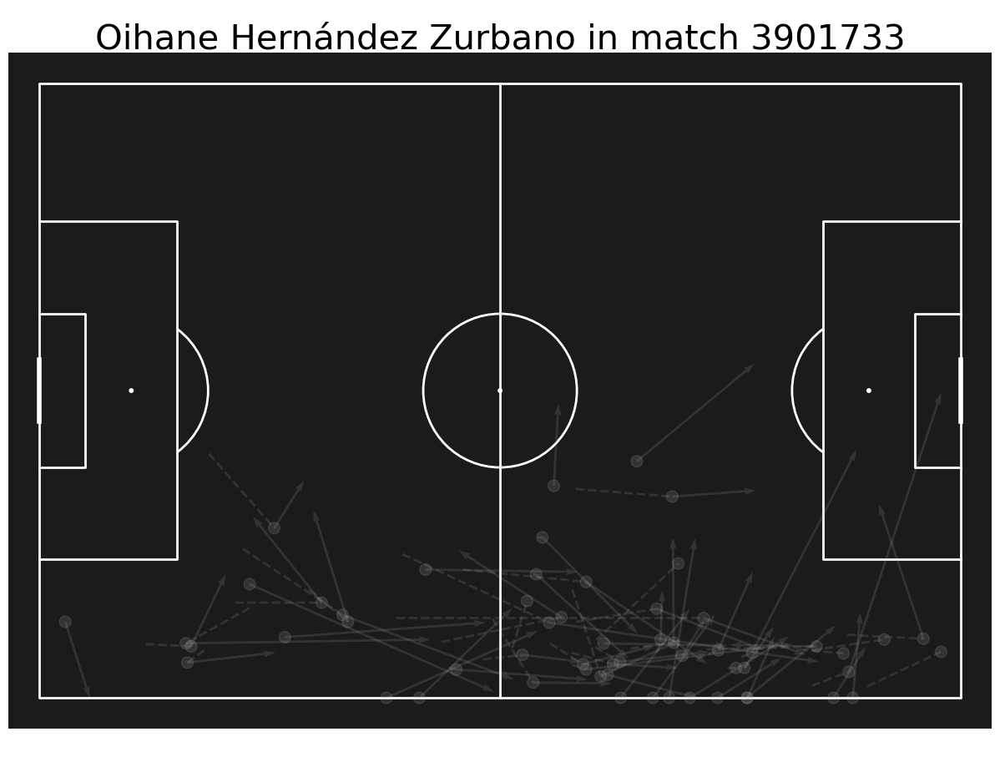

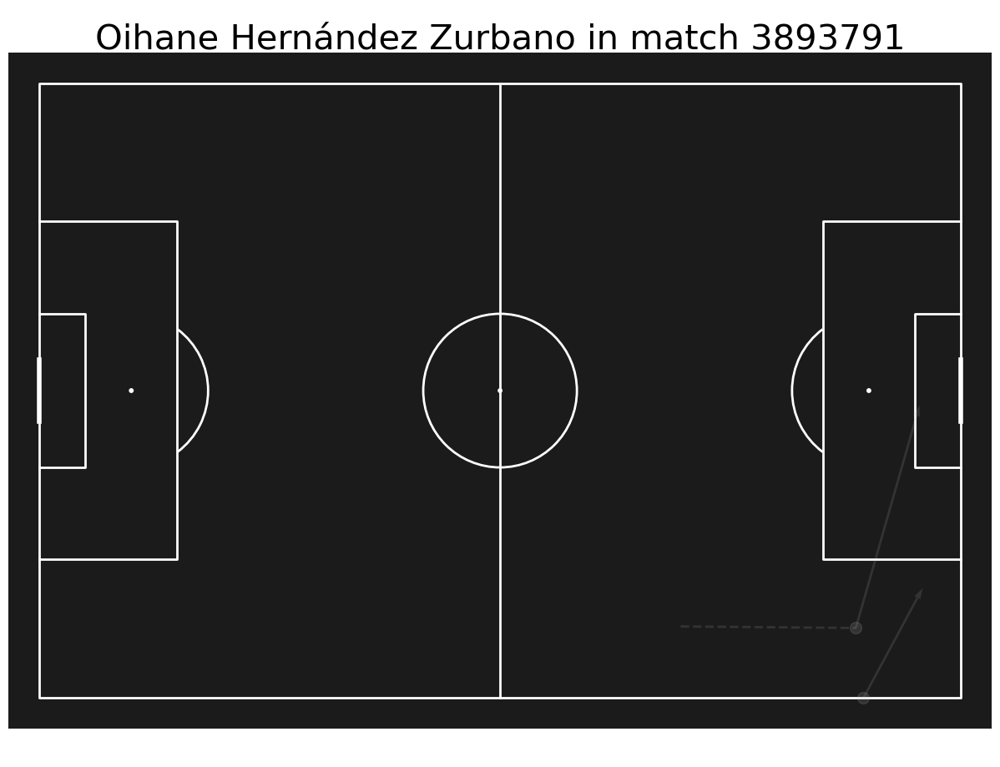

final_type
Carry            2.500000
Carry + Pass    15.666667
Pass             9.666667
dtype: float64
14.25928143712575


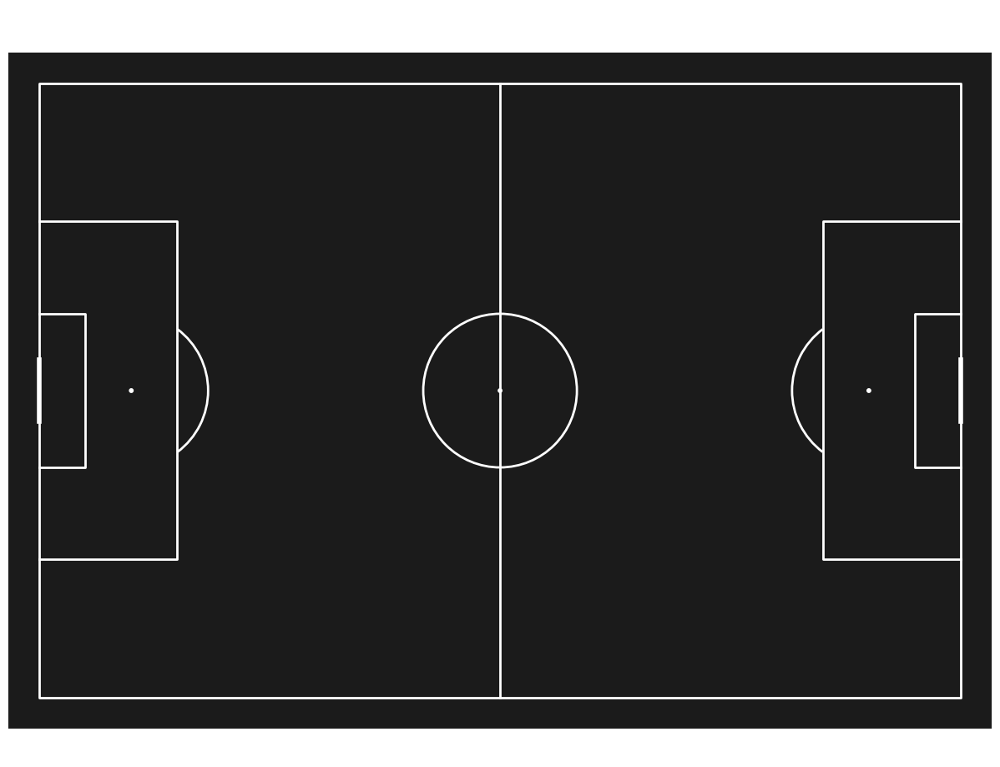

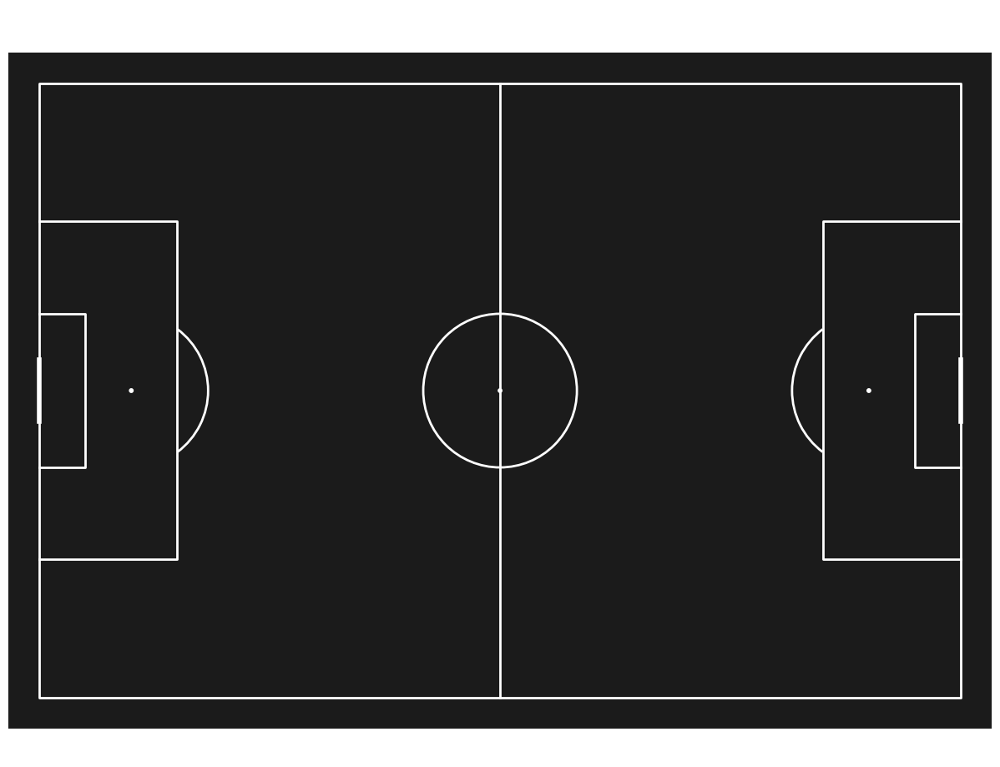

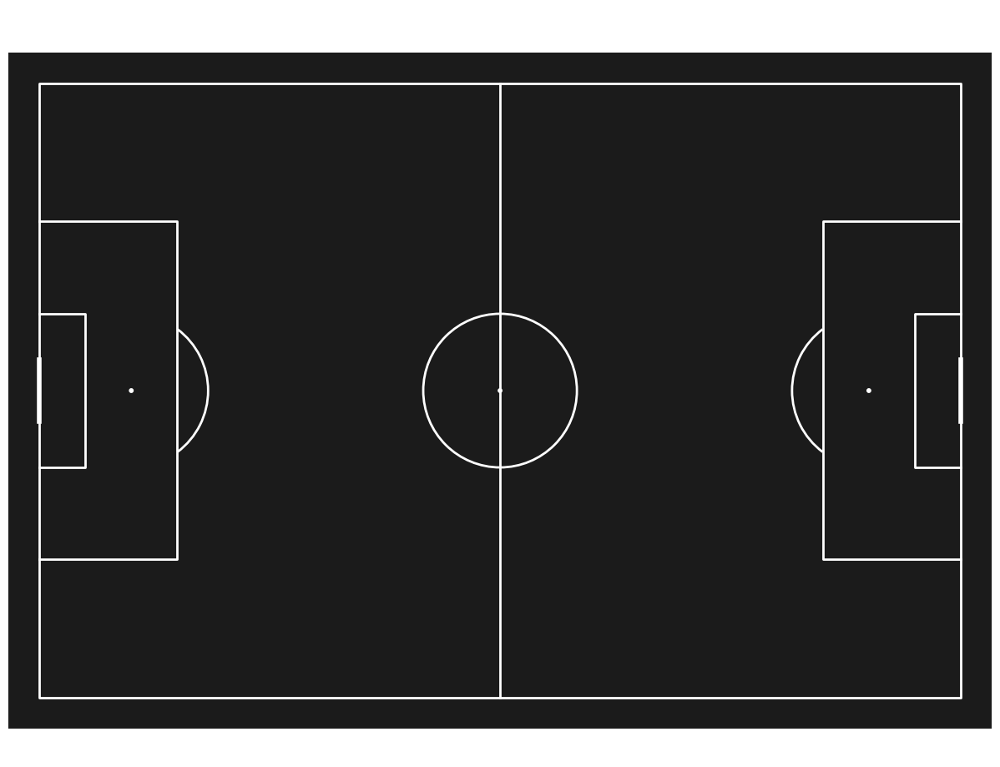

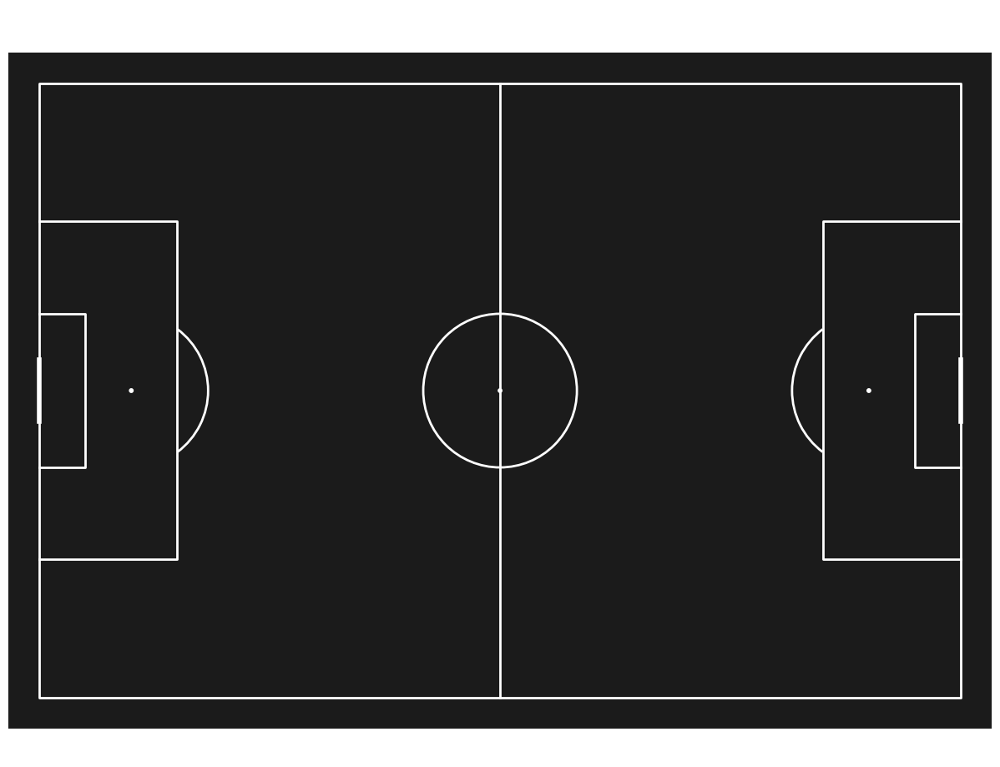

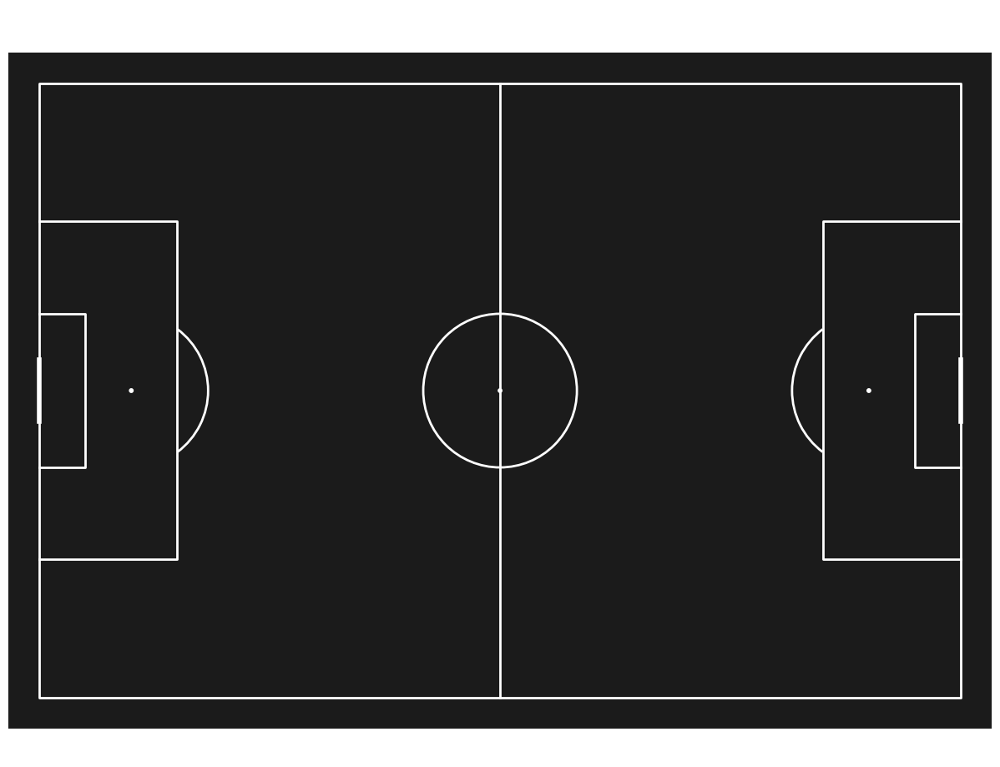

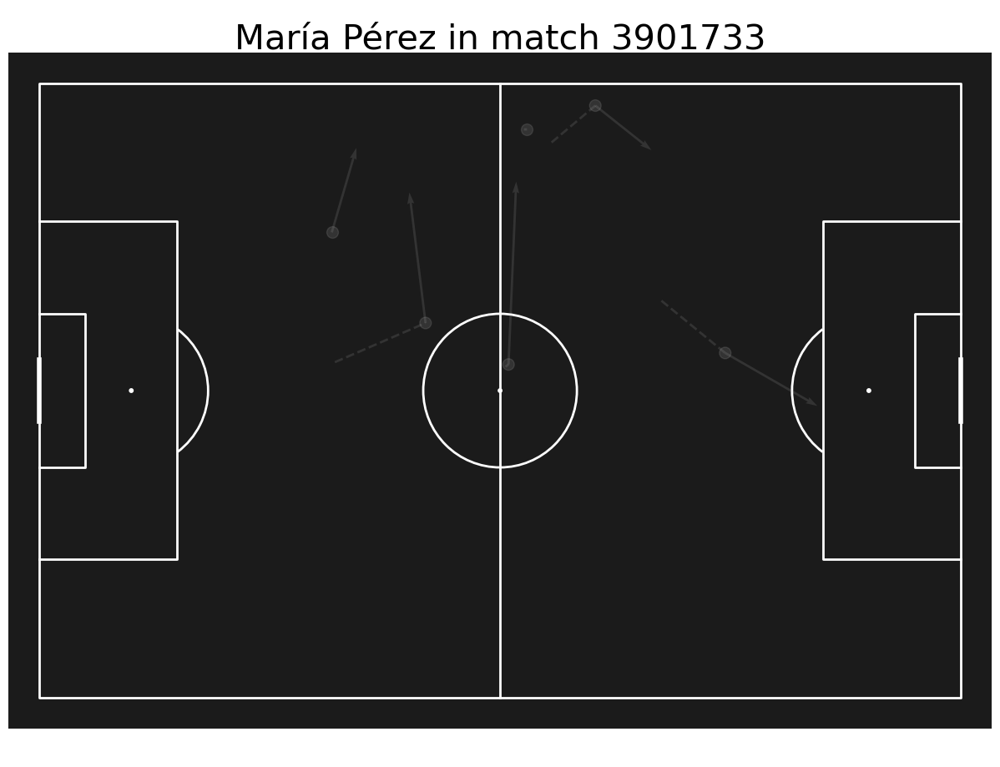

final_type
Carry           1.0
Carry + Pass    4.0
Pass            1.0
dtype: float64
7.999999999999999


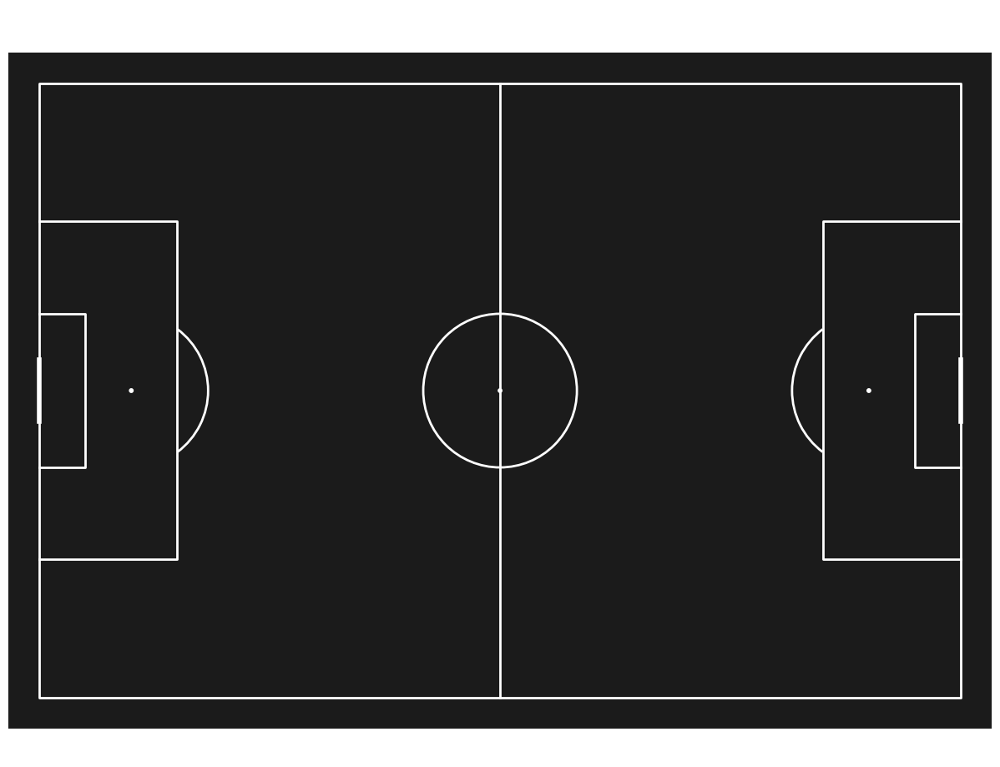

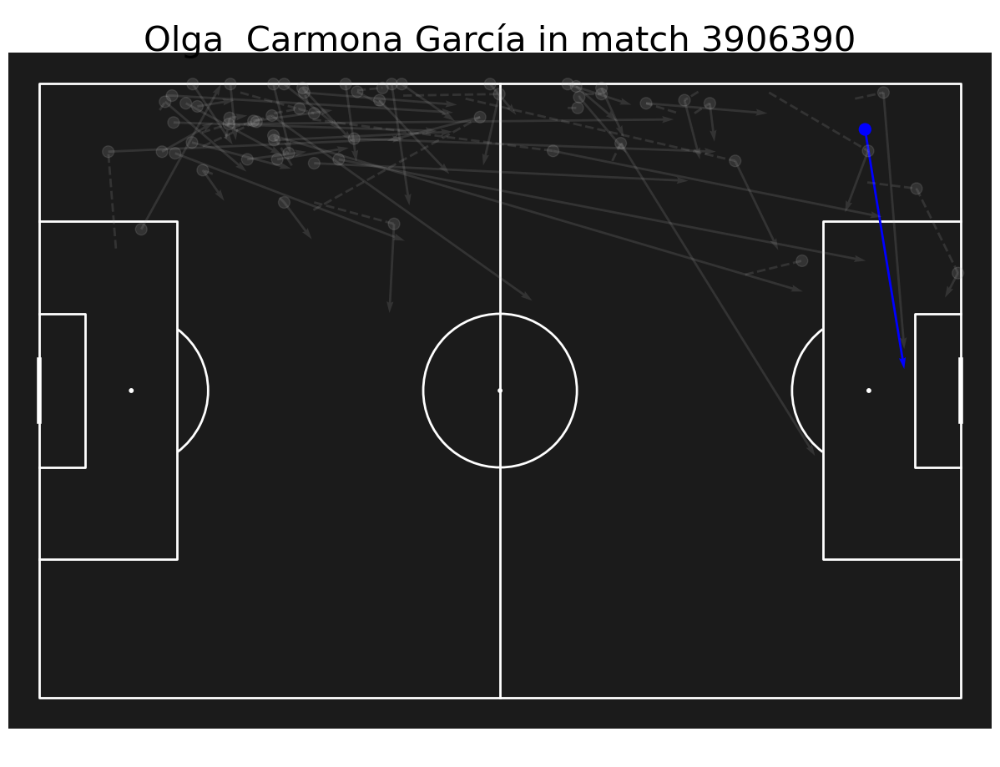

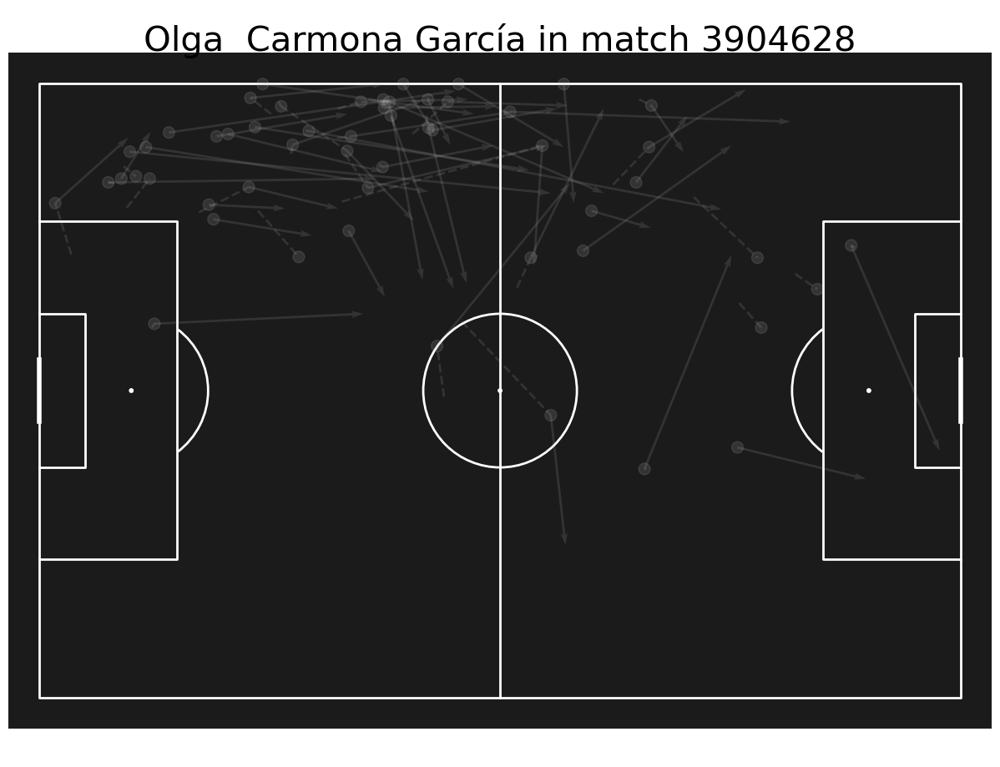

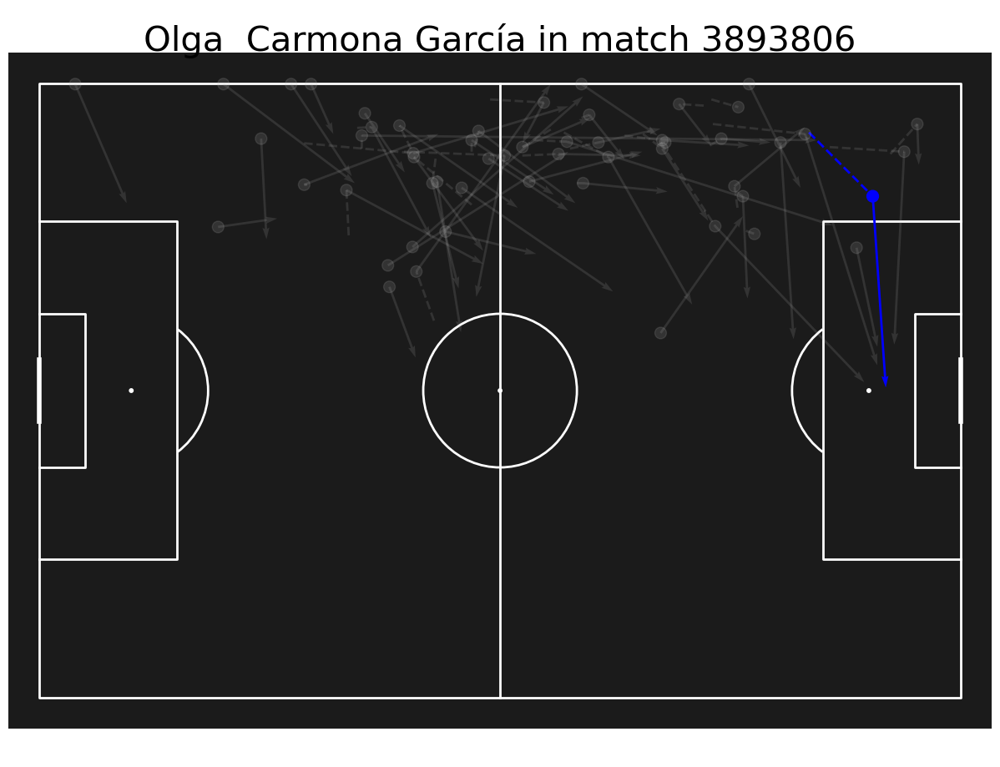

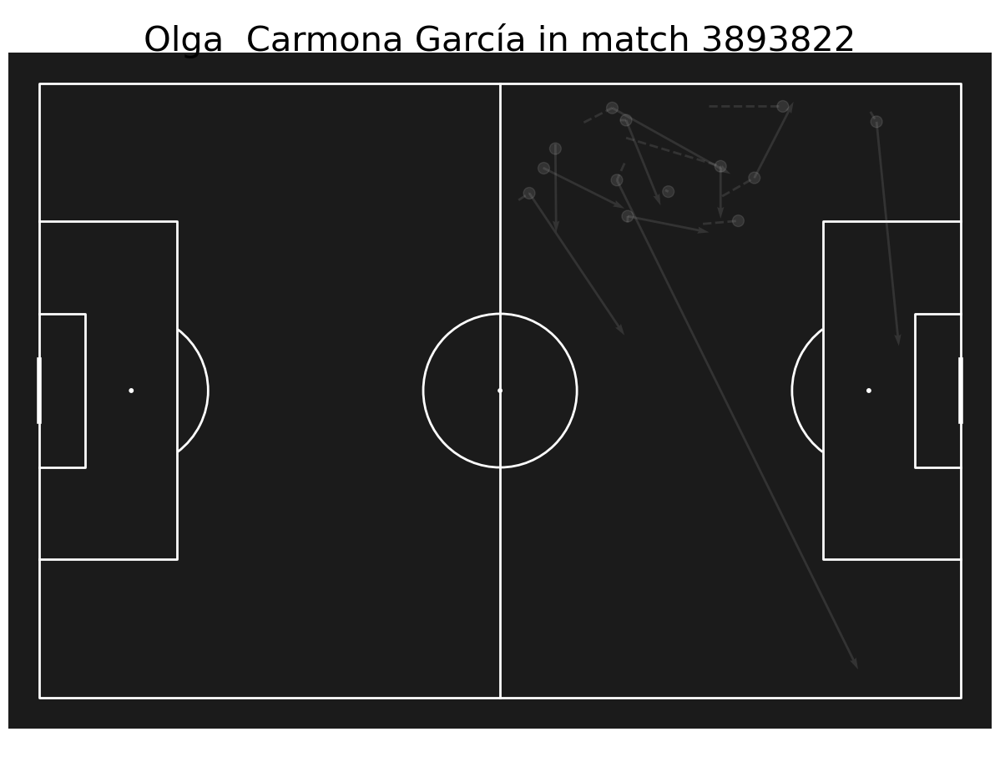

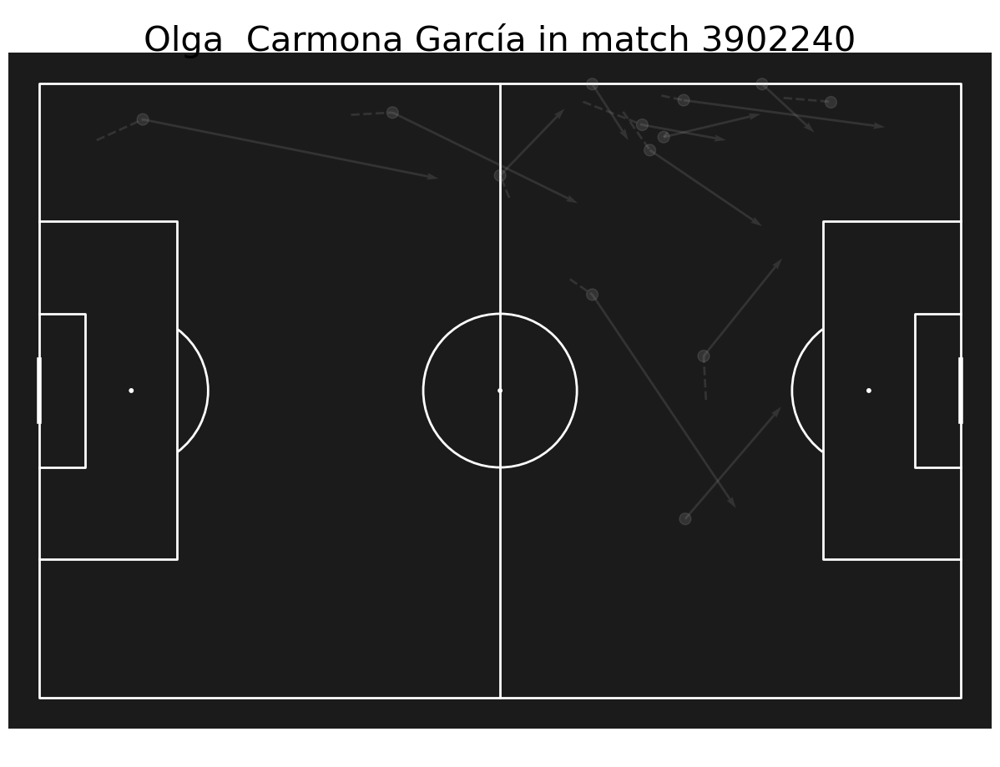

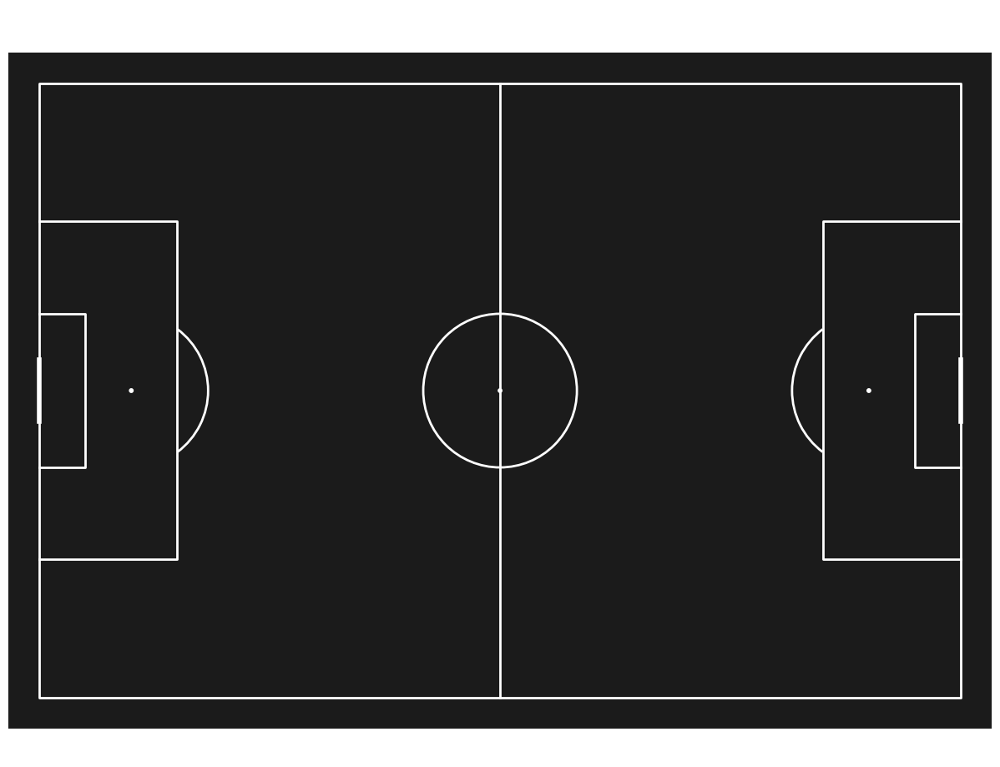

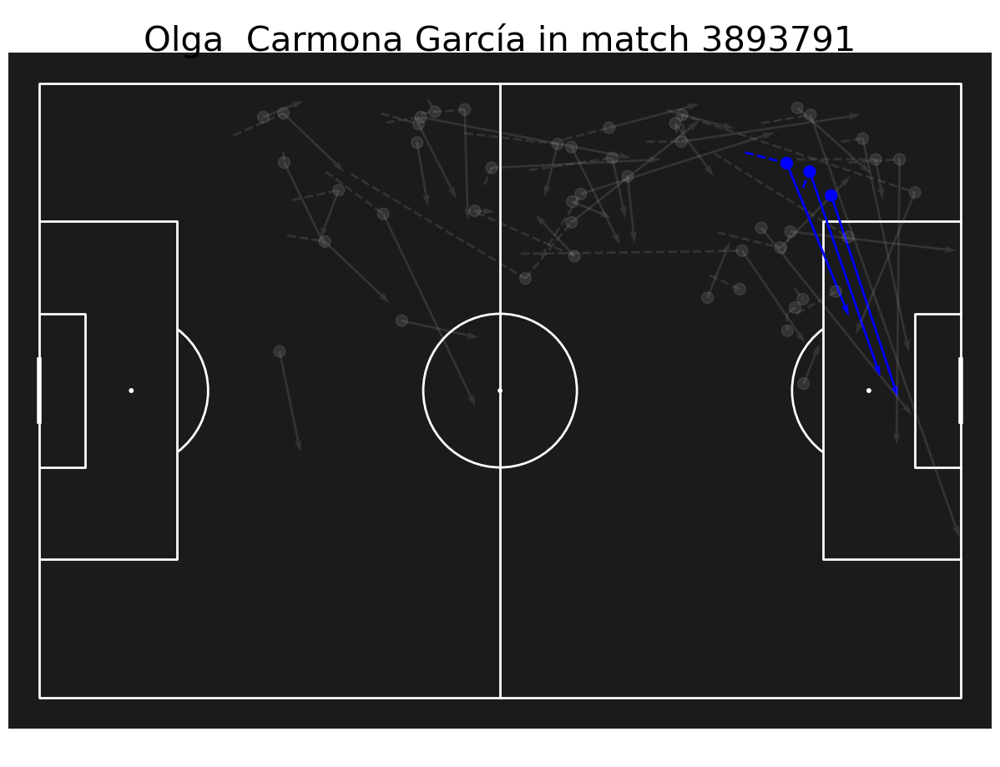

final_type
Carry            5.166667
Carry + Pass    23.500000
Pass            12.000000
dtype: float64
13.743852459016393


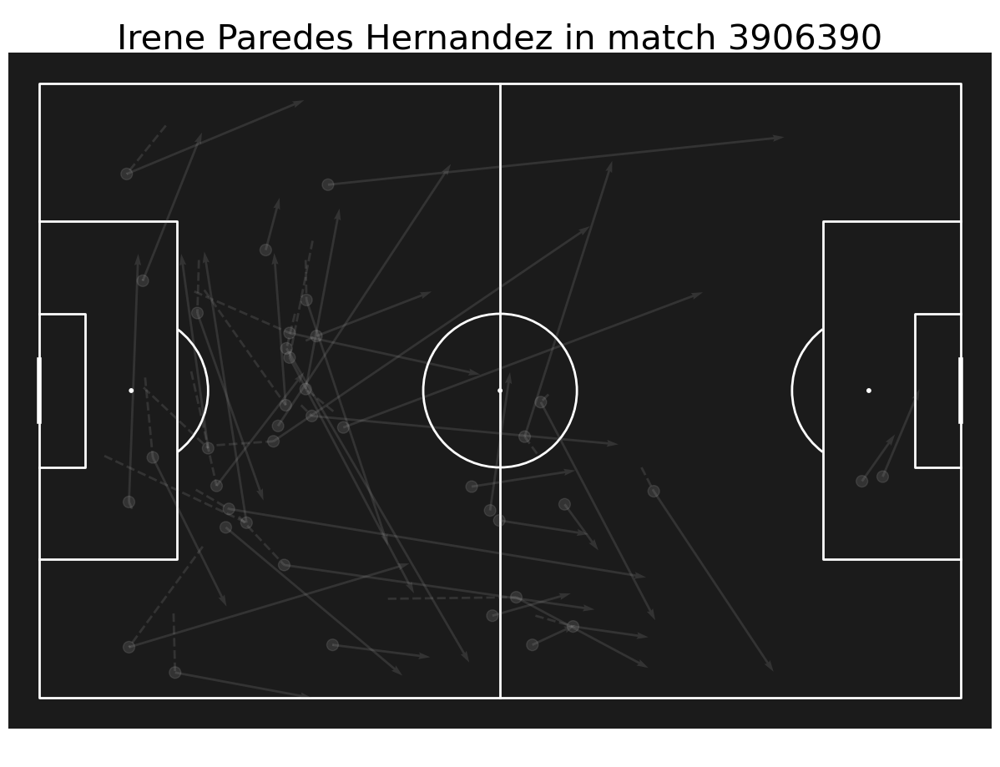

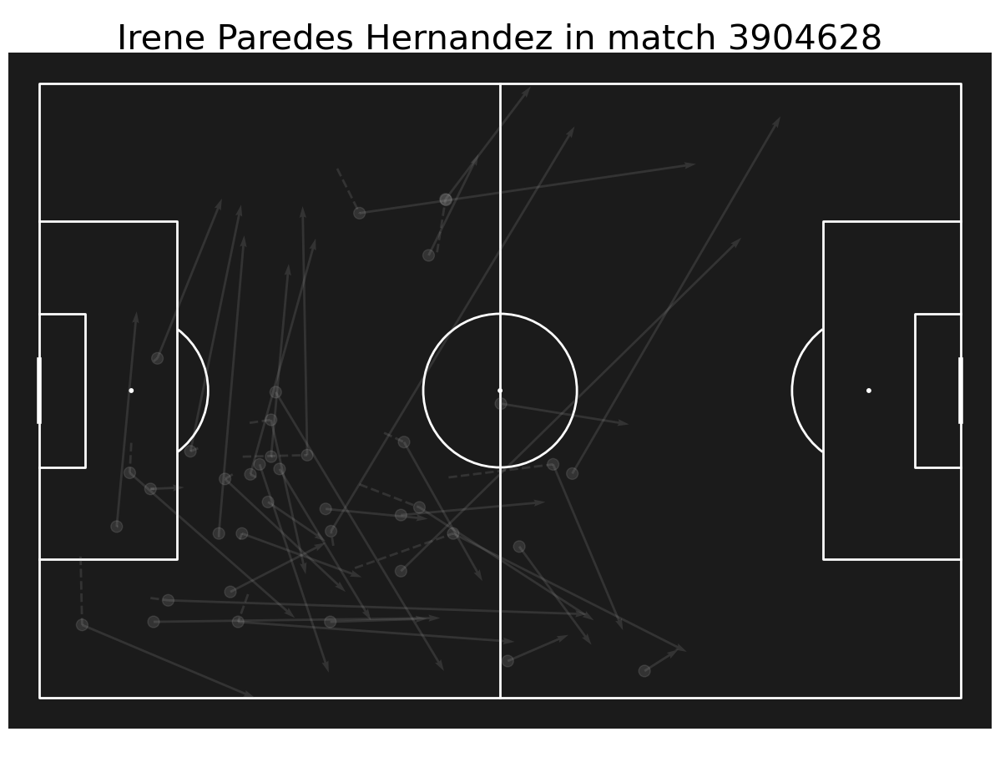

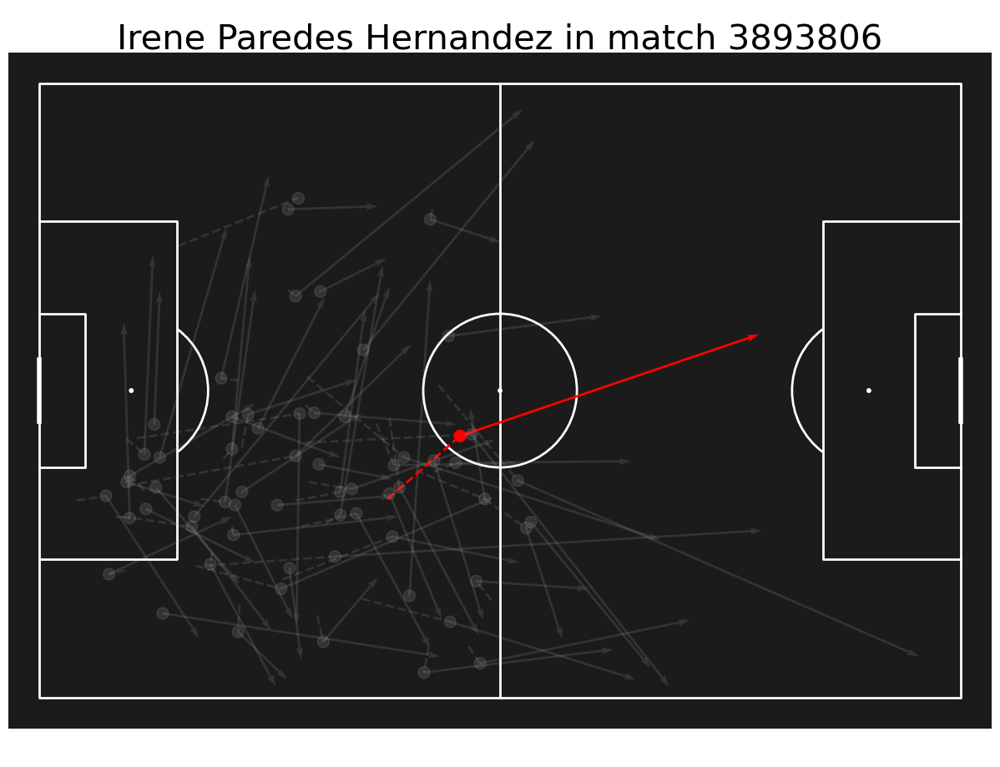

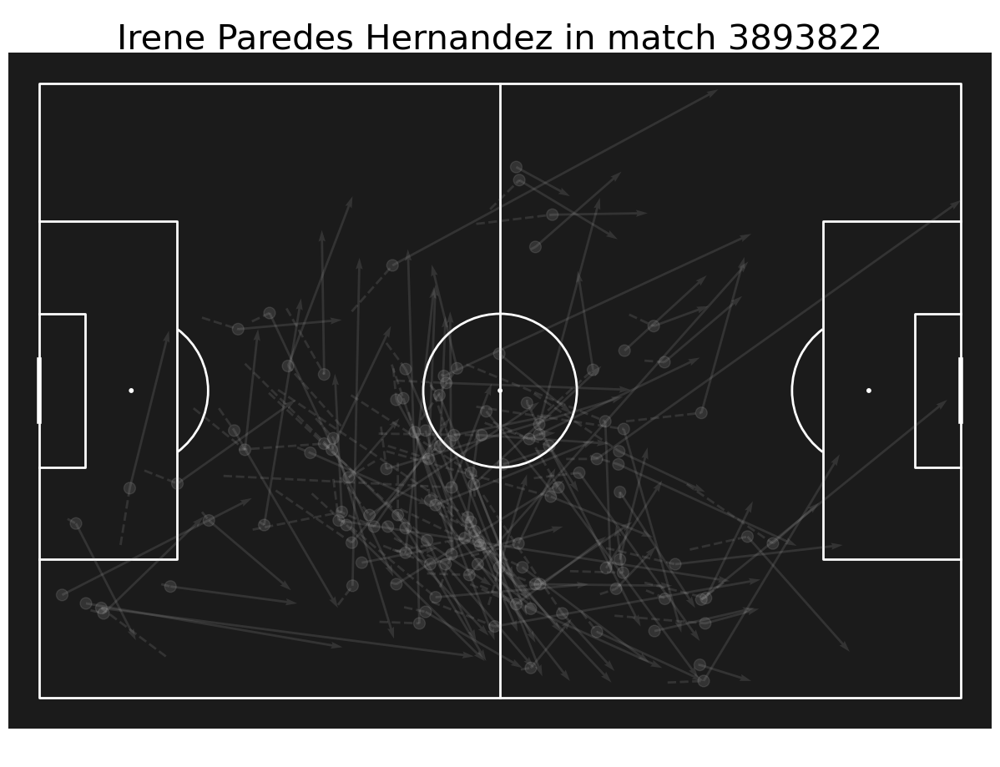

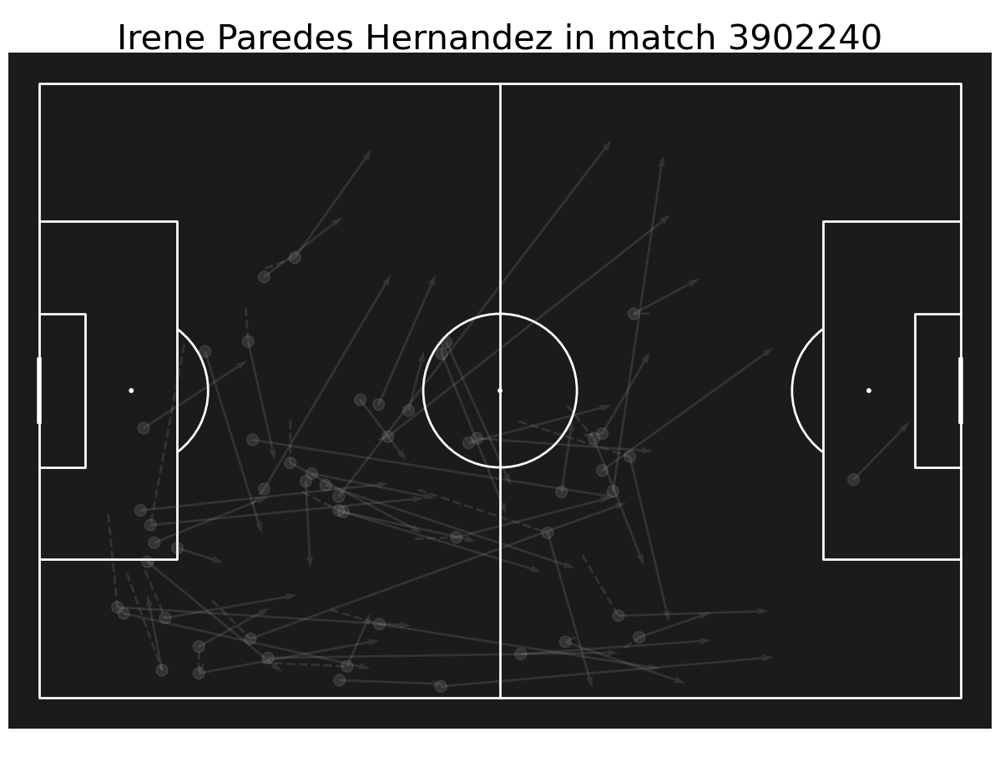

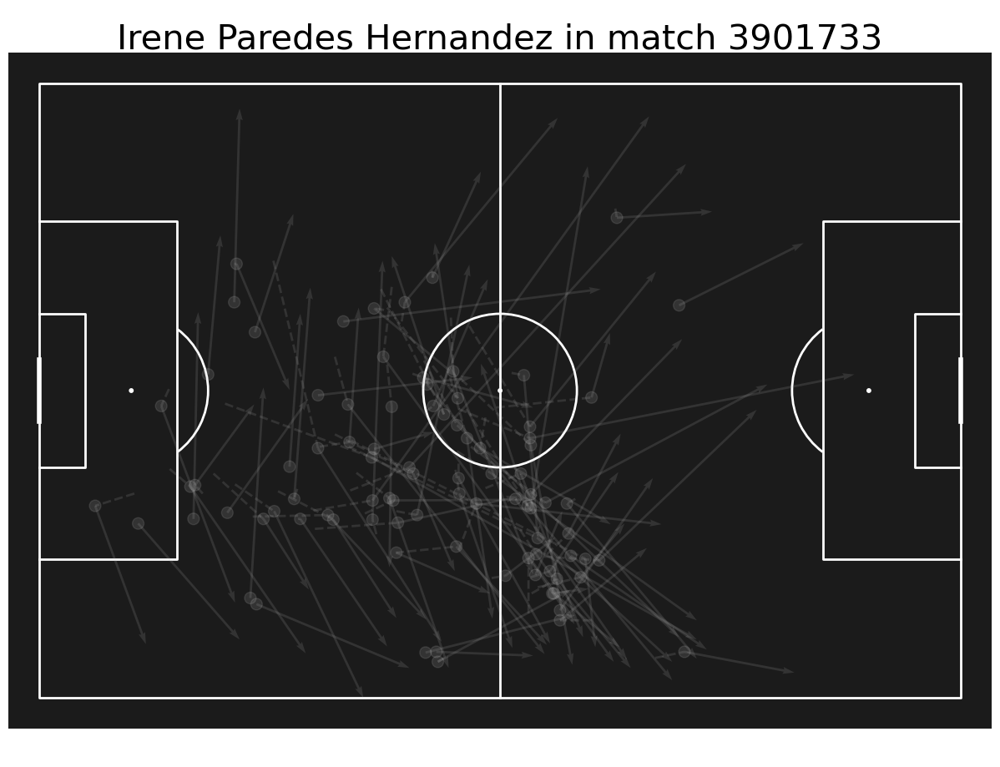

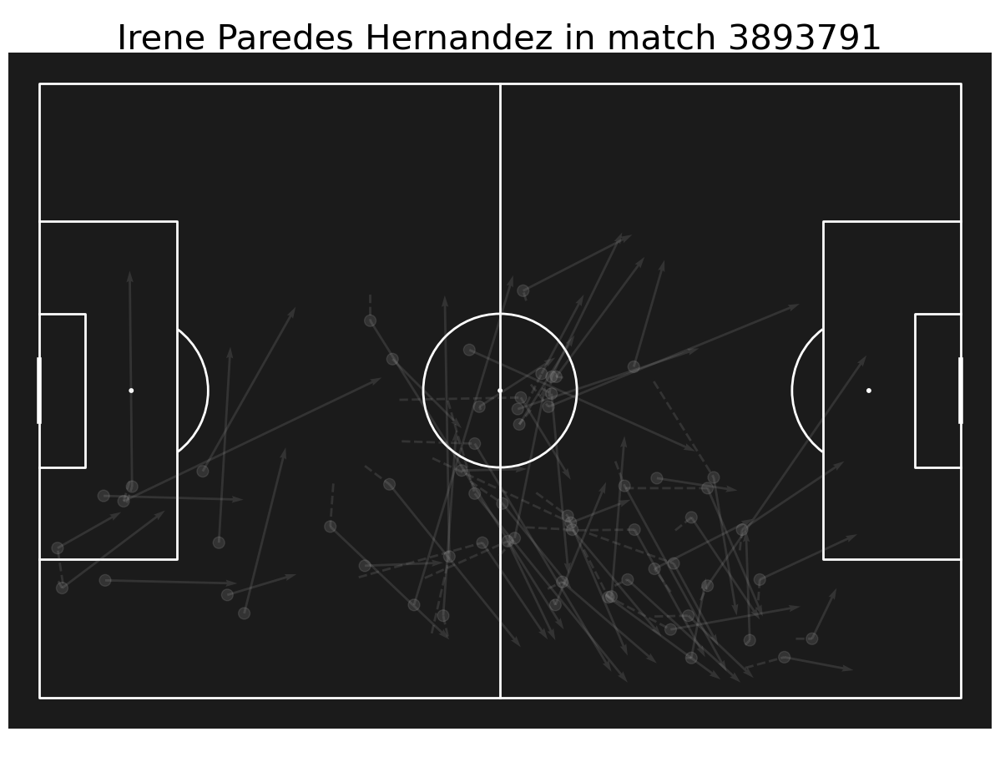

final_type
Carry            0.428571
Carry + Pass    51.142857
Pass            15.142857
dtype: float64
16.736188436830833


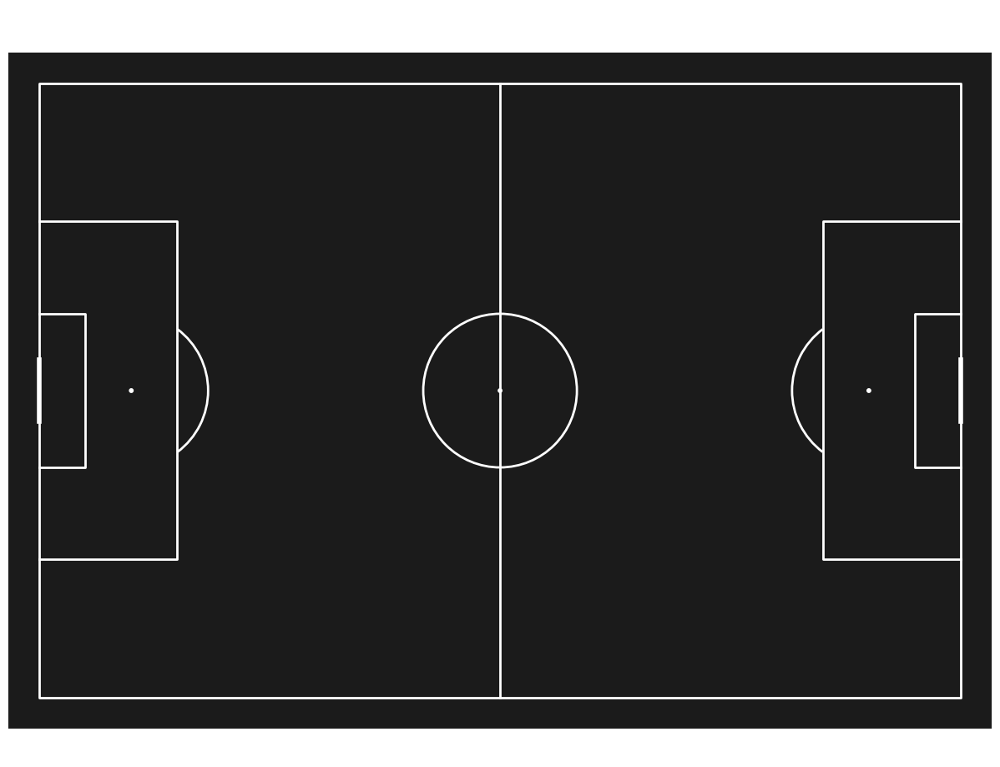

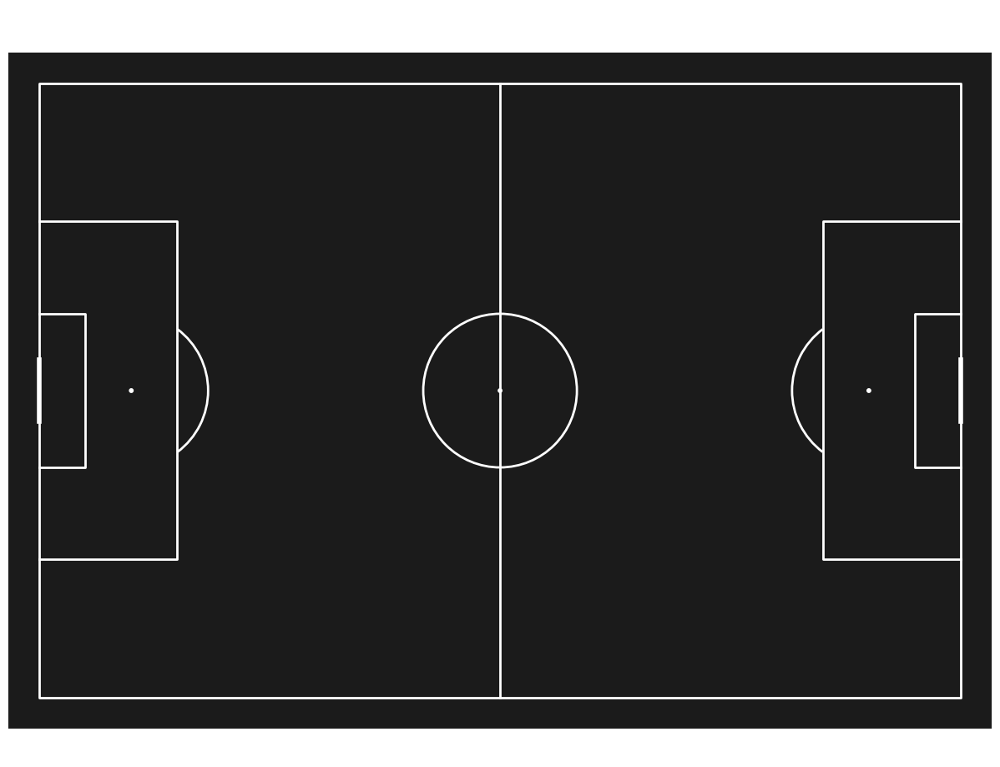

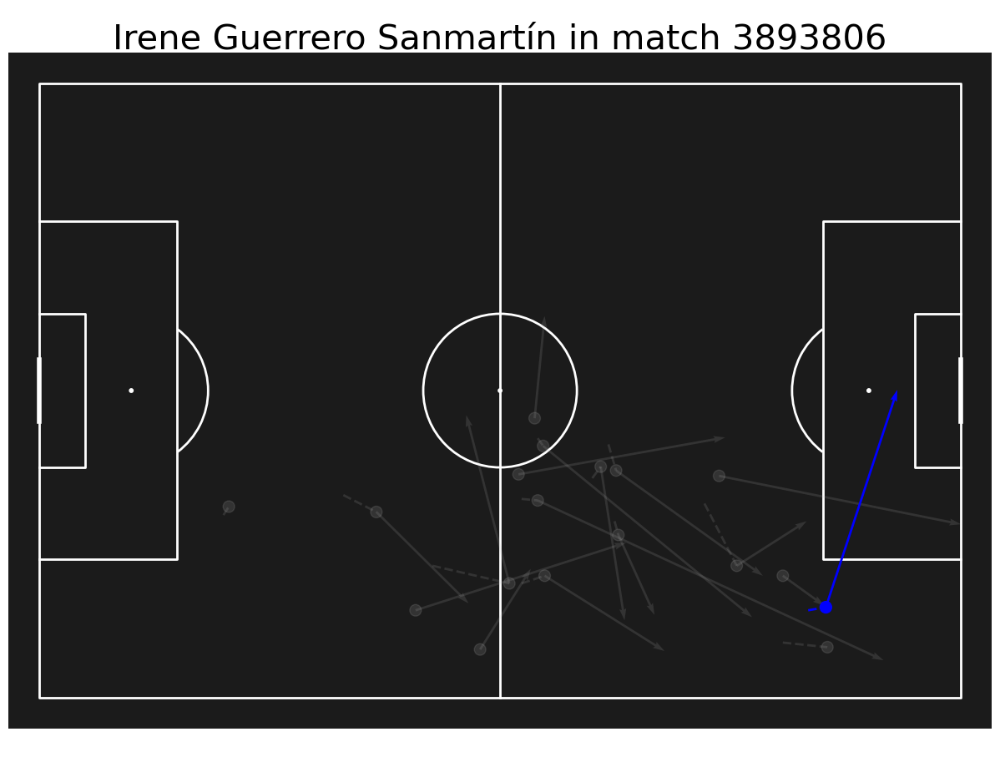

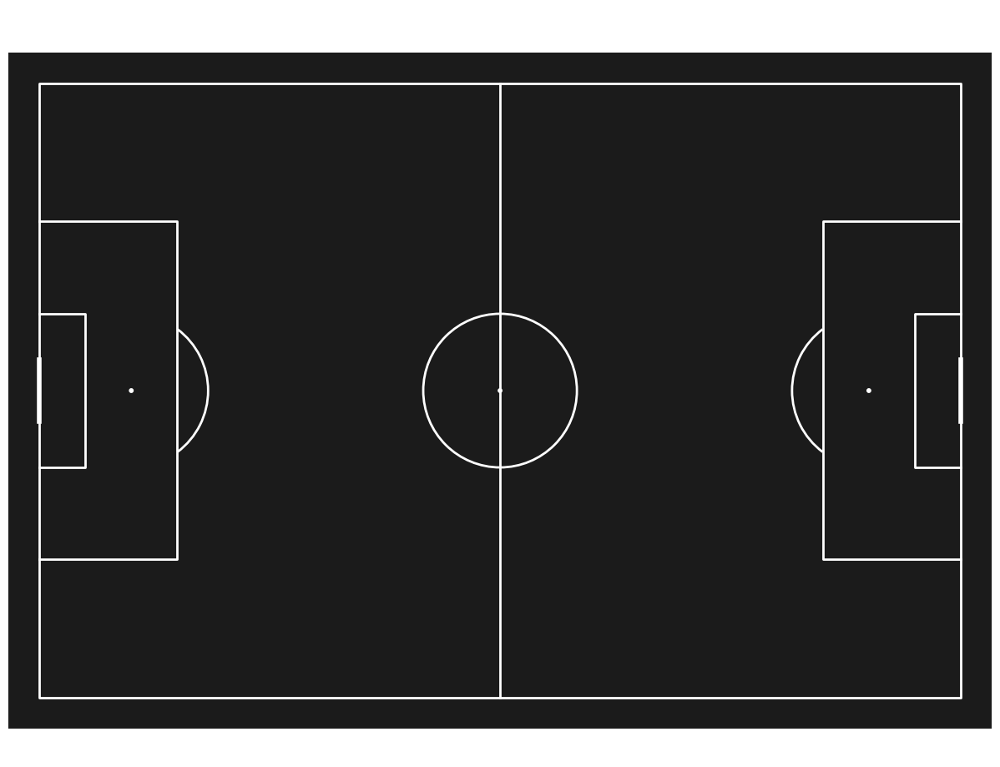

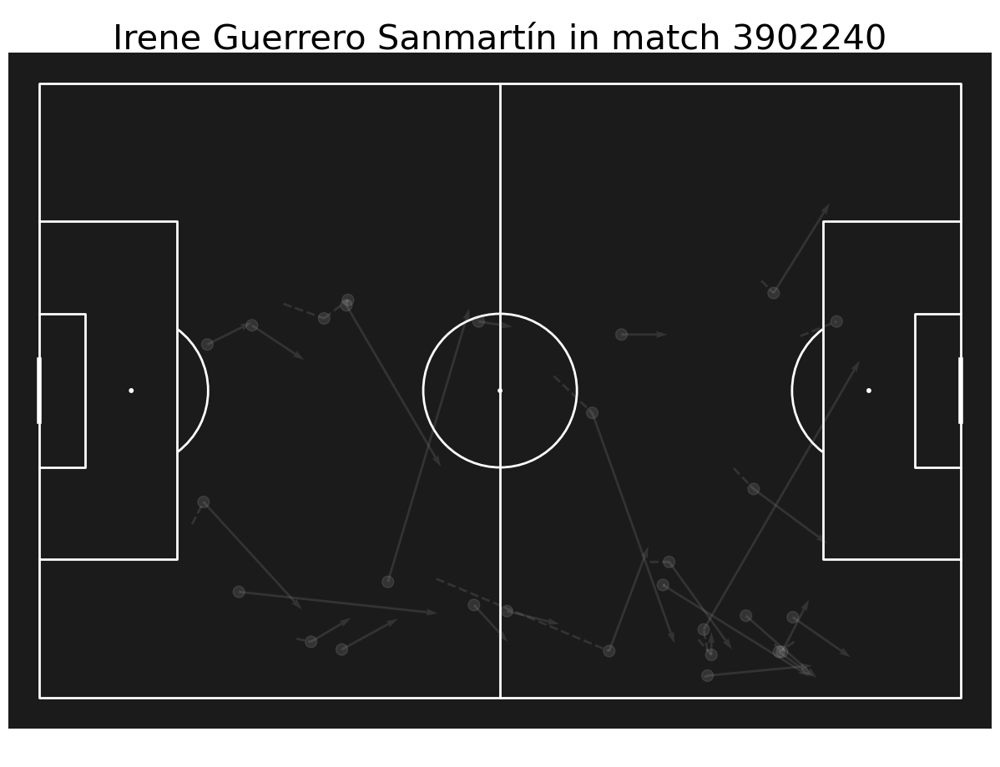

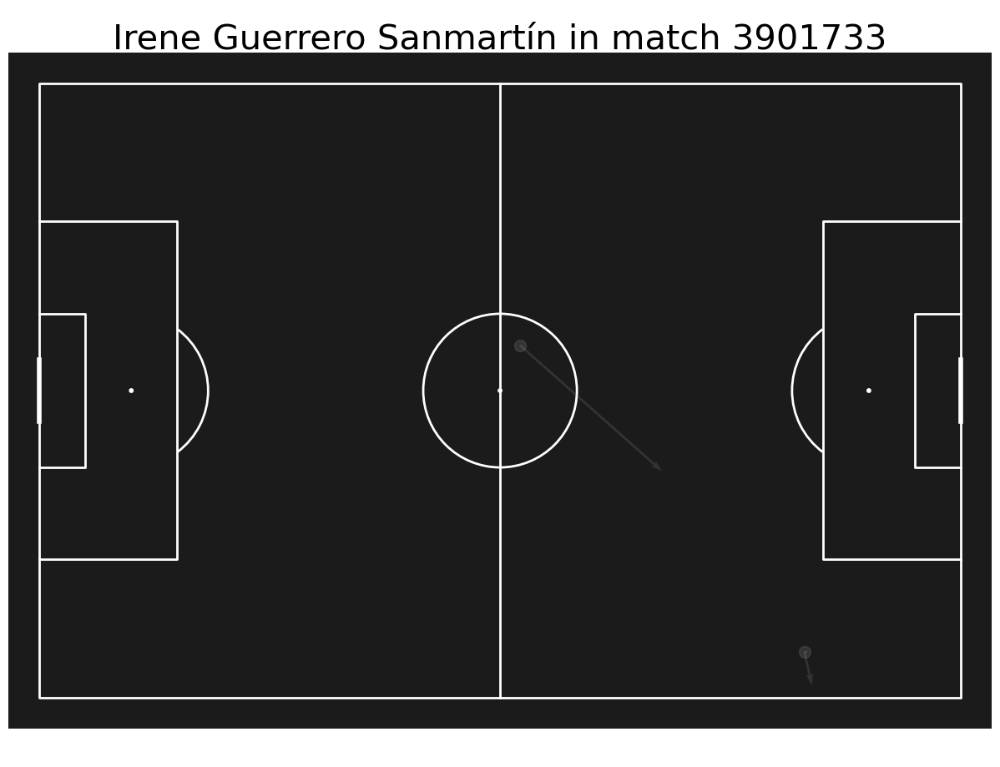

final_type
Carry           1.666667
Carry + Pass    8.666667
Pass            5.666667
dtype: float64
11.895833333333334


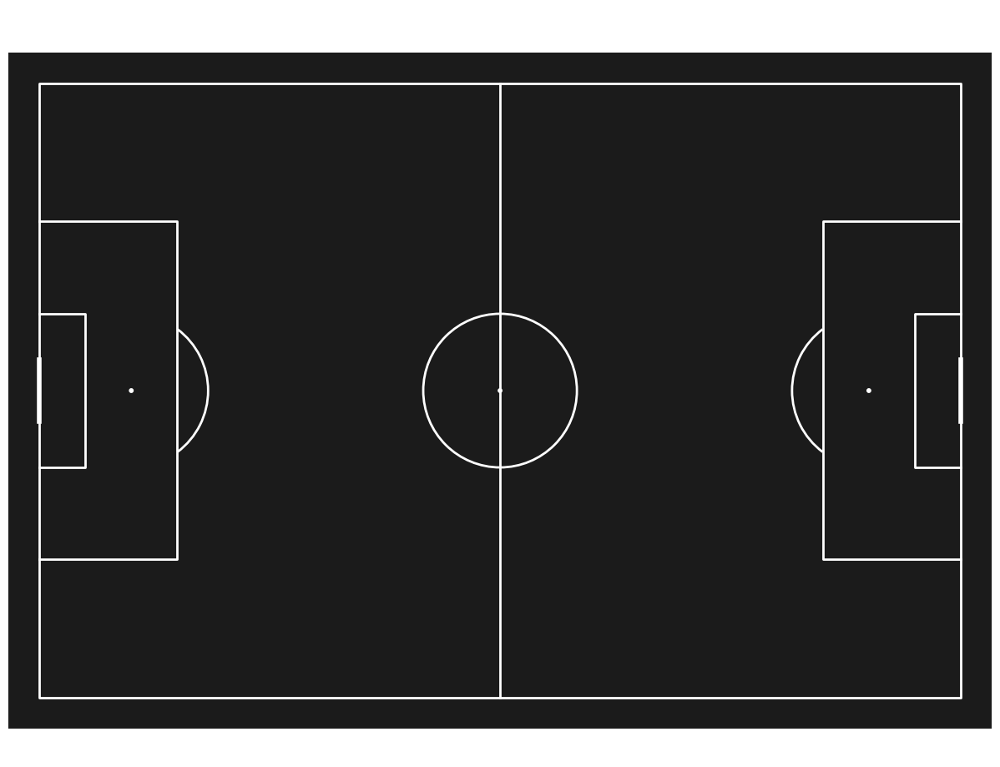

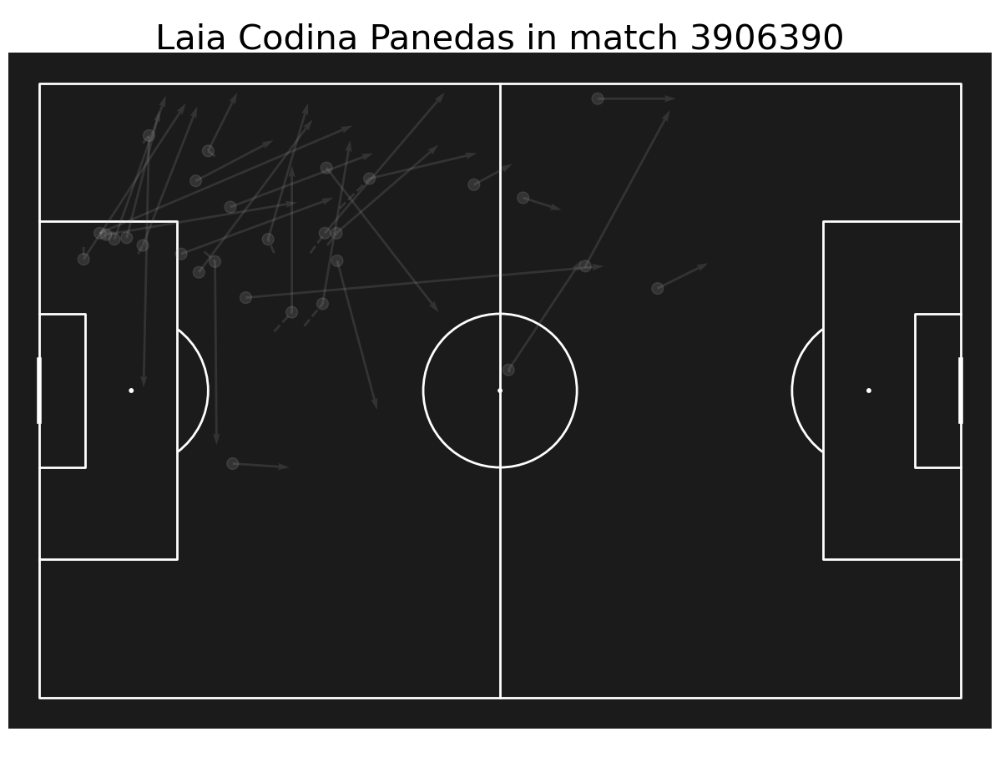

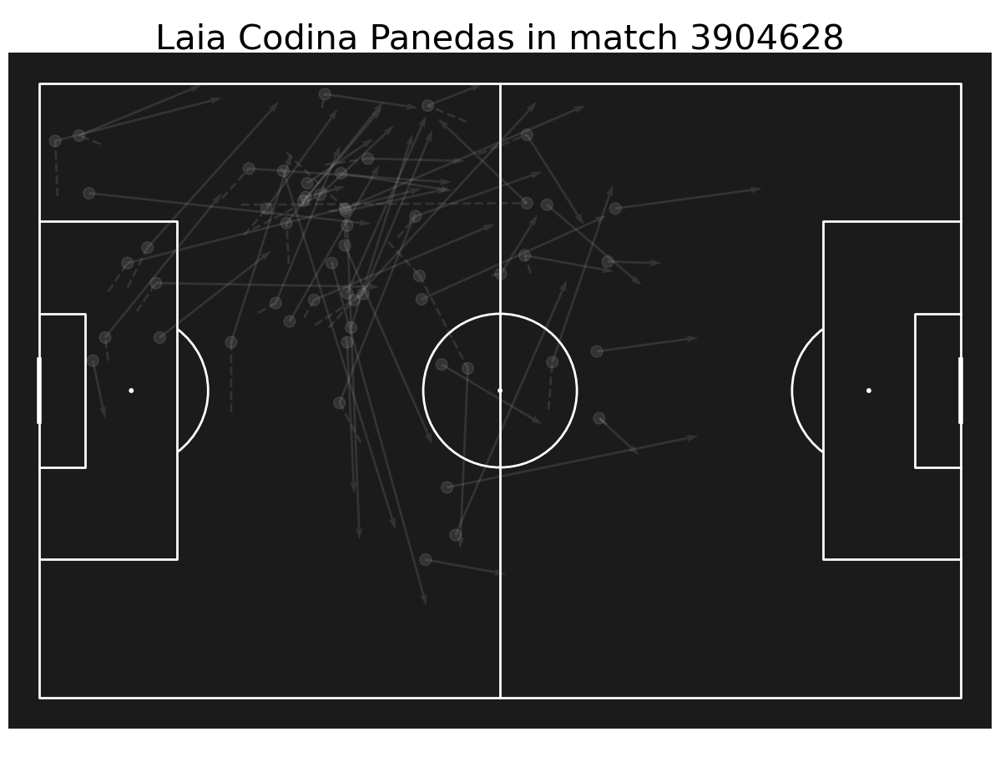

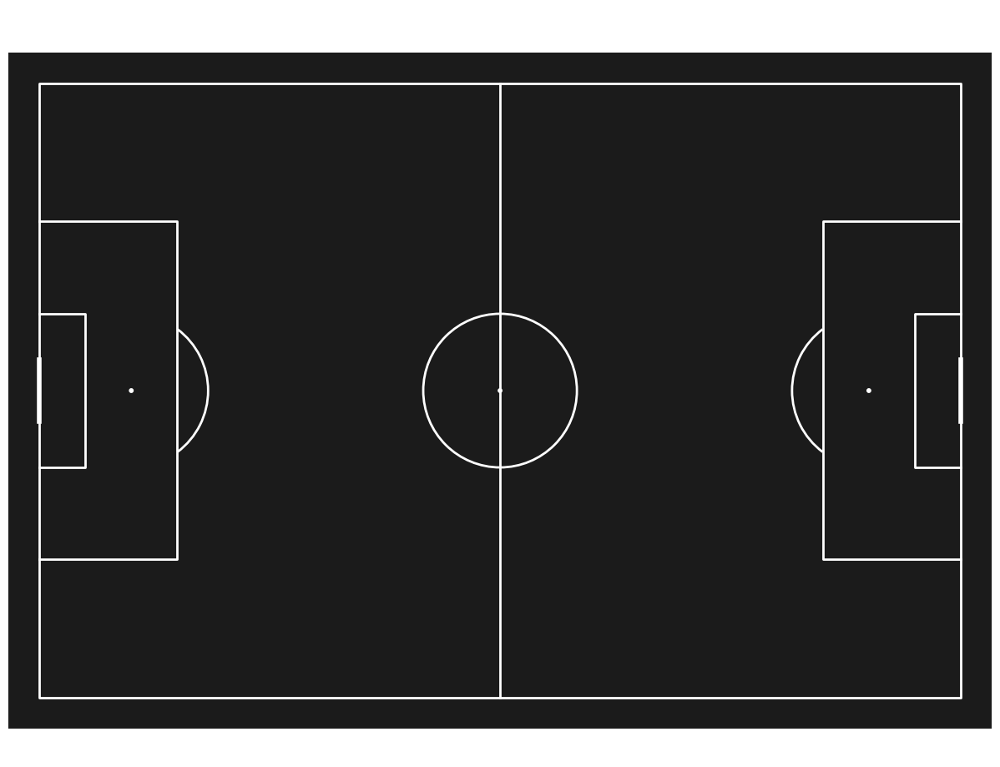

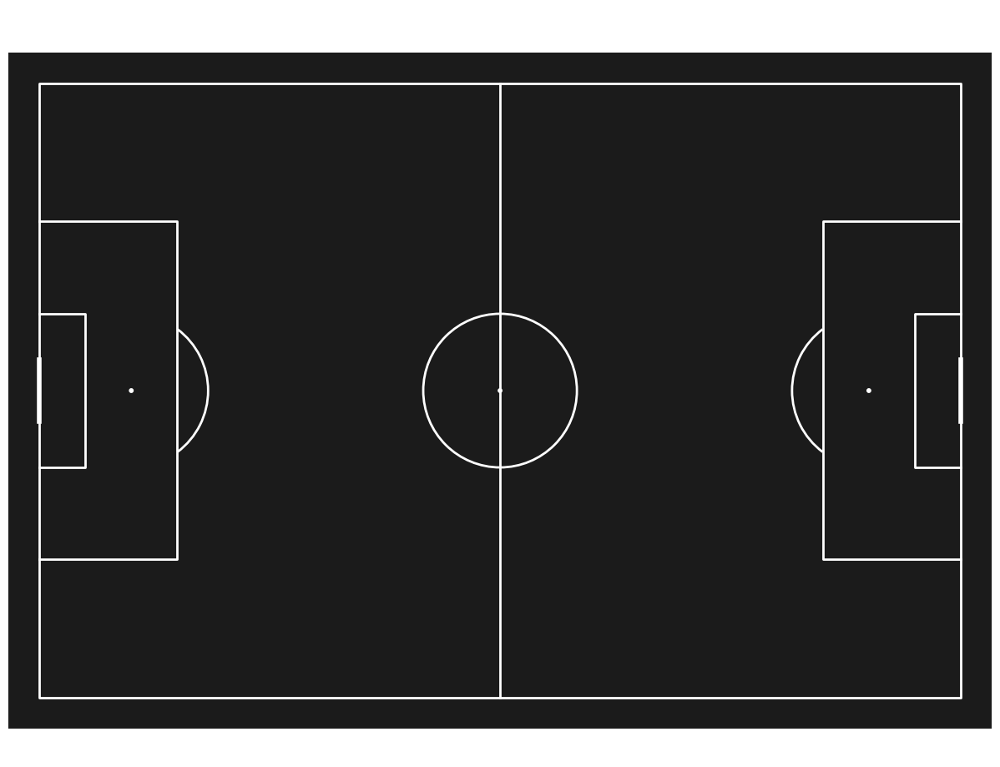

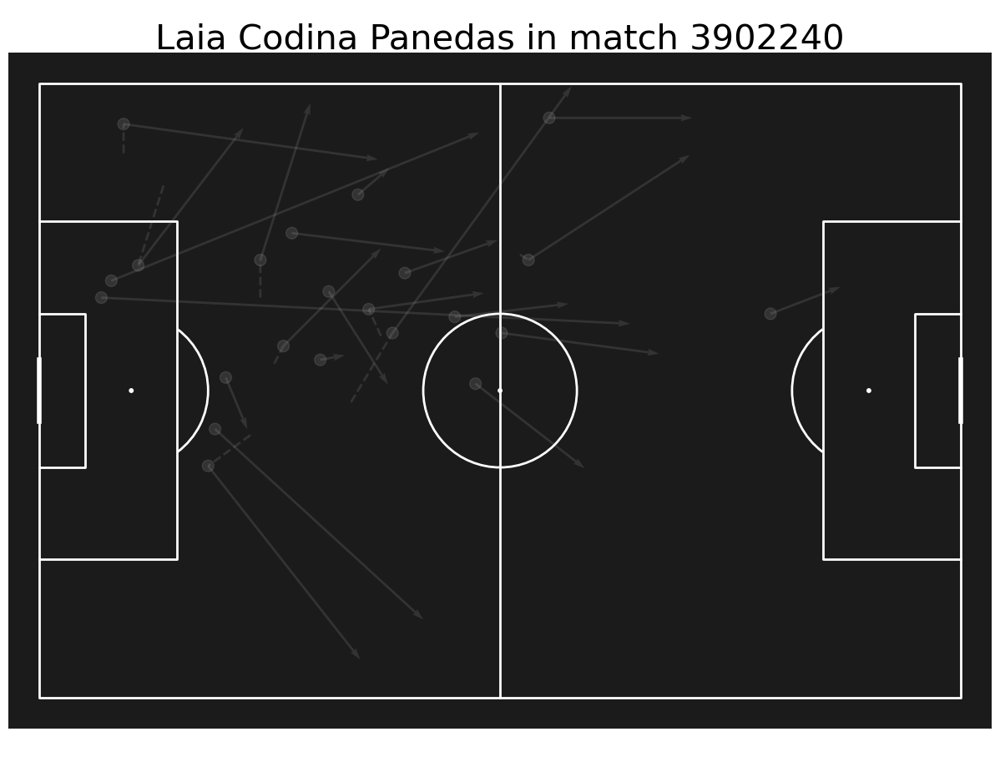

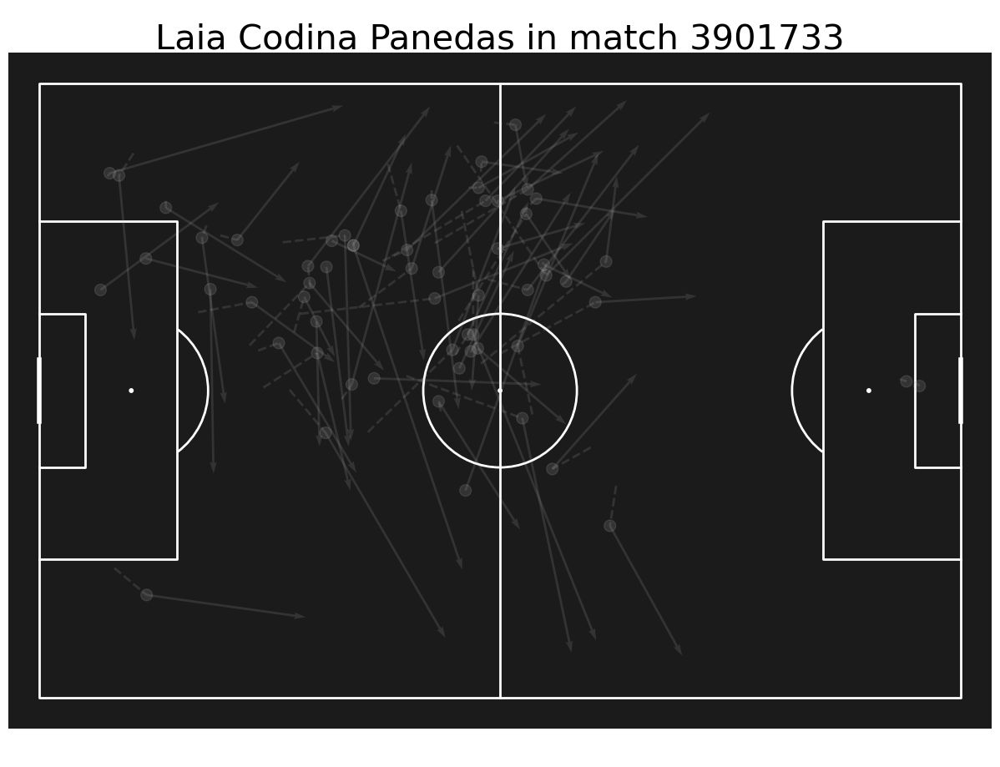

final_type
Carry            0.75
Carry + Pass    29.75
Pass            10.75
dtype: float64
14.090909090909092


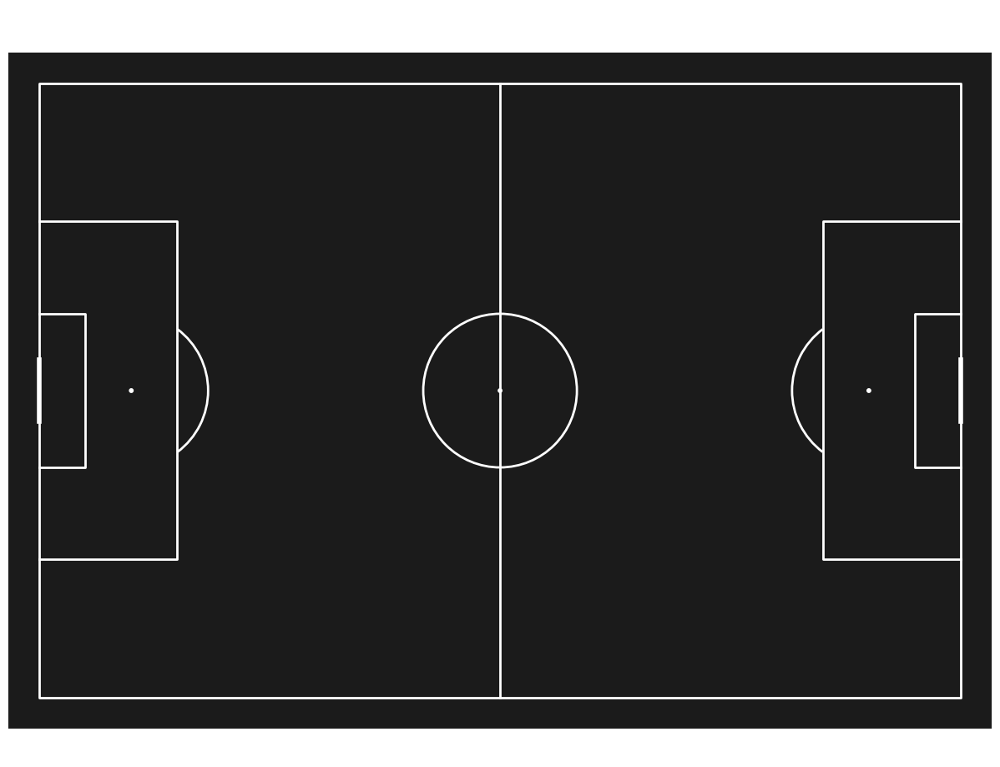

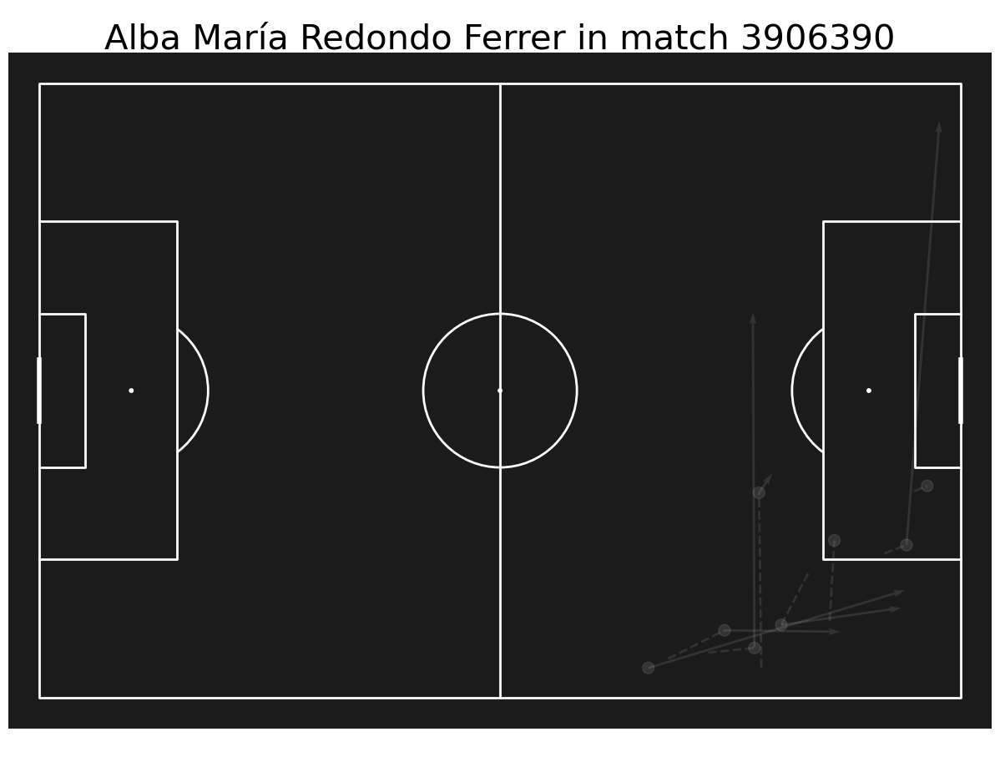

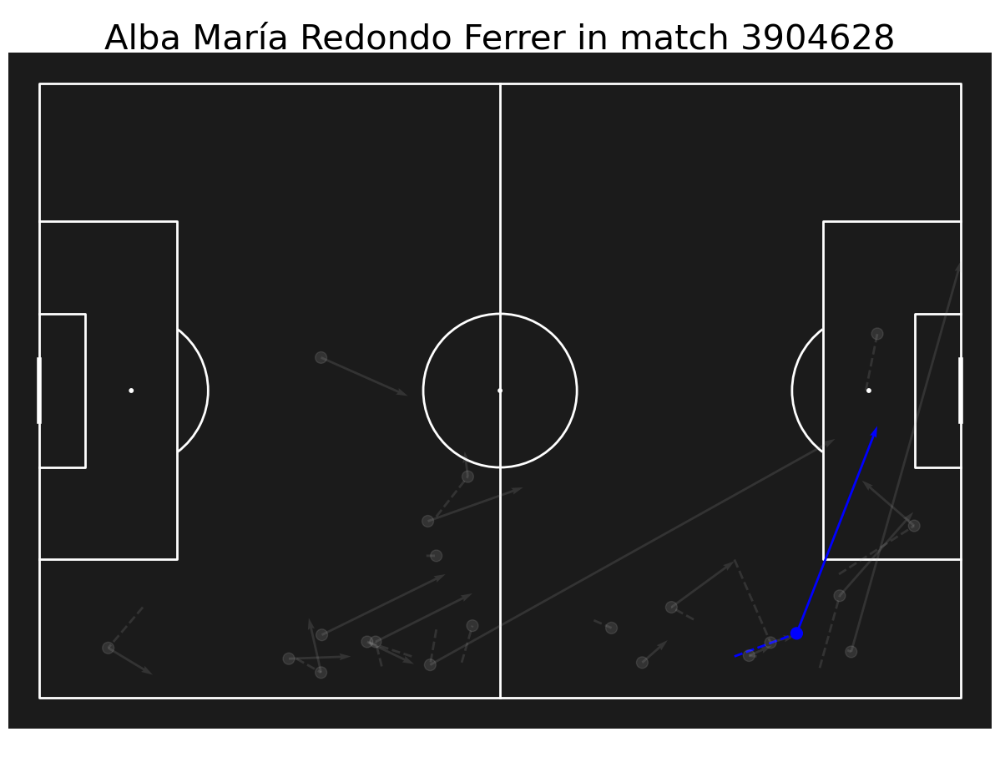

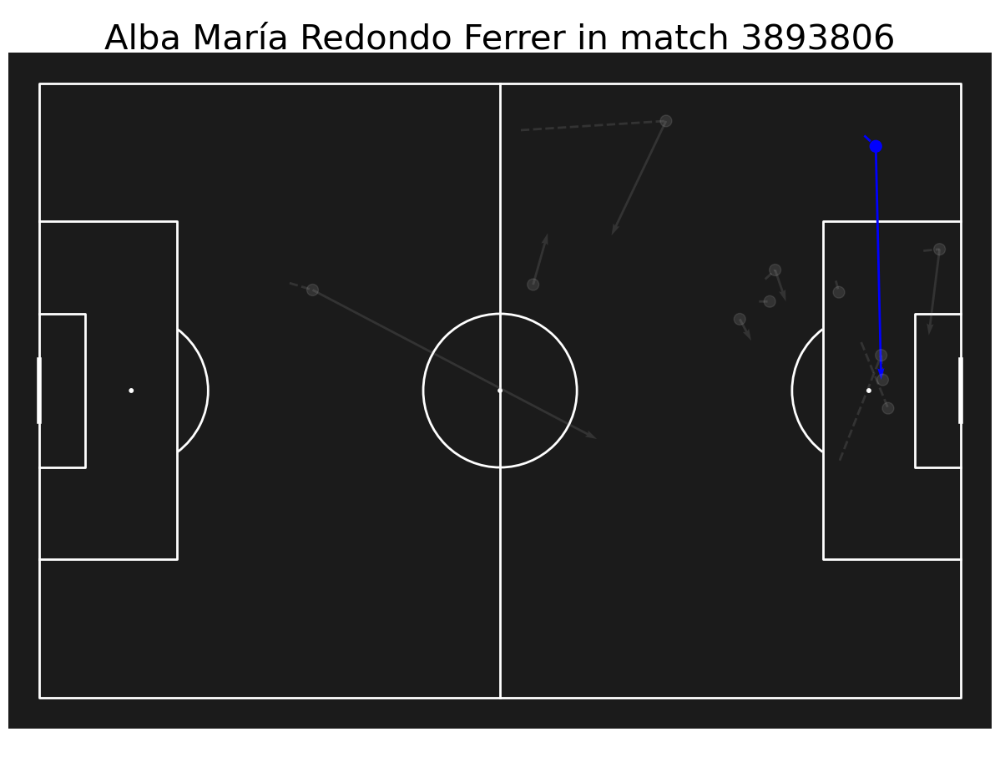

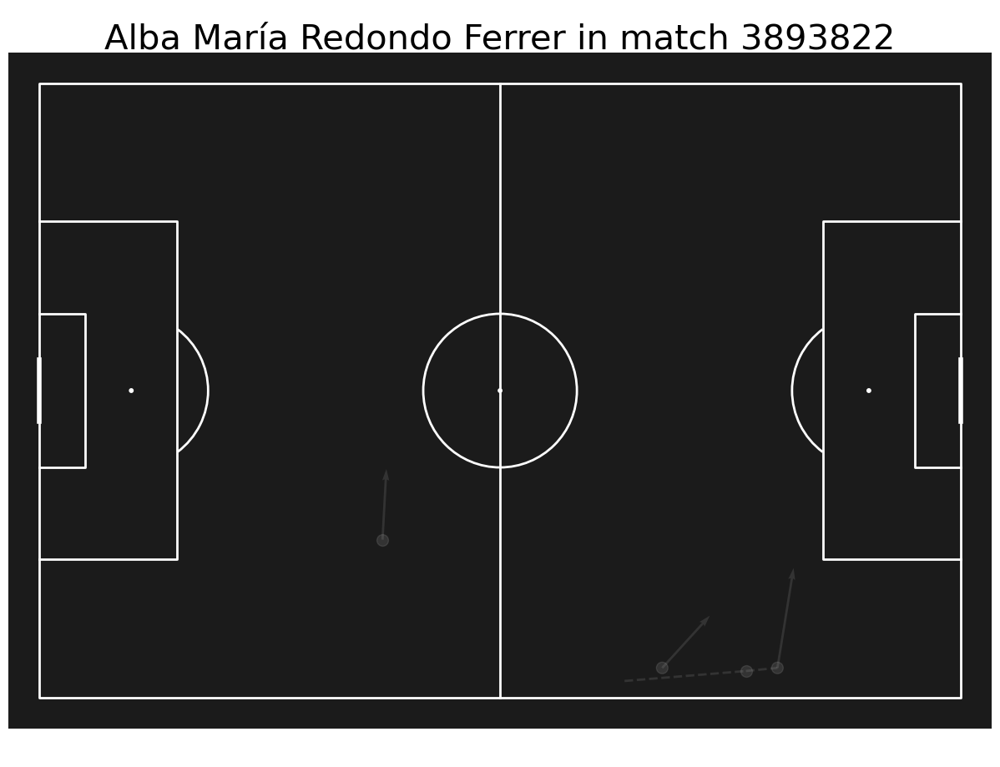

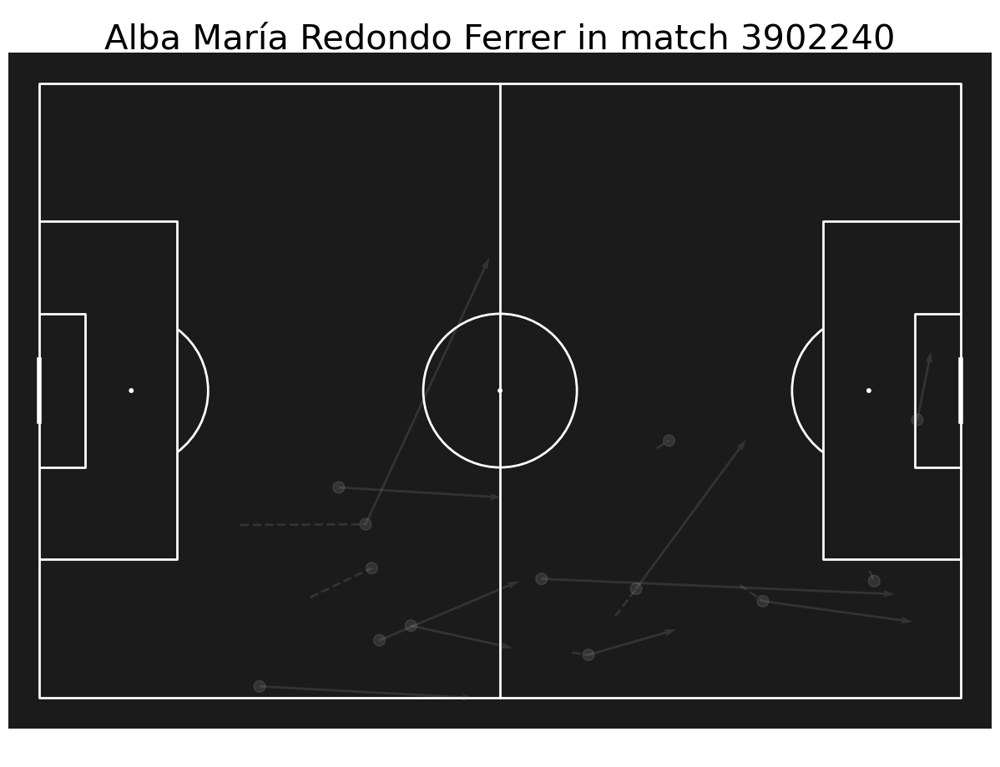

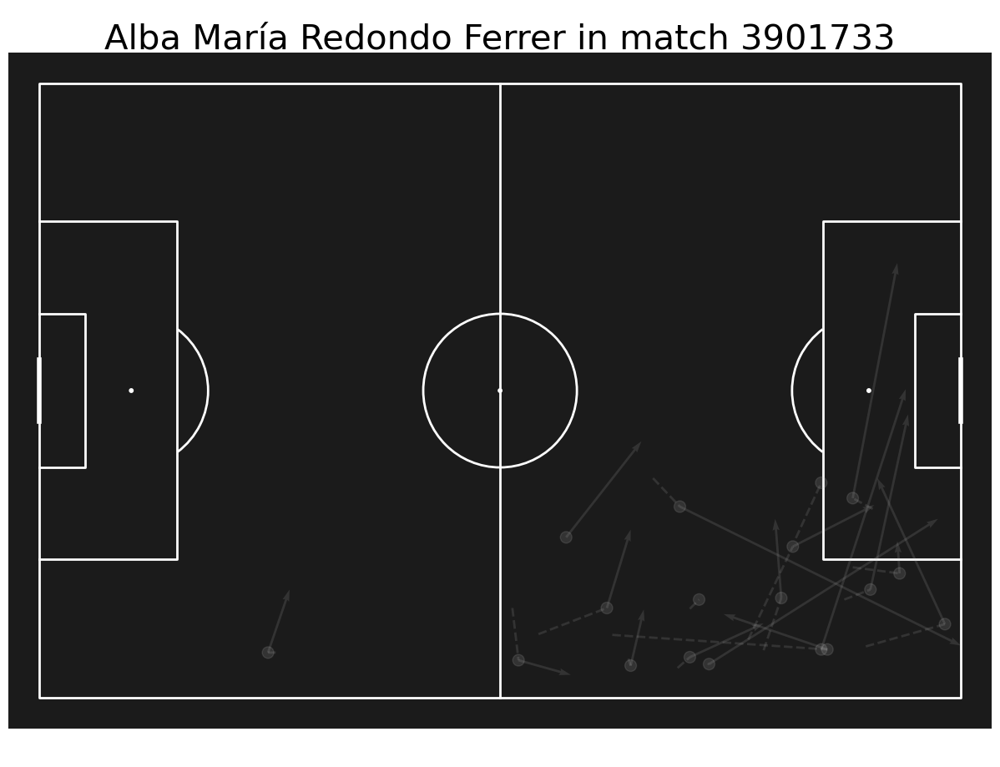

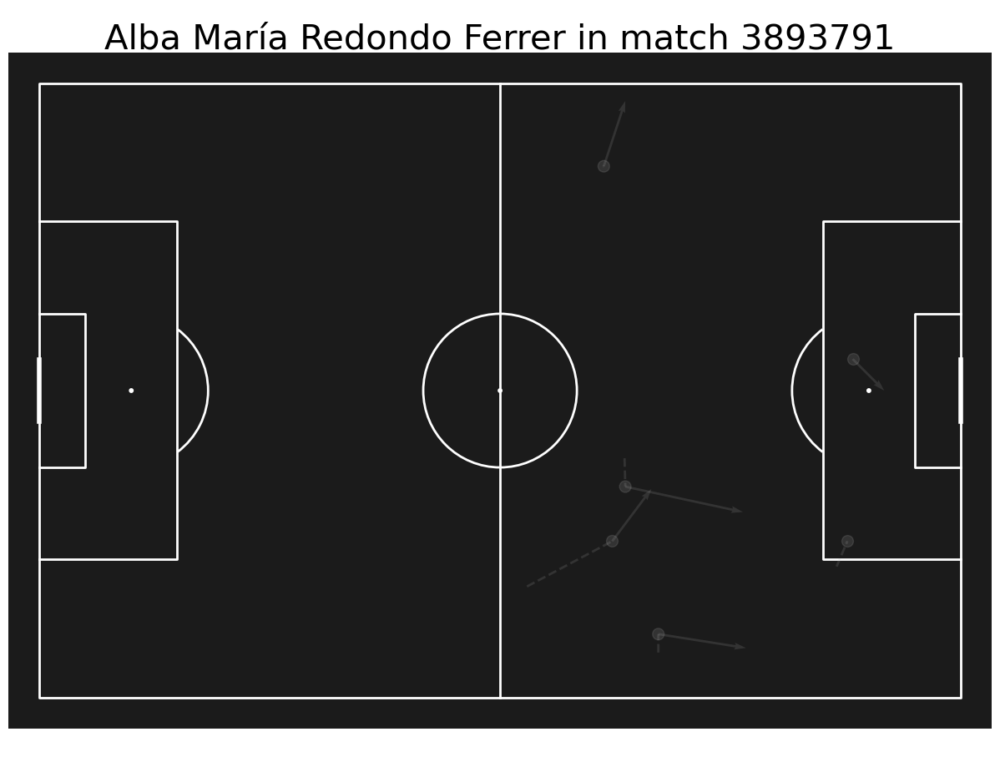

final_type
Carry           2.571429
Carry + Pass    6.857143
Pass            2.428571
dtype: float64
10.043373493975903


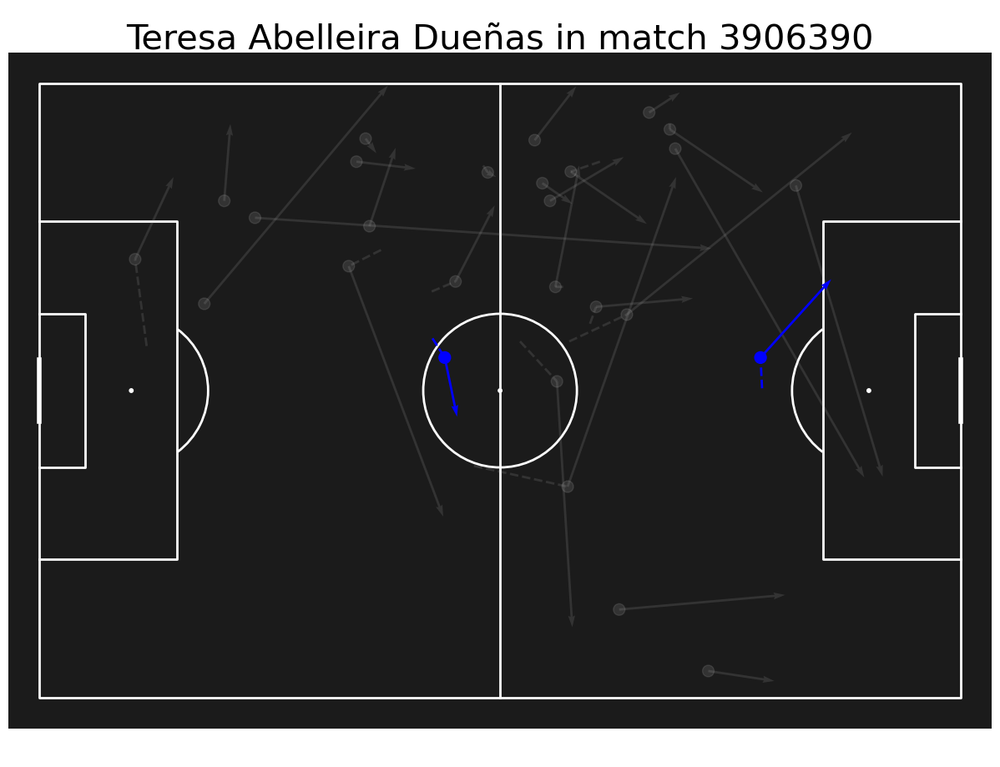

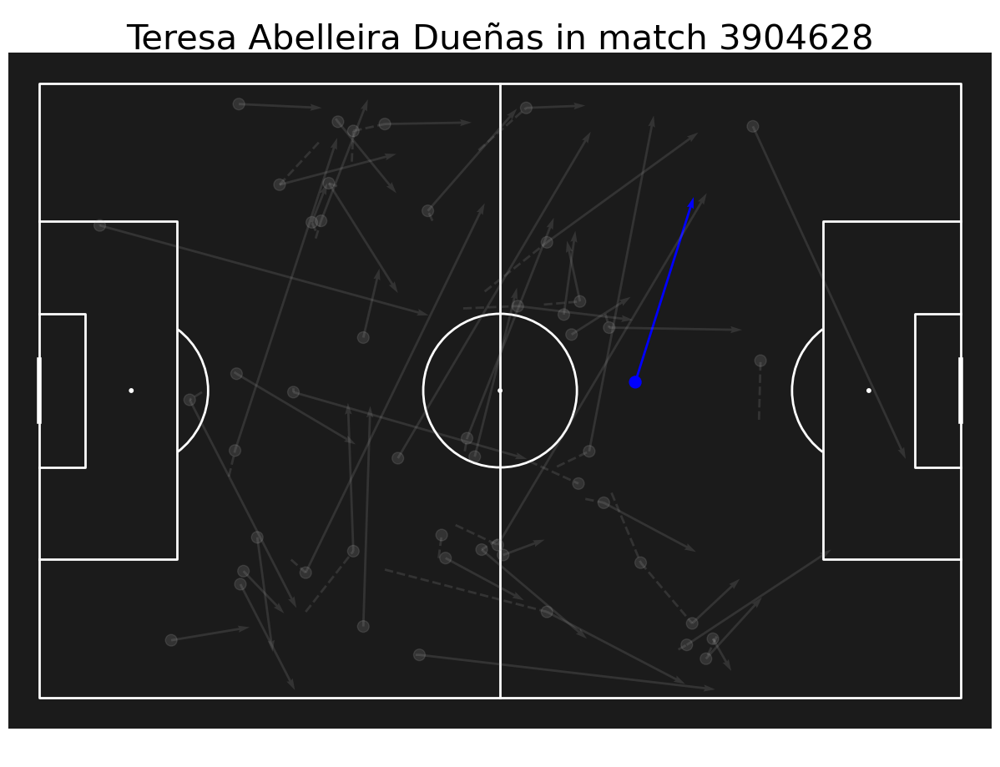

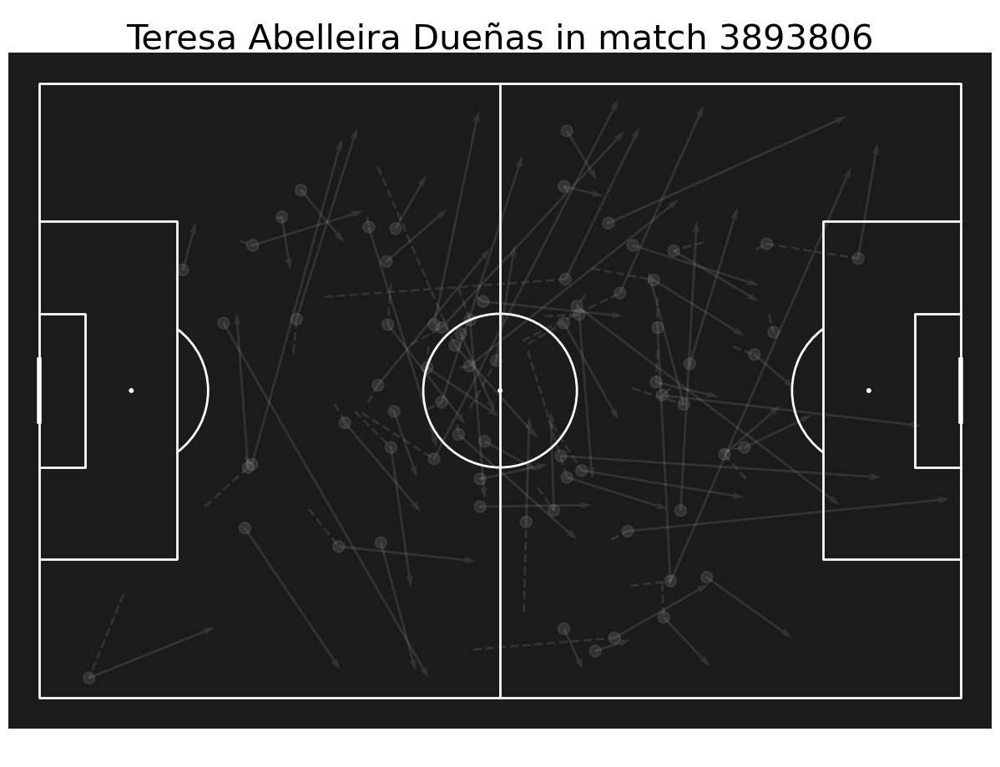

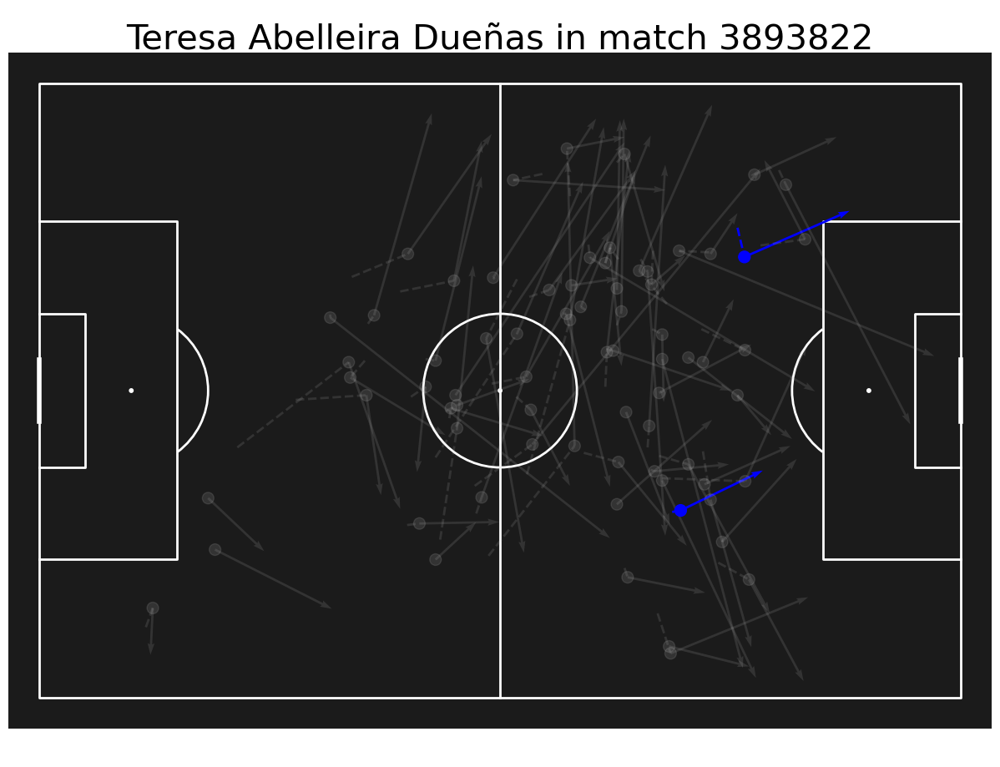

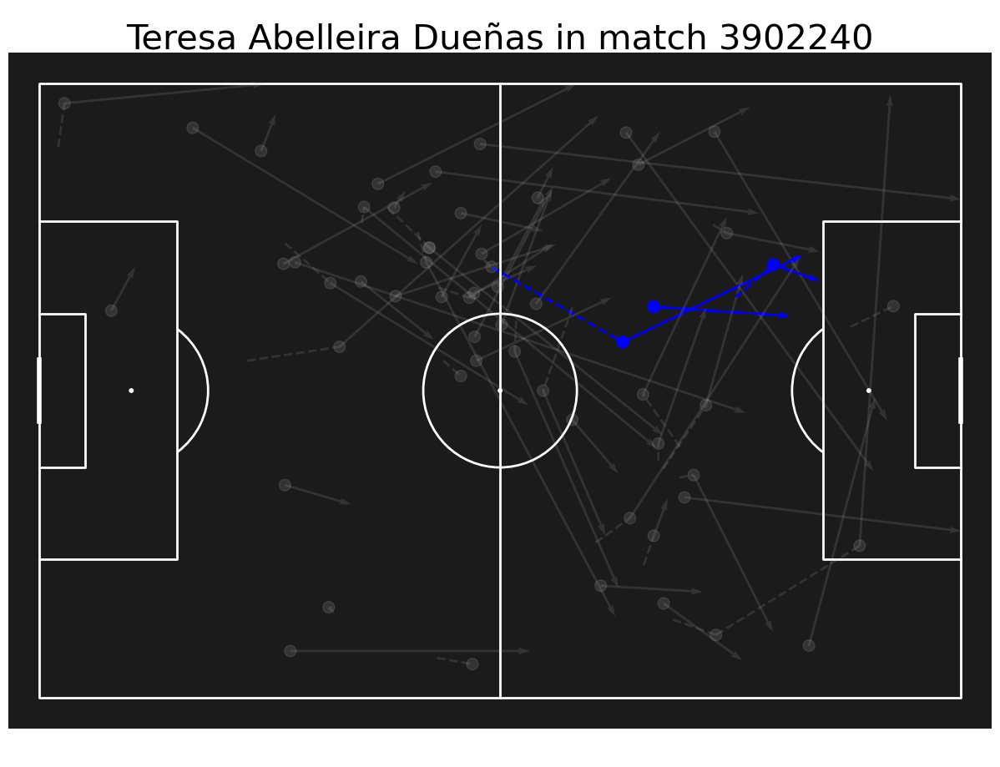

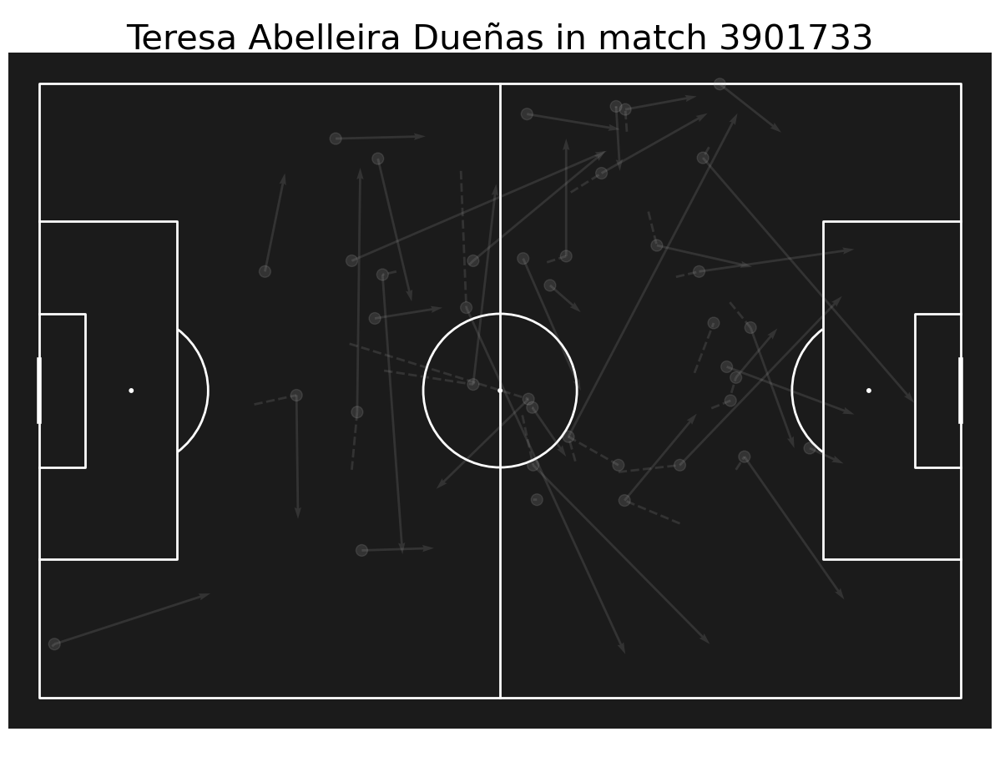

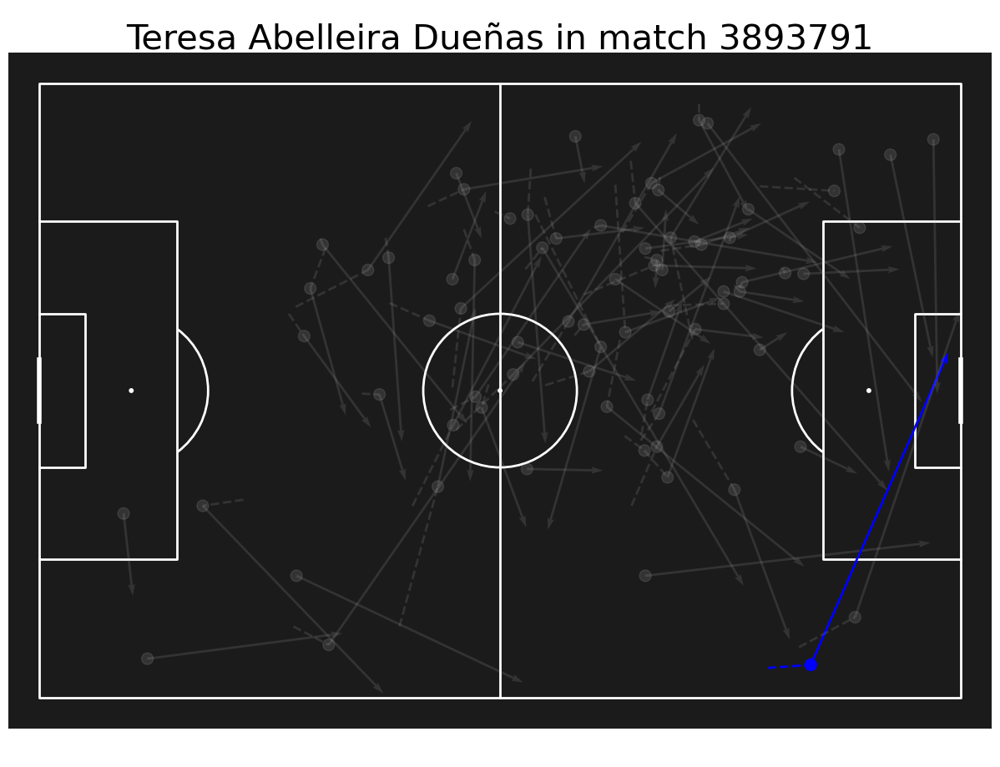

final_type
Carry            3.428571
Carry + Pass    35.857143
Pass            16.714286
dtype: float64
12.815561224489796


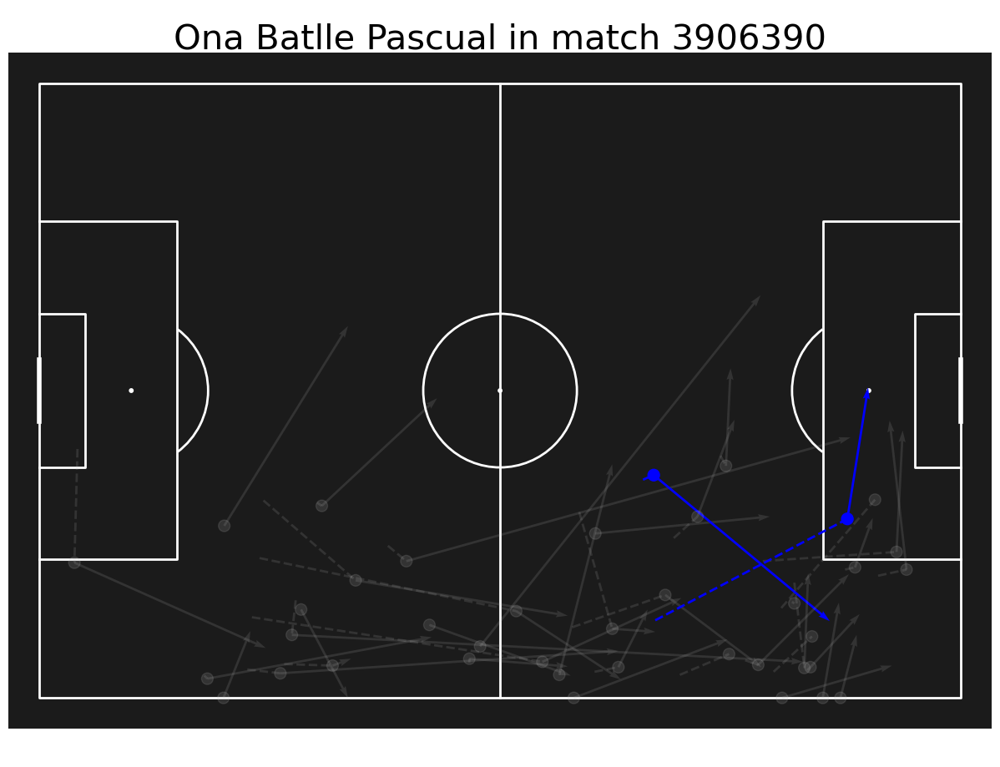

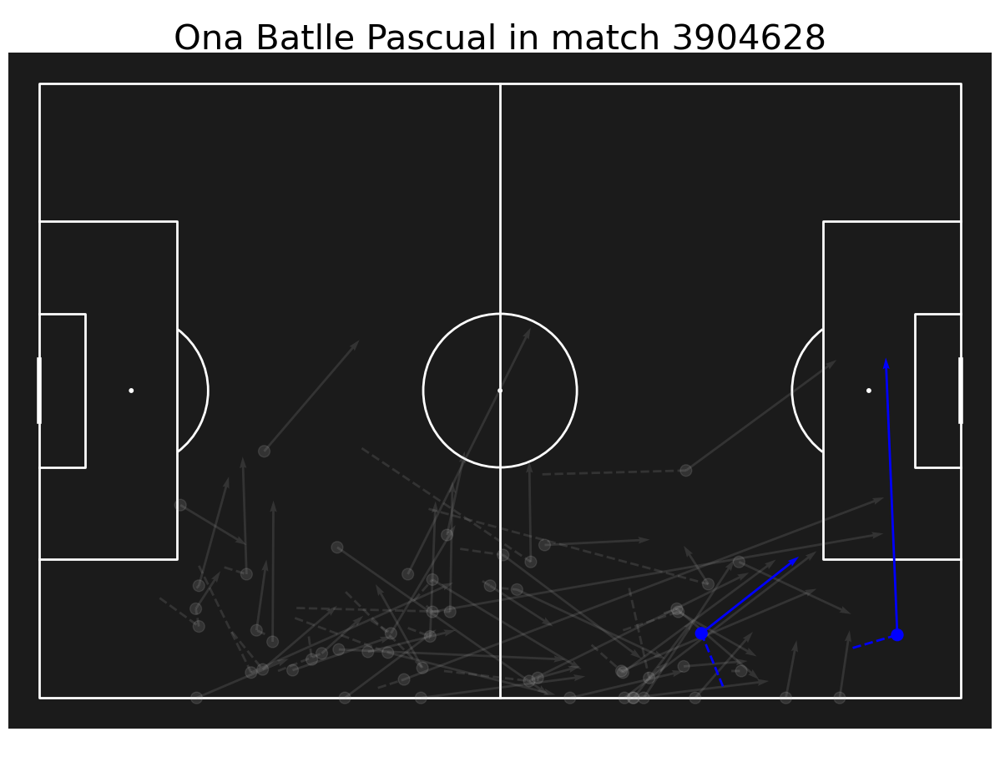

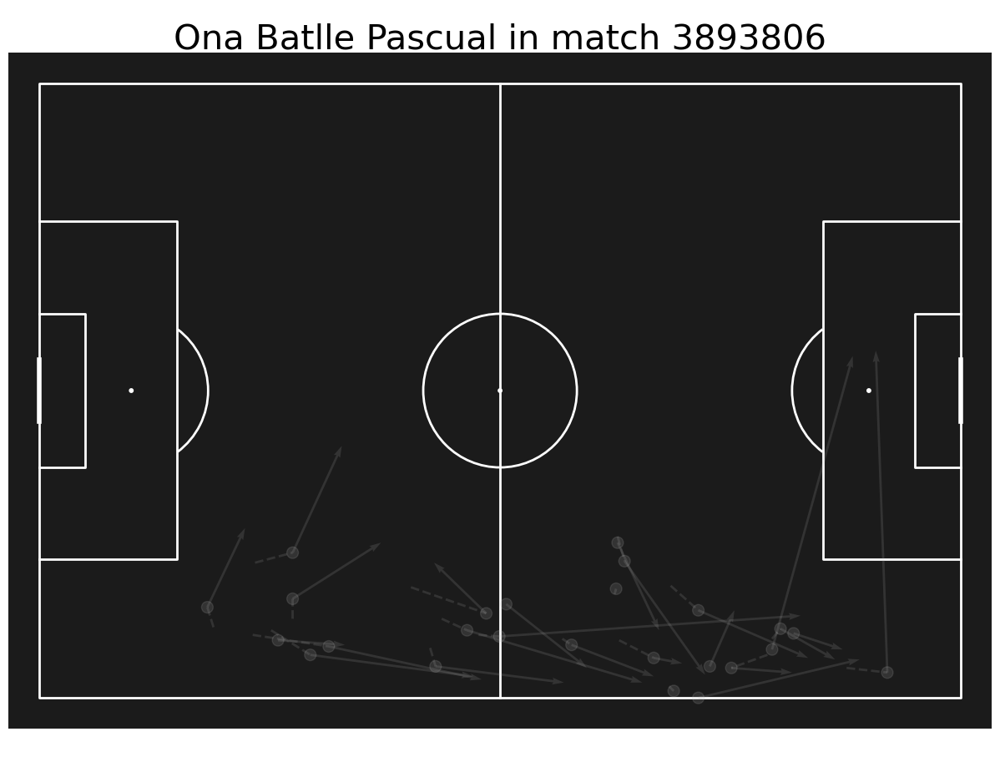

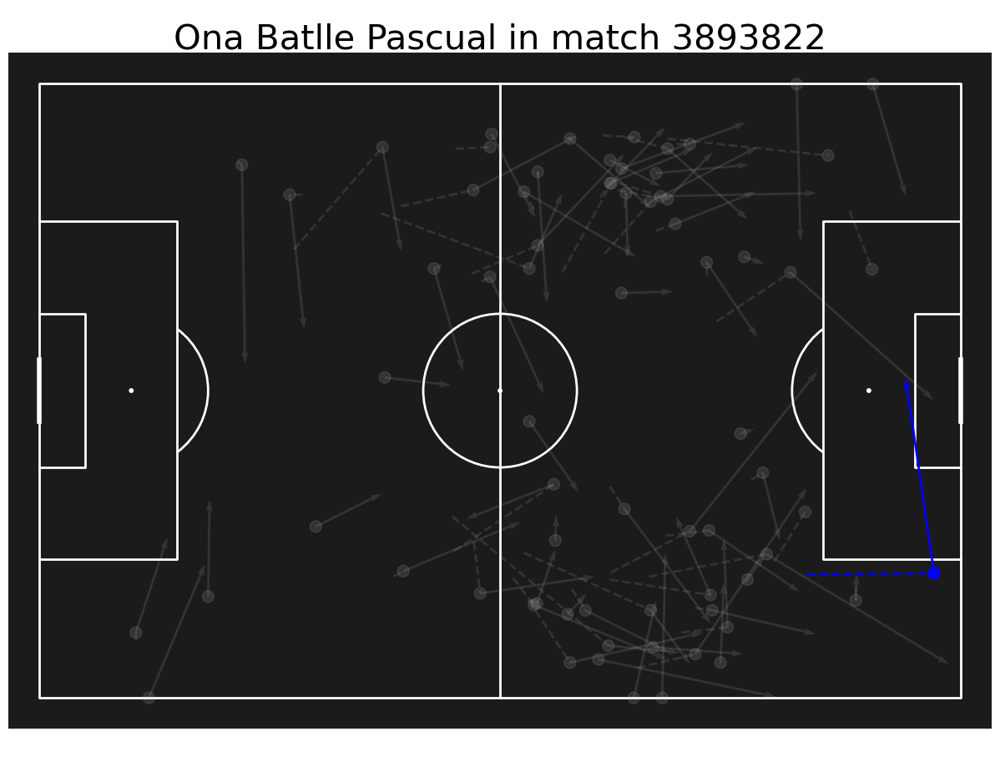

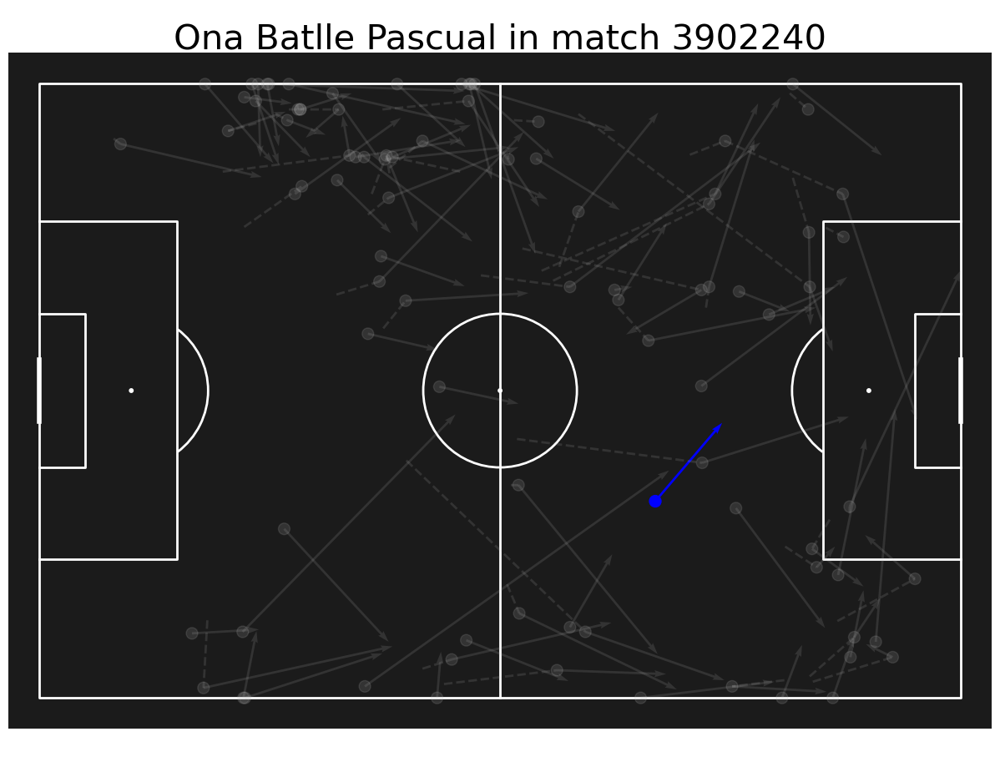

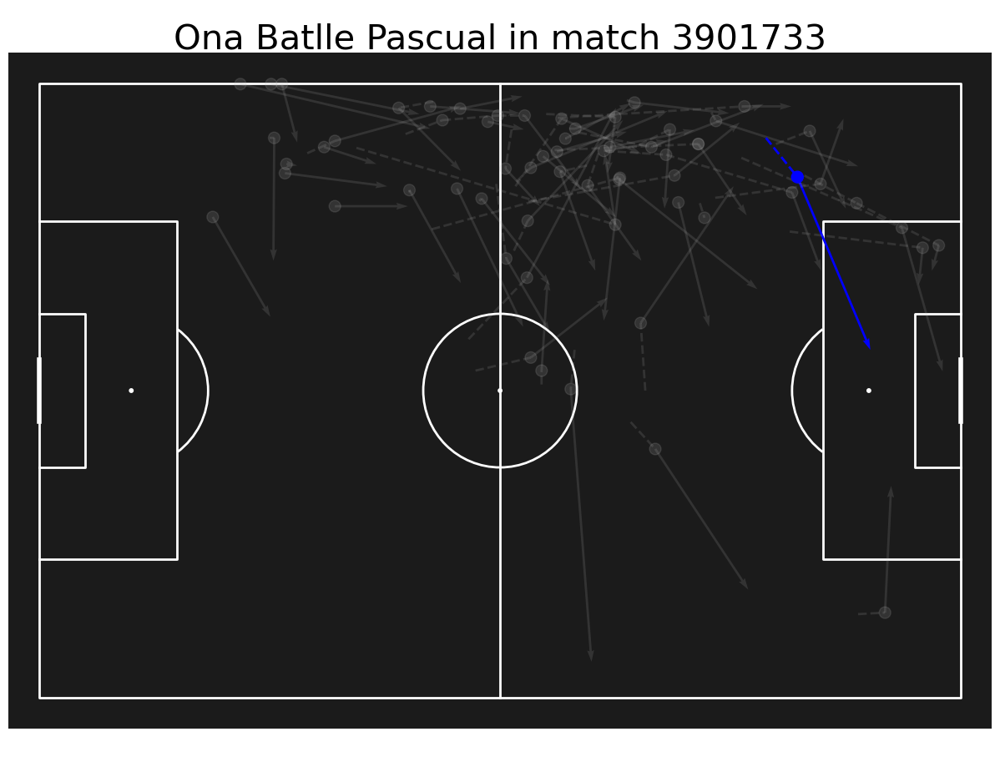

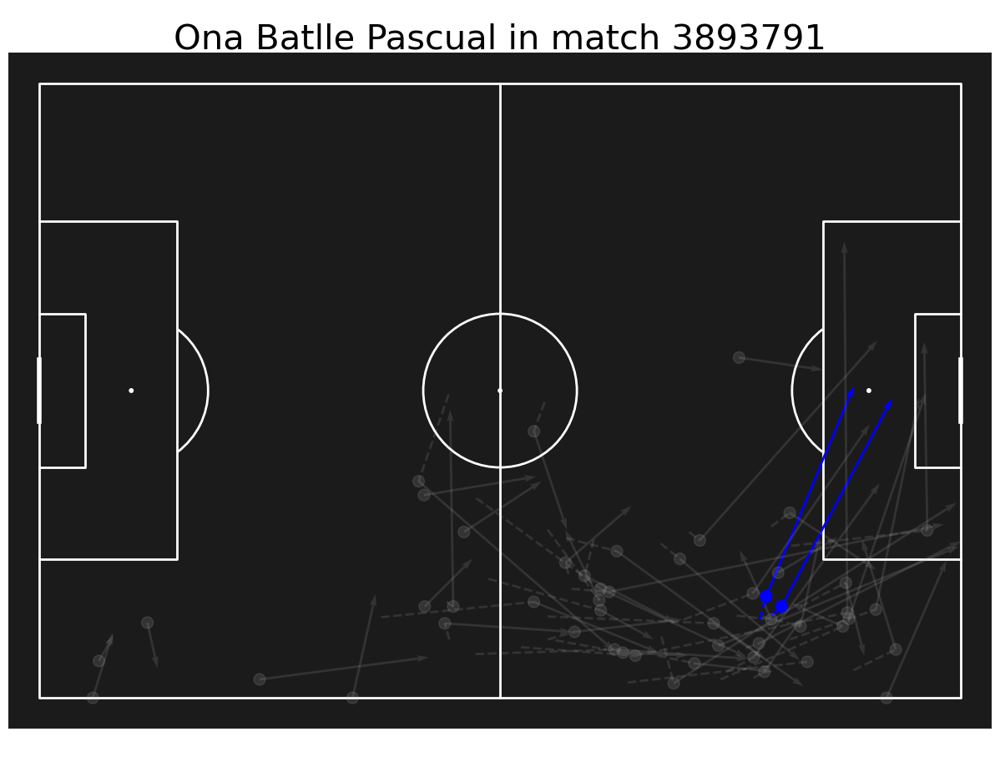

final_type
Carry            4.428571
Carry + Pass    34.714286
Pass            17.142857
dtype: float64
13.486802030456856


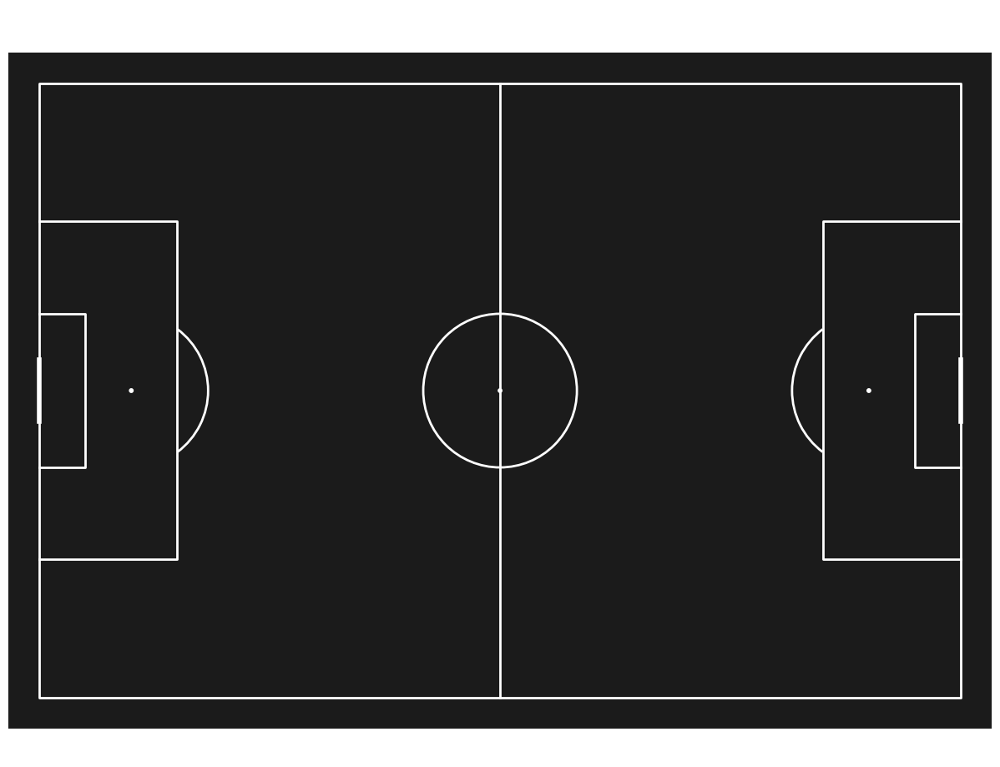

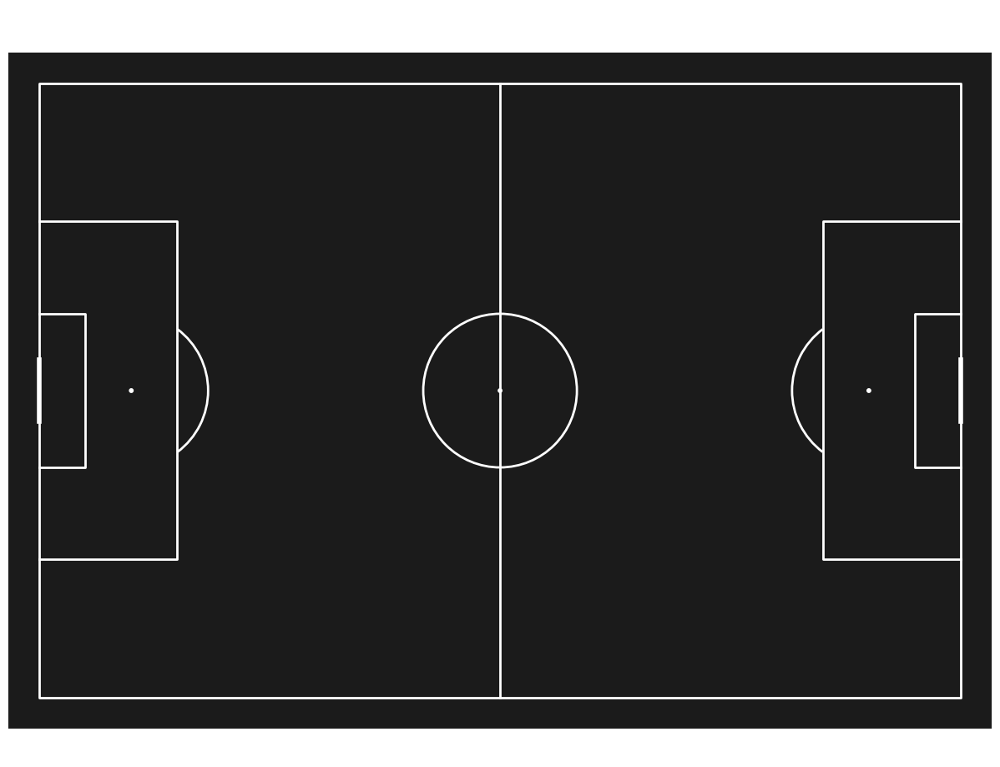

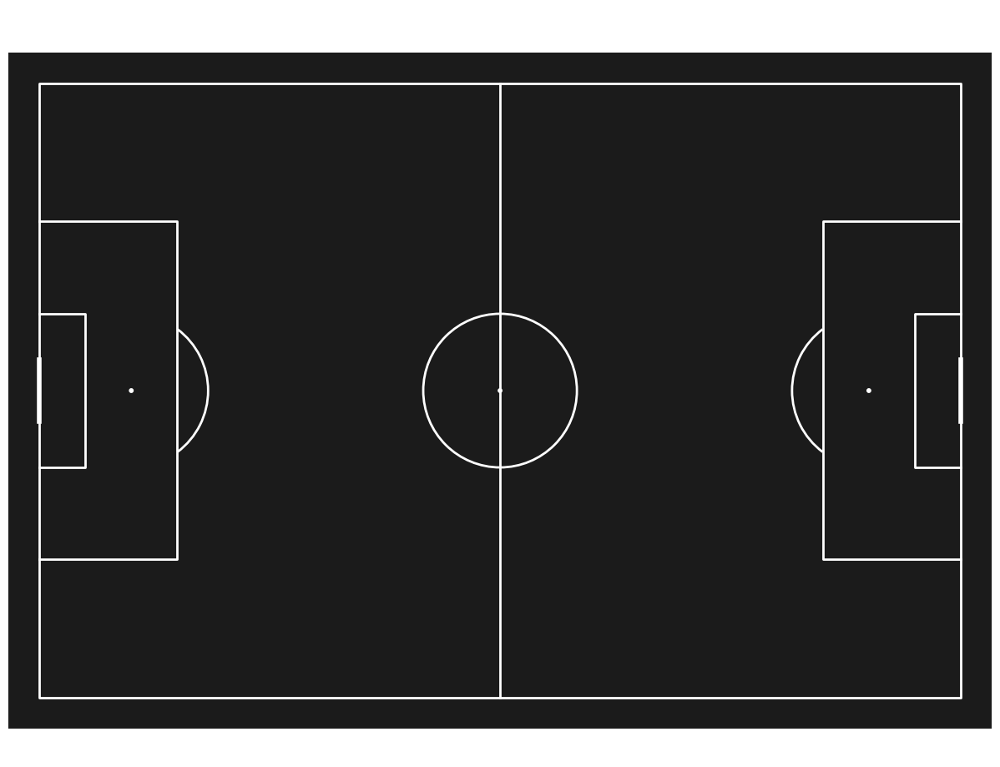

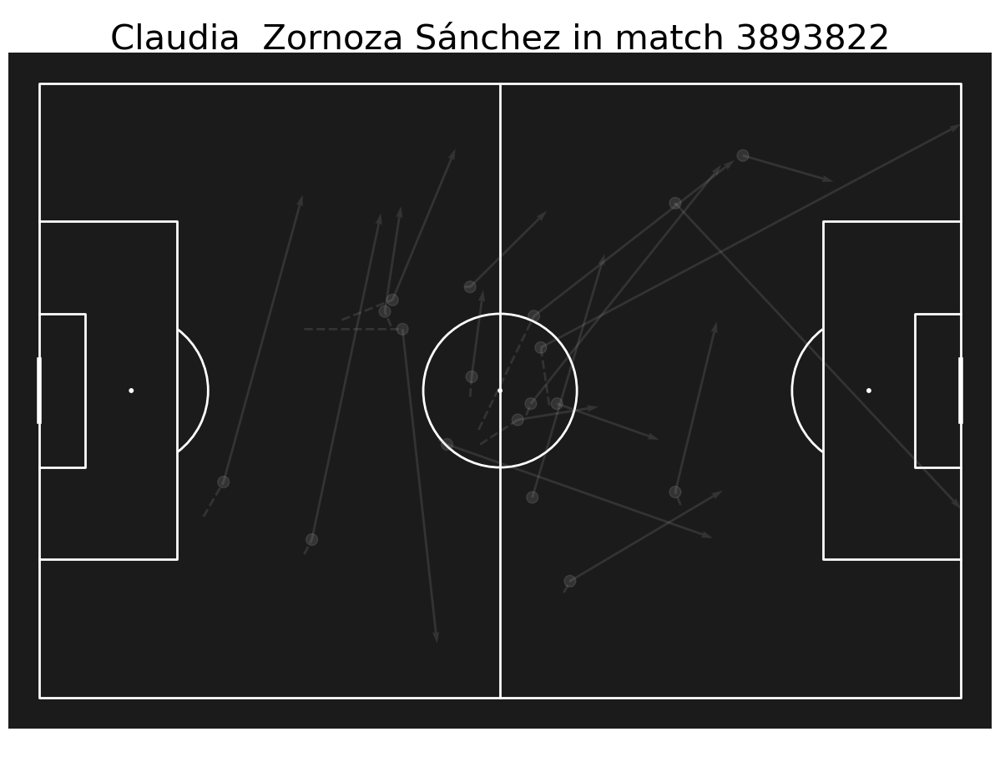

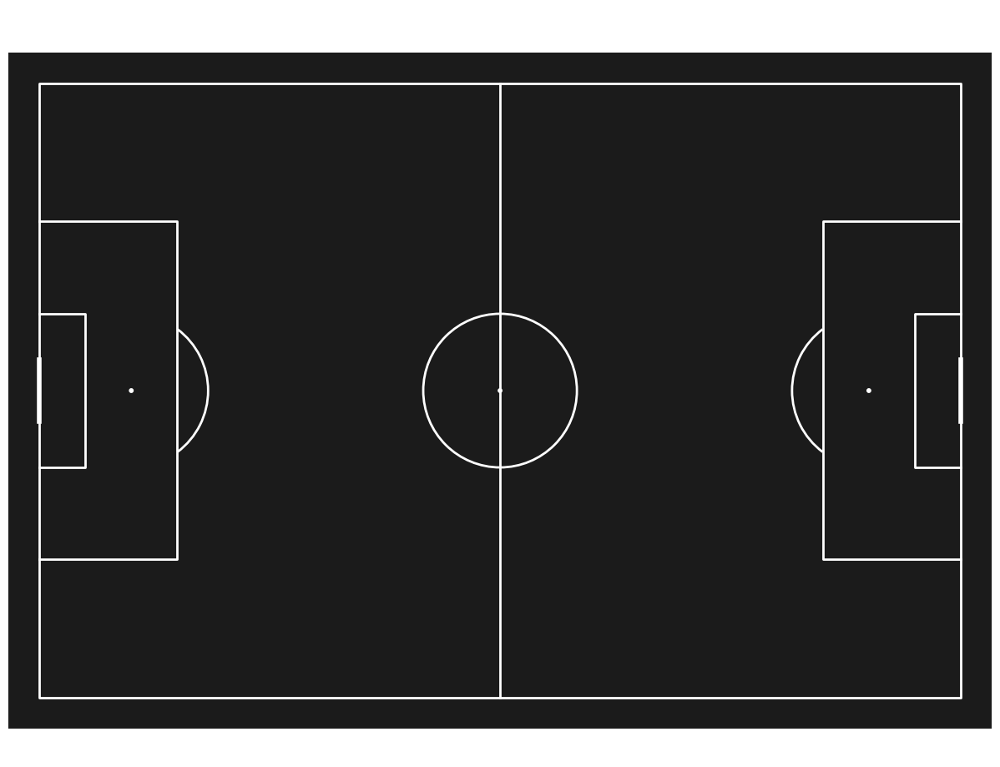

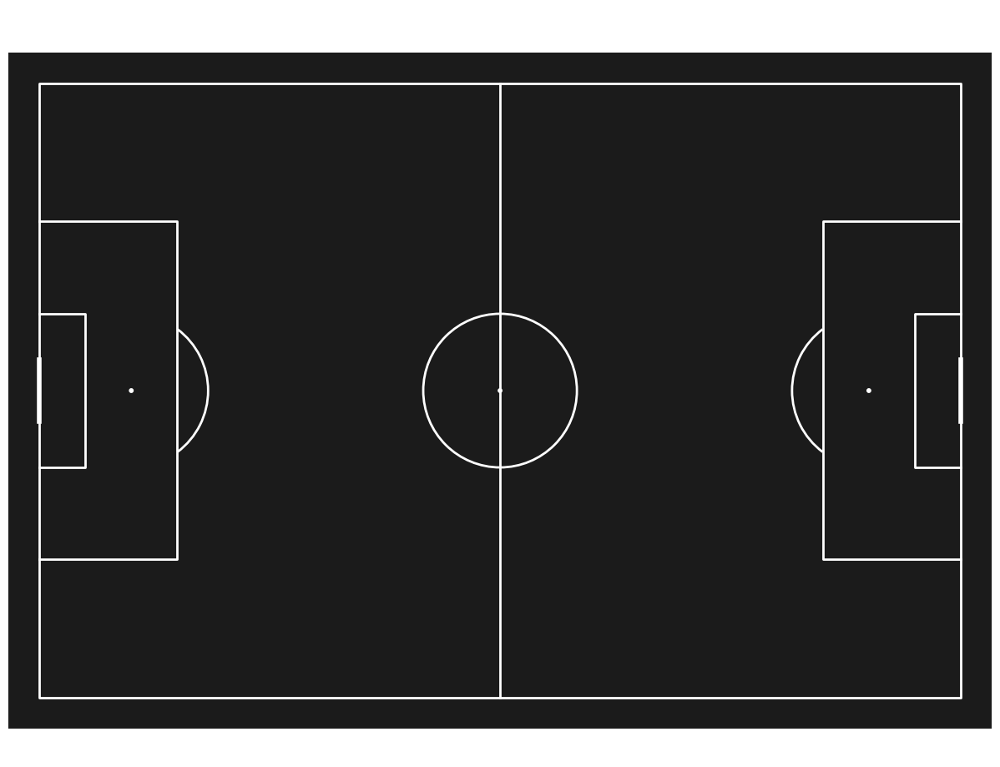

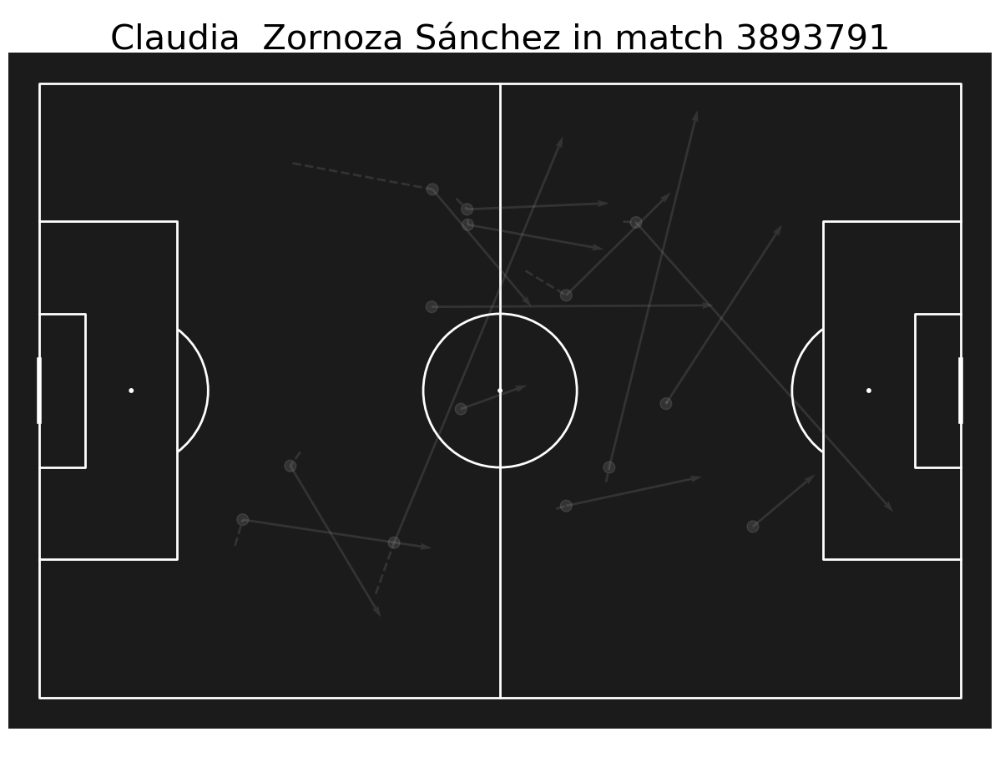

final_type
Carry + Pass    13.0
Pass             3.0
dtype: float64
19.115625


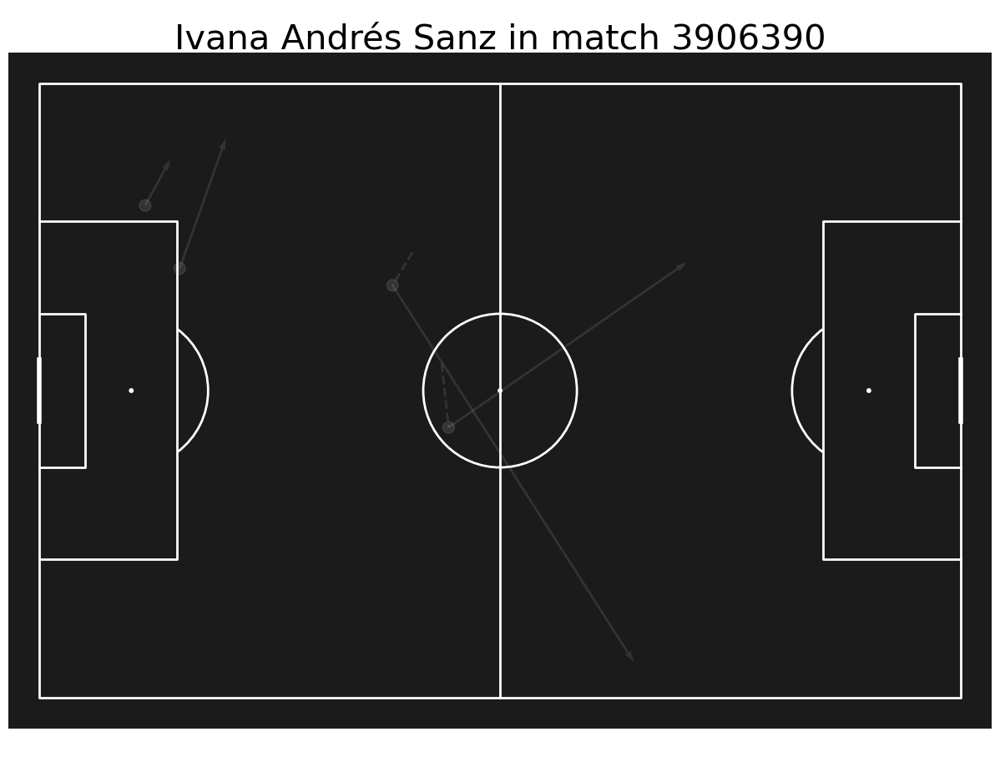

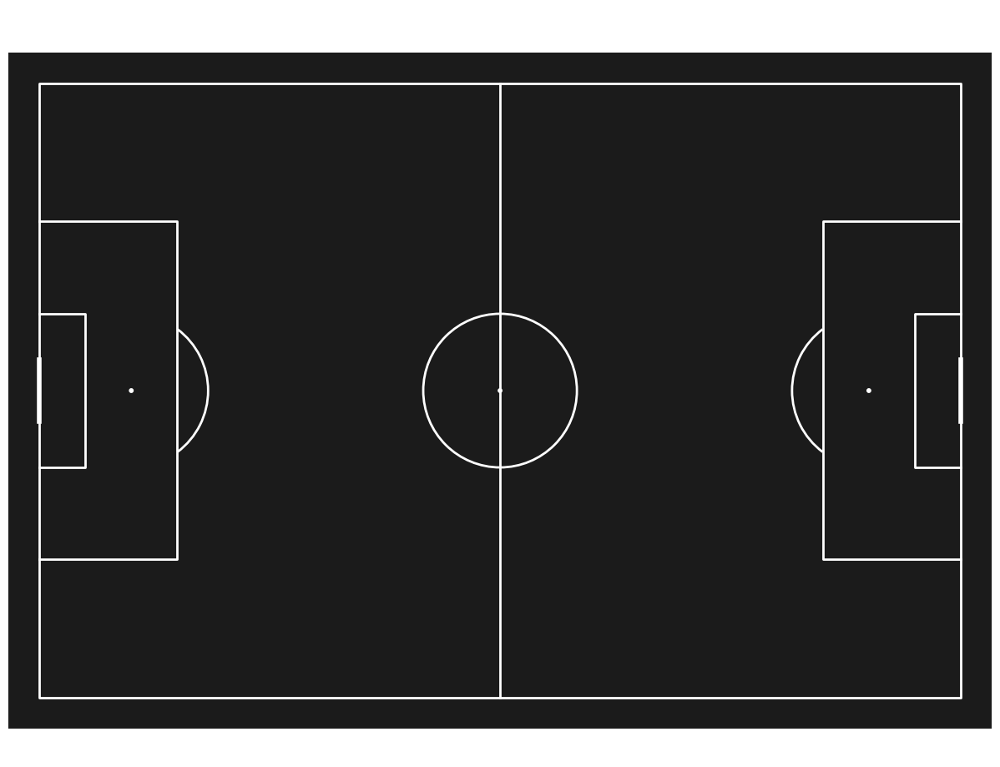

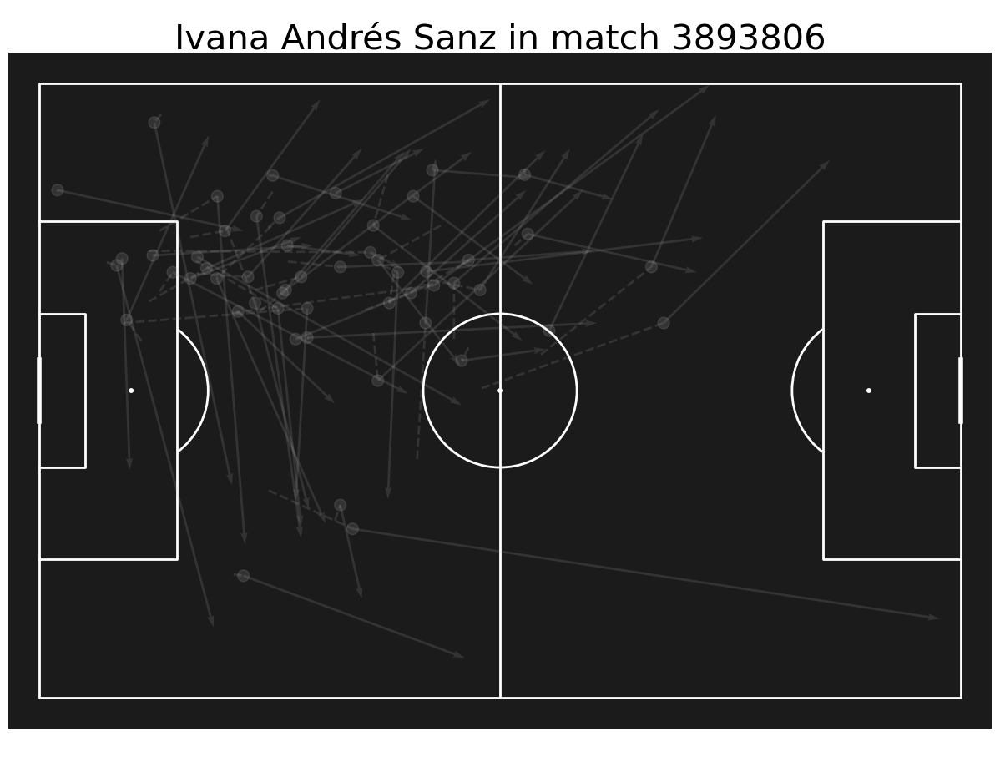

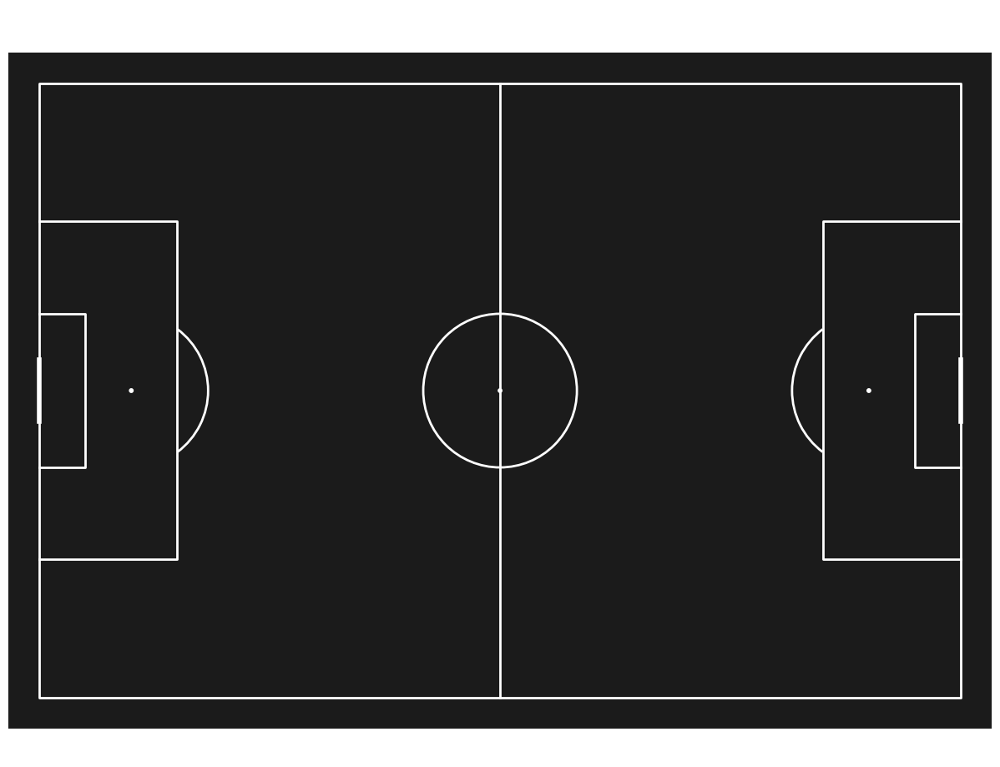

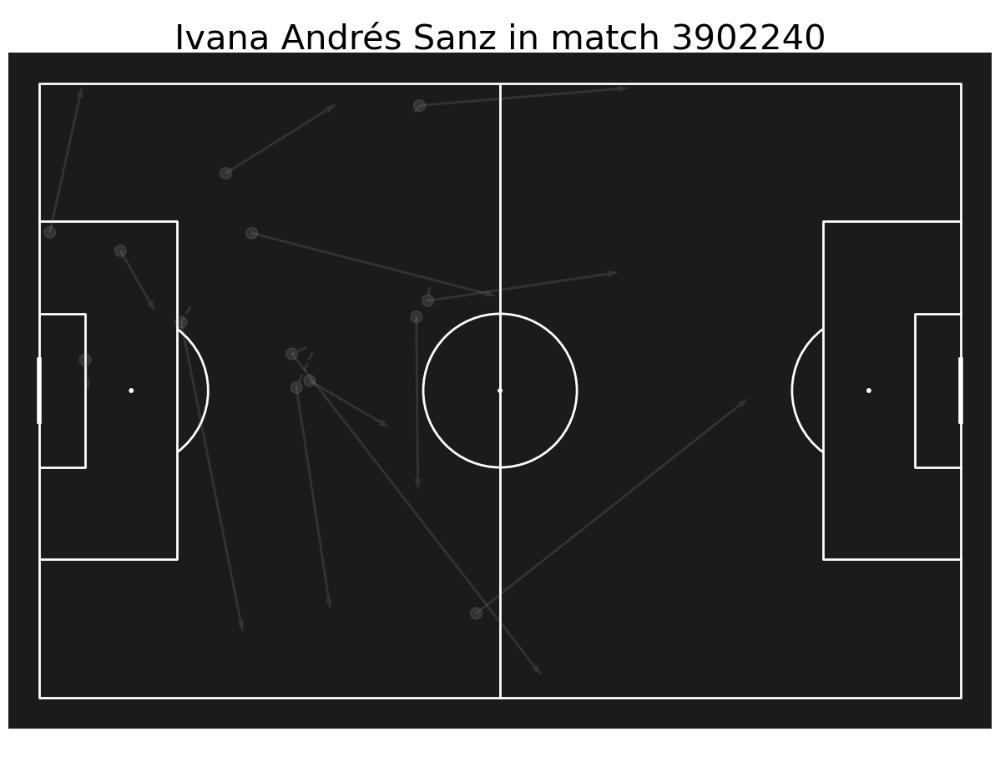

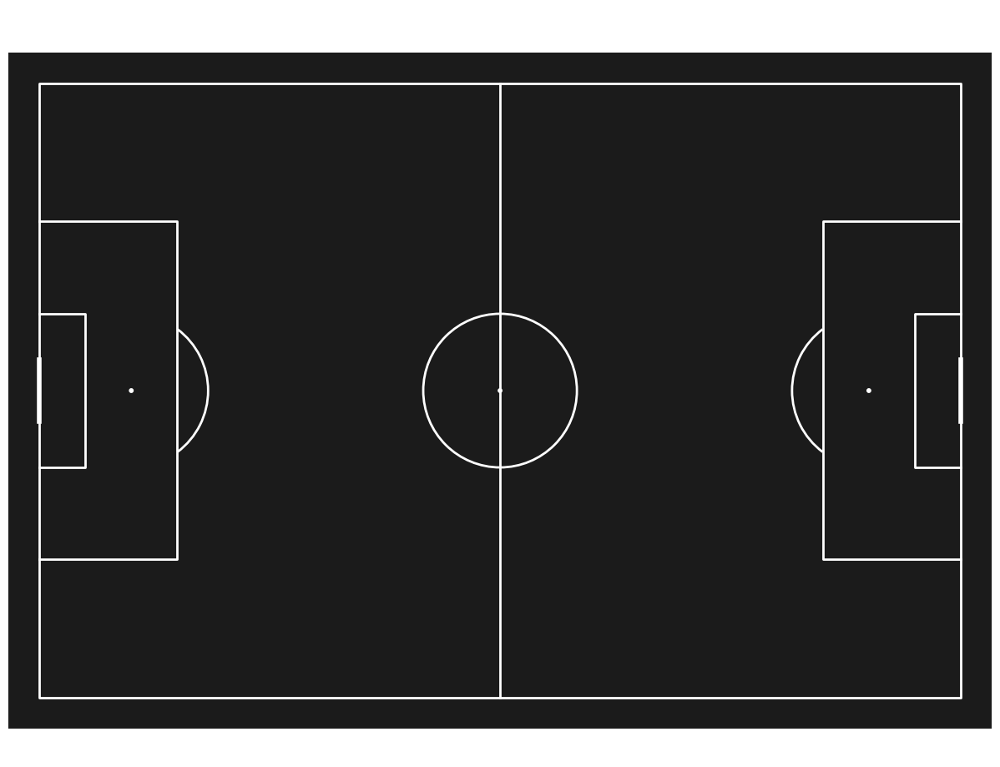

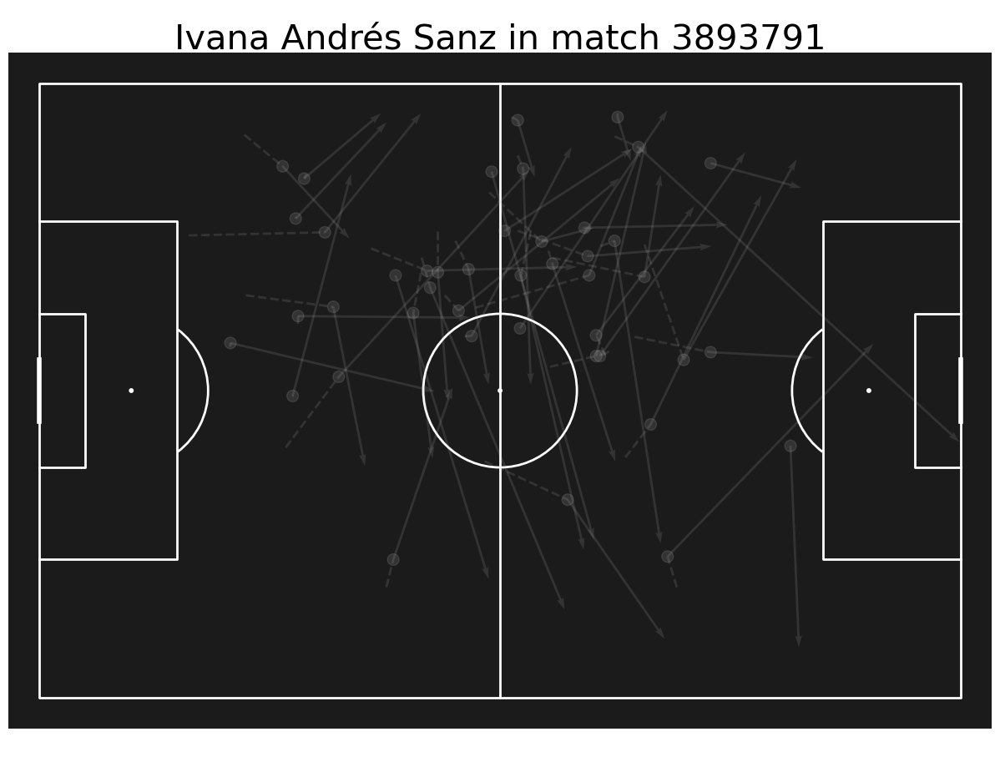

final_type
Carry + Pass    22.25
Pass             6.00
dtype: float64
17.732743362831858


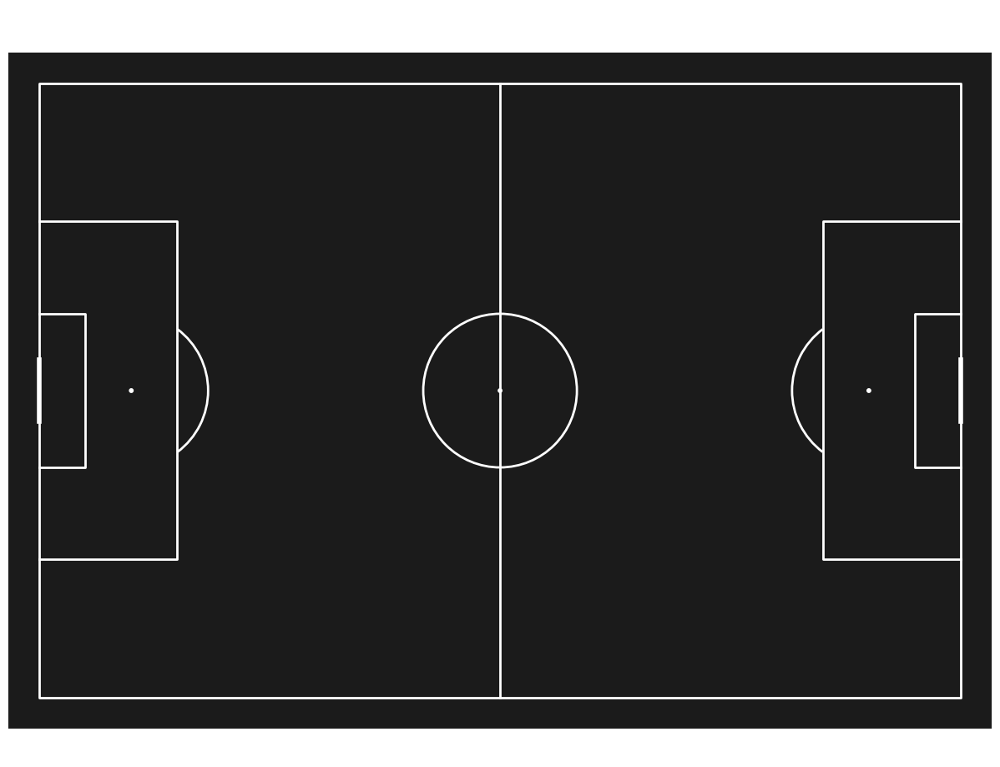

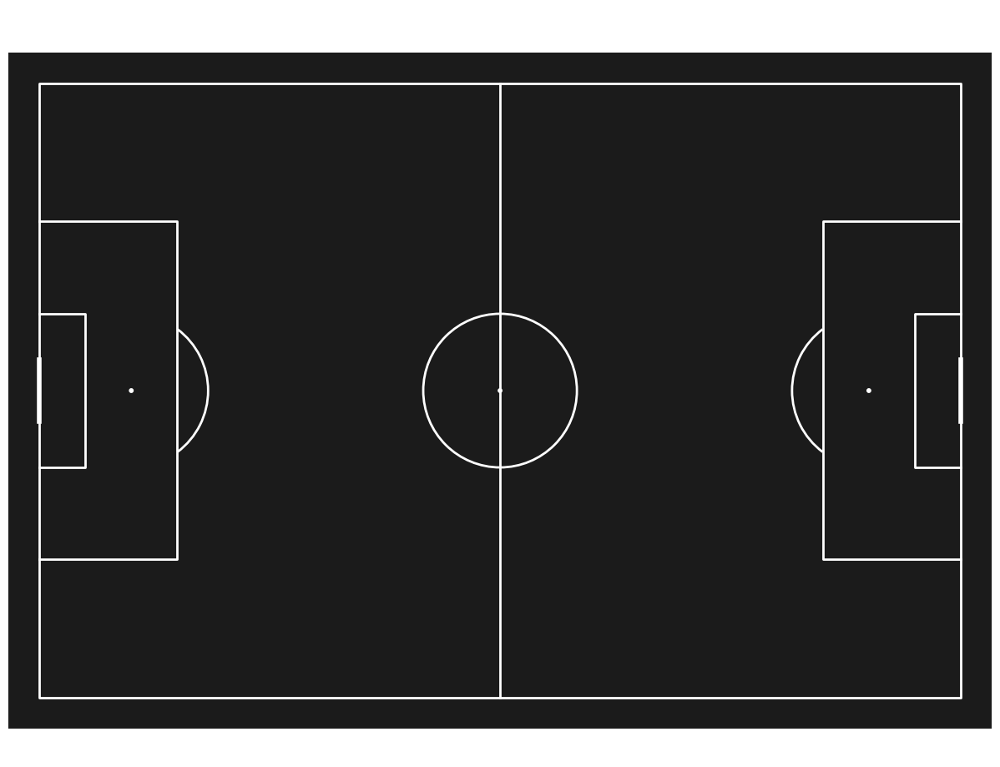

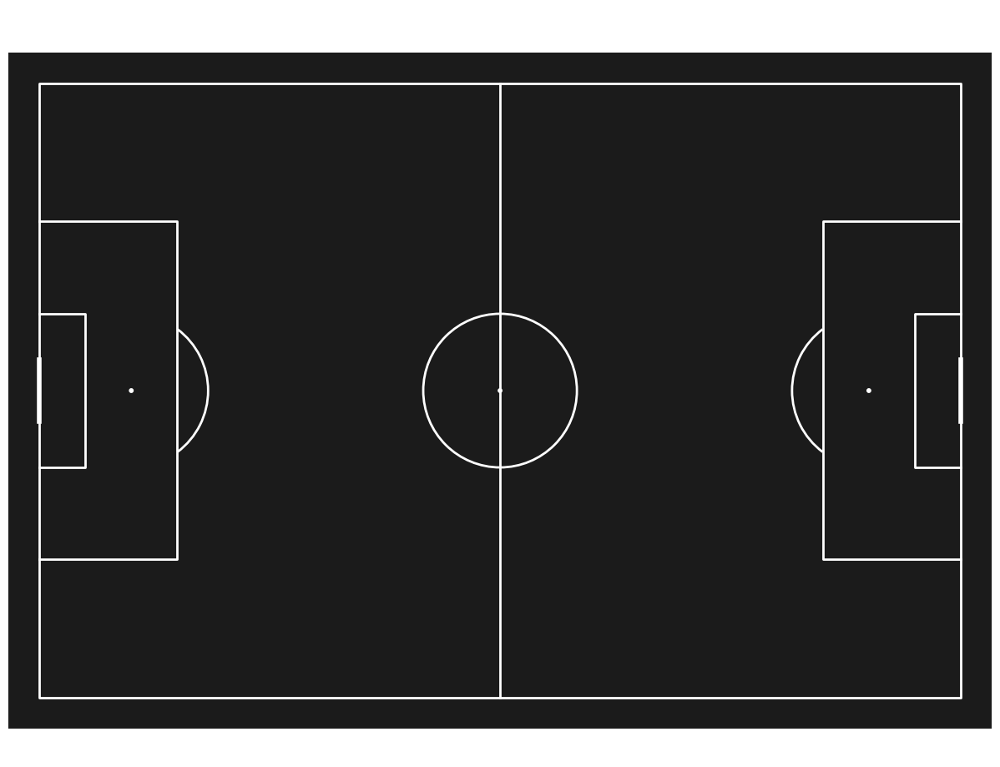

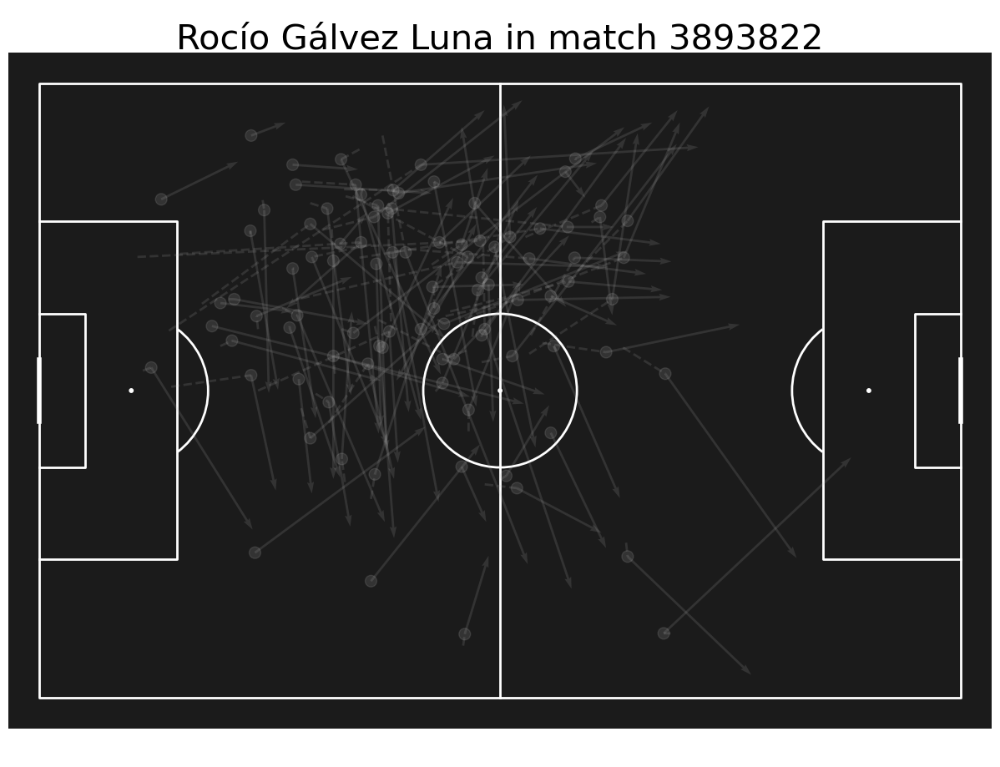

final_type
Carry + Pass    82.0
Pass            13.0
dtype: float64
14.409473684210525


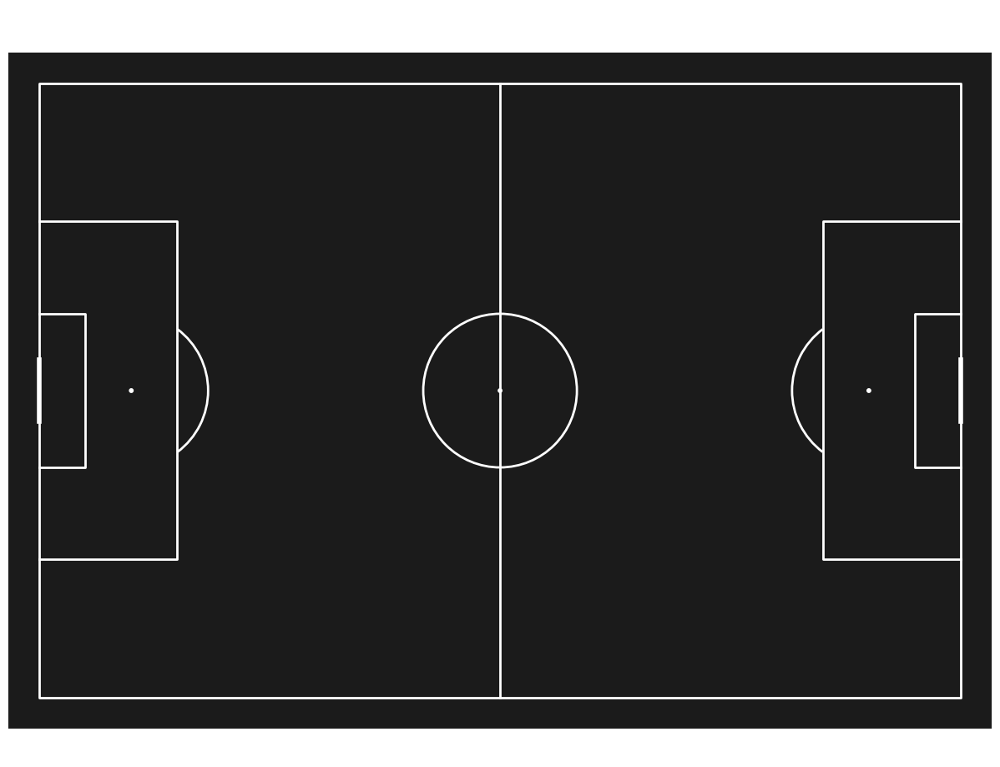

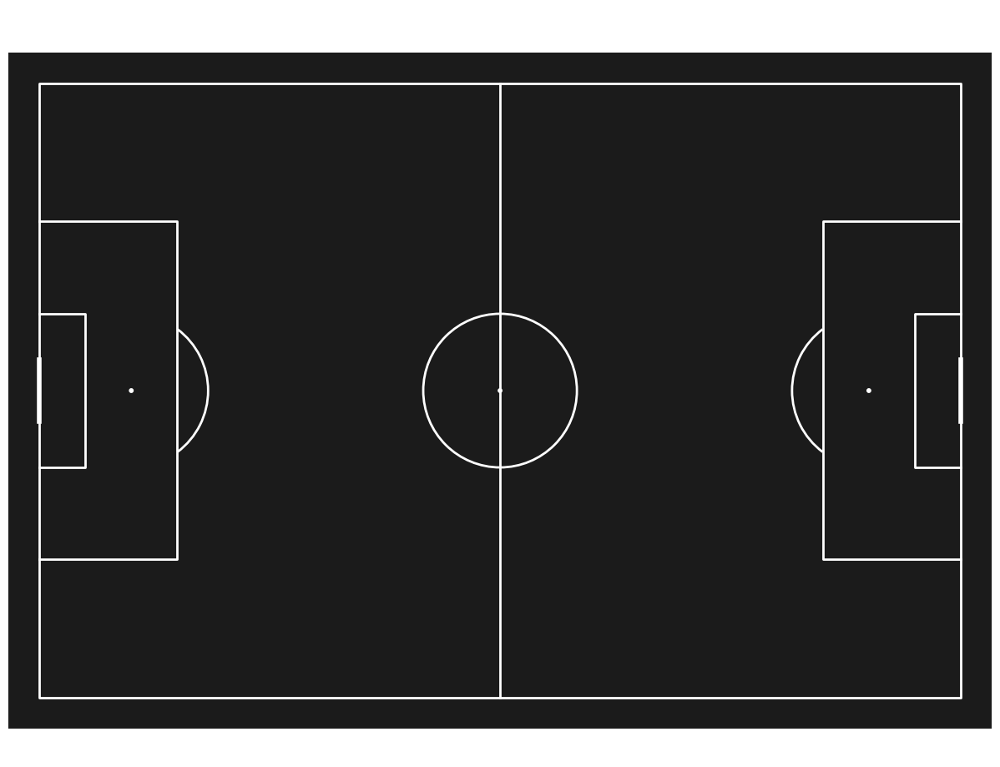

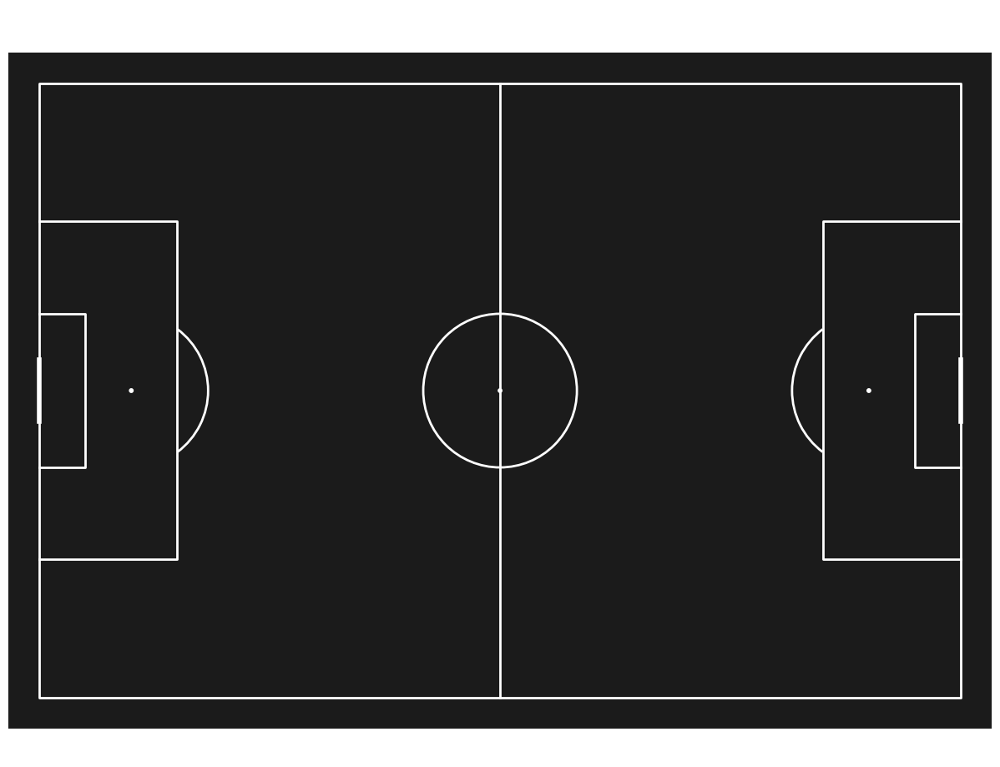

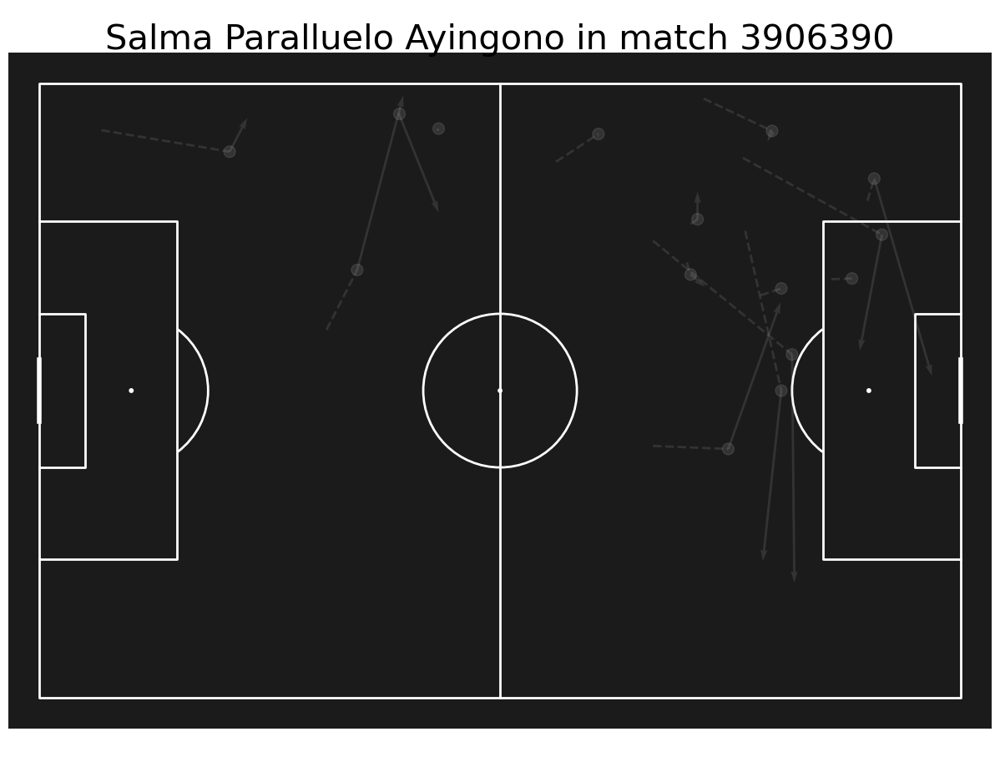

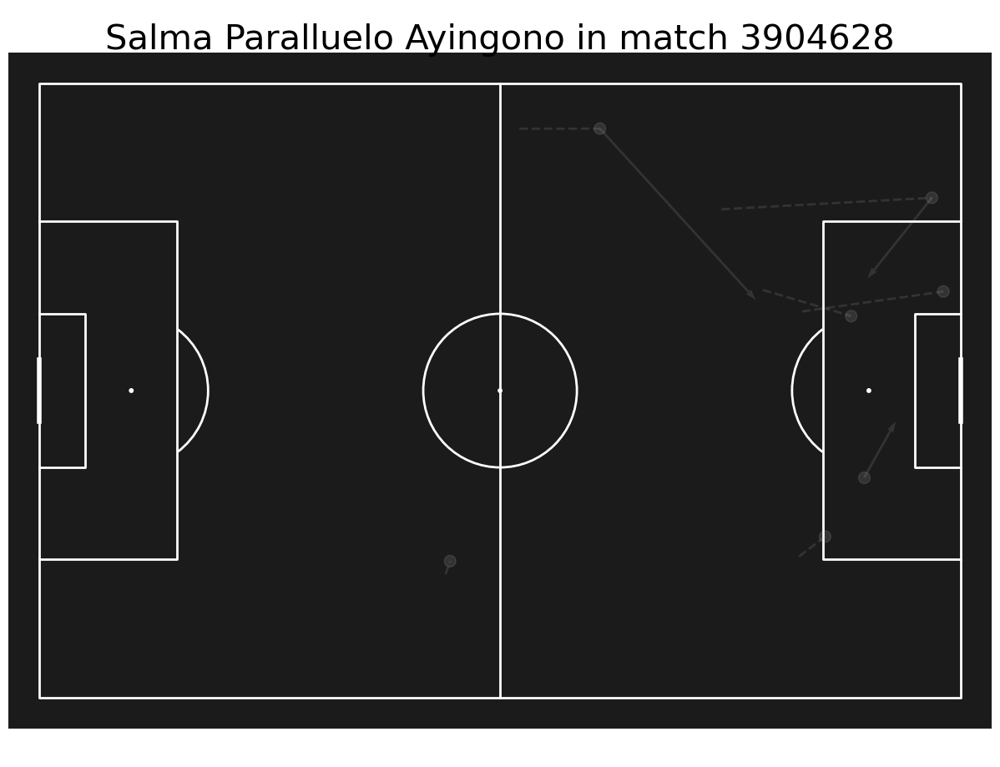

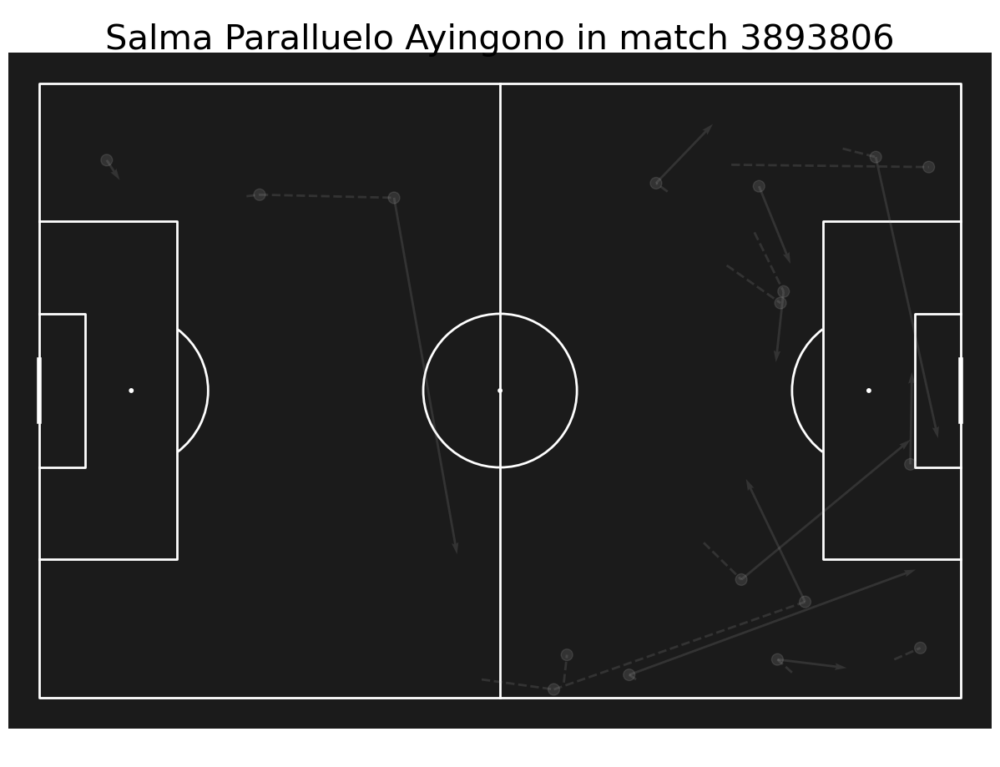

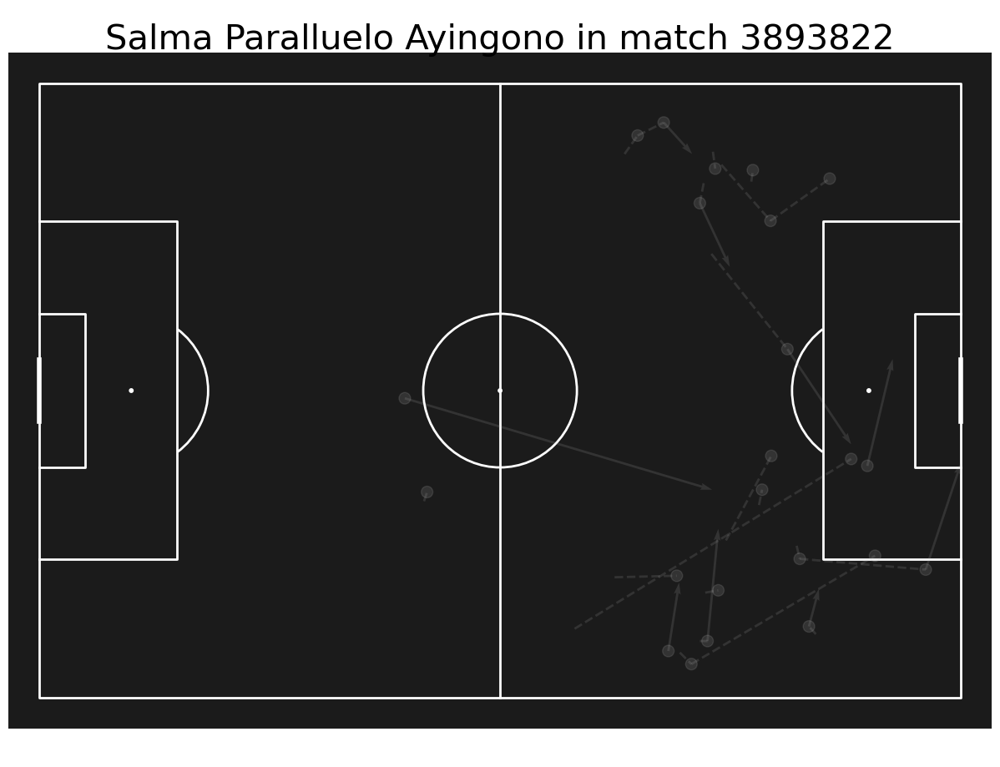

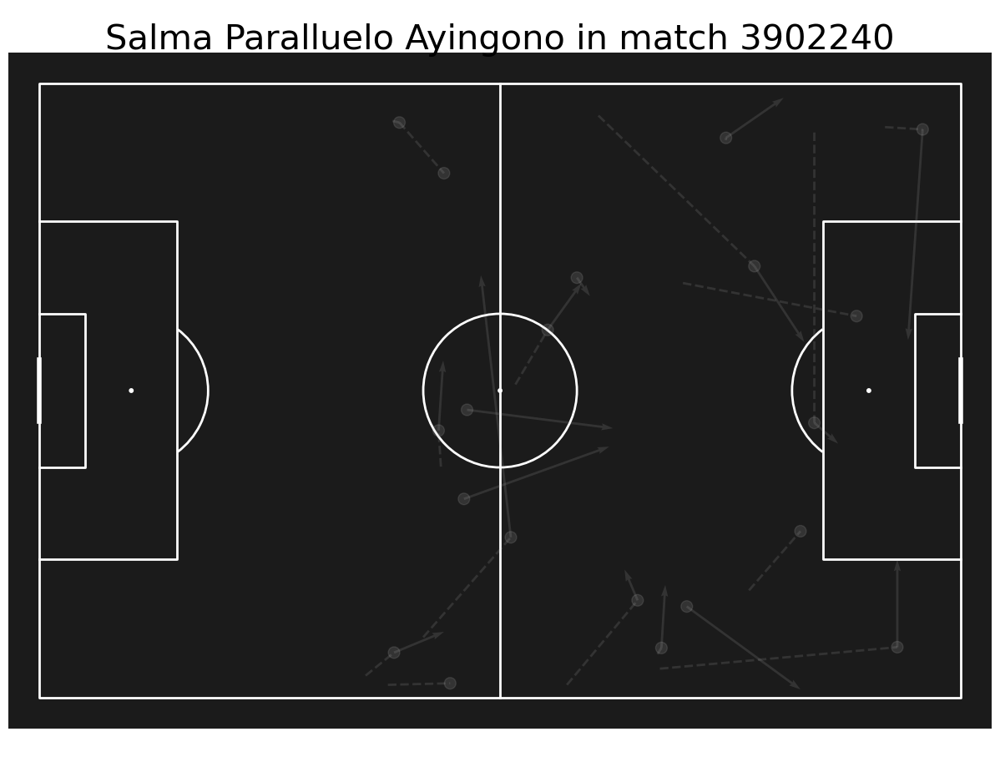

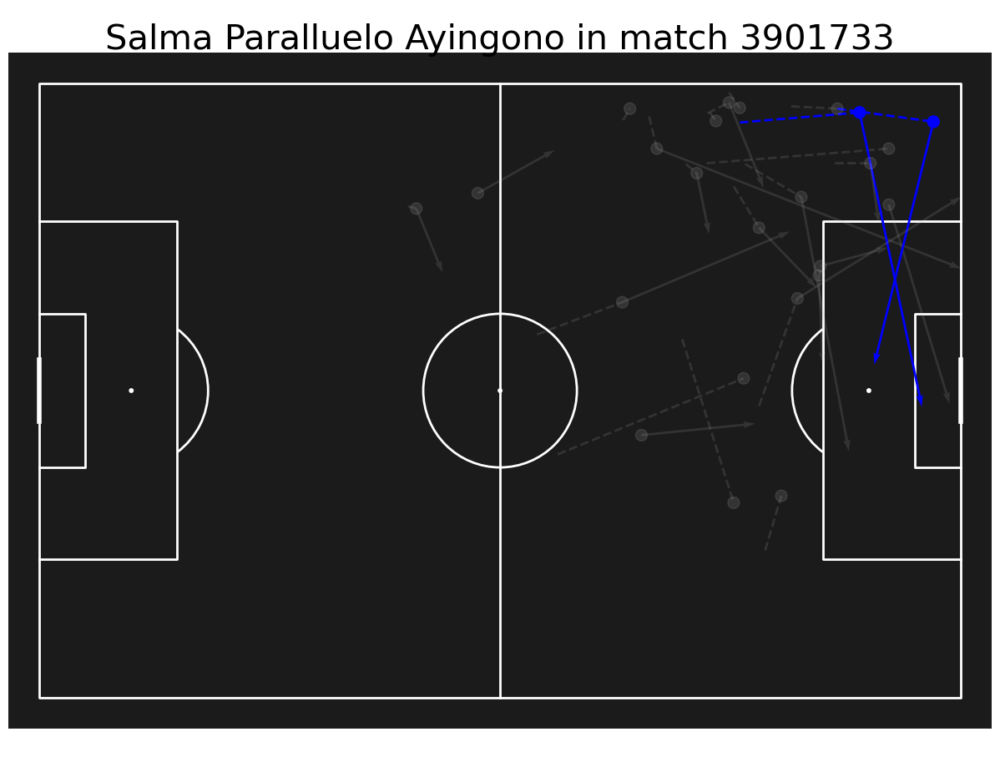

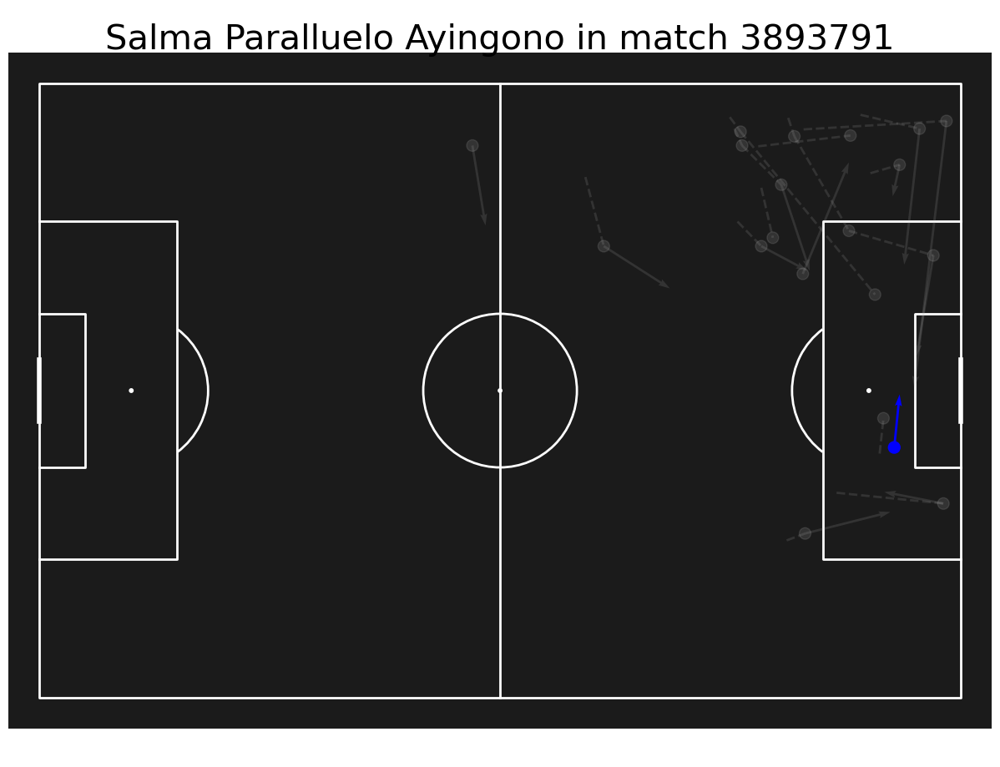

final_type
Carry           7.000000
Carry + Pass    8.571429
Pass            2.428571
dtype: float64
9.597619047619045


In [156]:
events_between_carry_and_pass = ['Dribble', 'Pressure']
# player_name = "Aitana Bonmati Conca" # "Alexia Putellas Segura"  # "María Francesca Caldentey Oliver"  # "Aitana Bonmati Conca"

line_width = 2
circle_size = 100
circle_alpha = 1
line_alpha = .4

gray_color = '#c0c0c0'
black_color = '#1B1B1B'  # '#040200', '#1B1B1B'

player_names = []
forward_meters = []
forward_meters_median = []
n_passes_list = []

for player_name in spain_midfielder_players:
    player_df = pd.DataFrame()
    for match_id in team_matches_id:
        match_events = wwc2023_events[wwc2023_events['match_id'] == match_id].sort_values('index')
    
        # Passes
        pass_not_preceded_by_carry_mask = (
            match_events['type'].eq('Pass') &
            ~(match_events['type'].shift(1).eq('Carry') |
                (match_events['type'].shift(1).isin(events_between_carry_and_pass) &
                 match_events['type'].shift(2).eq('Carry')
                )
            )
        )
        
        pass_not_preceded_by_carry_df = match_events[pass_not_preceded_by_carry_mask][cols]
        forward_pass_not_preceded_by_carry_df = pass_not_preceded_by_carry_df[pass_not_preceded_by_carry_df['location'].apply(lambda x: x[0]) < pass_not_preceded_by_carry_df['pass_end_location'].apply(lambda x: x[0])]
        aitana_forward_pass_not_preceded_by_carry_df = forward_pass_not_preceded_by_carry_df[forward_pass_not_preceded_by_carry_df['player'] == player_name]
    
        only_pass_start_x = [location[0] for location in aitana_forward_pass_not_preceded_by_carry_df['location']]
        only_pass_start_y = [location[1] for location in aitana_forward_pass_not_preceded_by_carry_df['location']]
        only_pass_end_x = [location[0] for location in aitana_forward_pass_not_preceded_by_carry_df['pass_end_location']]
        only_pass_end_y = [location[1] for location in aitana_forward_pass_not_preceded_by_carry_df['pass_end_location']]
    
        if len(aitana_forward_pass_not_preceded_by_carry_df) > 0:
            only_pass_colors_and_alphas = aitana_forward_pass_not_preceded_by_carry_df.apply(determine_color_and_alpha_and_zorder, axis=1)
            only_pass_colors, only_pass_alphas, only_pass_zorder = zip(*only_pass_colors_and_alphas)
        
        player_df = pd.concat([player_df, aitana_forward_pass_not_preceded_by_carry_df], ignore_index = True)
    
        
        # Carry + passes
        carry_and_pass_mask = (
            (match_events['type'].eq('Carry') & 
             match_events['type'].shift(-1).eq('Pass') &
             match_events['player'].eq(match_events['player'].shift(-1))
            ) |
            (match_events['type'].eq('Carry') & 
             match_events['type'].shift(-1).isin(events_between_carry_and_pass) & 
             match_events['type'].shift(-2).eq('Pass') & 
             match_events['player'].eq(match_events['player'].shift(-2))
            )
        )
        
        carry_and_pass_df = match_events[carry_and_pass_mask][cols]
        carry_and_pass_df['next_type'] = match_events['type'].shift(-1).where(carry_and_pass_mask)
        
        carry_and_pass_df['pass_location'] = match_events['location'].shift(-1).where(carry_and_pass_mask)
        carry_and_pass_df['pass_location'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['location'].shift(-2).where(carry_and_pass_mask),
                                                inplace=True)
        
        carry_and_pass_df['pass_end_location'] = match_events['pass_end_location'].shift(-1).where(carry_and_pass_mask)
        carry_and_pass_df['pass_end_location'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_end_location'].shift(-2).where(carry_and_pass_mask),
                                                inplace=True)
        carry_and_pass_df['pass_shot_assist'] = match_events['pass_shot_assist'].shift(-1).where(carry_and_pass_mask)
        carry_and_pass_df['pass_shot_assist'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_shot_assist'].shift(-2).where(carry_and_pass_mask),
                                                inplace=True)
        carry_and_pass_df['pass_goal_assist'] = match_events['pass_goal_assist'].shift(-1).where(carry_and_pass_mask)
        carry_and_pass_df['pass_goal_assist'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_goal_assist'].shift(-2).where(carry_and_pass_mask),
                                                inplace=True)
        carry_and_pass_df['pass_through_ball'] = match_events['pass_through_ball'].shift(-1).where(carry_and_pass_mask)
        carry_and_pass_df['pass_through_ball'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_through_ball'].shift(-2).where(carry_and_pass_mask),
                                                inplace=True)
        forward_carry_and_pass_df = carry_and_pass_df[carry_and_pass_df['location'].apply(lambda x: x[0]) < carry_and_pass_df['pass_end_location'].apply(lambda x: x[0])]
        aitana_forward_carry_and_pass_df = forward_carry_and_pass_df[forward_carry_and_pass_df['player'] == player_name]
    
        carry_start_x = [location[0] for location in aitana_forward_carry_and_pass_df['location']]
        carry_start_y = [location[1] for location in aitana_forward_carry_and_pass_df['location']]
        pass_start_x = [location[0] for location in aitana_forward_carry_and_pass_df['pass_location']]
        pass_start_y = [location[1] for location in aitana_forward_carry_and_pass_df['pass_location']]
        pass_end_x = [location[0] for location in aitana_forward_carry_and_pass_df['pass_end_location']]
        pass_end_y = [location[1] for location in aitana_forward_carry_and_pass_df['pass_end_location']]
    
        if len(aitana_forward_carry_and_pass_df) > 0:
            carry_and_pass_colors_and_alphas = aitana_forward_carry_and_pass_df.apply(determine_color_and_alpha_and_zorder, axis=1)
            carry_and_pass_colors, carry_and_pass_alphas, carry_and_pass_zorder = zip(*carry_and_pass_colors_and_alphas)
    
        player_df = pd.concat([player_df, aitana_forward_carry_and_pass_df], ignore_index = True)
    
        # Carrys
        carry_mask = match_events['type'].eq('Carry')
    
        carry_not_followed_by_pass_mask = carry_mask & ~carry_and_pass_mask
        
        carry_not_followed_by_pass_df = match_events[carry_not_followed_by_pass_mask][cols]
        forward_carry_not_followed_by_pass_df = carry_not_followed_by_pass_df[carry_not_followed_by_pass_df['location'].apply(lambda x: x[0]) < carry_not_followed_by_pass_df['carry_end_location'].apply(lambda x: x[0])]
        aitana_forward_carry_not_followed_by_pass_df = forward_carry_not_followed_by_pass_df[forward_carry_not_followed_by_pass_df['player'] == player_name]
    
        only_carry_start_x = [location[0] for location in aitana_forward_carry_not_followed_by_pass_df['location']]
        only_carry_start_y = [location[1] for location in aitana_forward_carry_not_followed_by_pass_df['location']]
        only_carry_end_x = [location[0] for location in aitana_forward_carry_not_followed_by_pass_df['carry_end_location']]
        only_carry_end_y = [location[1] for location in aitana_forward_carry_not_followed_by_pass_df['carry_end_location']]
    
        if len(aitana_forward_carry_not_followed_by_pass_df) > 0:
            only_carry_colors_and_alphas = aitana_forward_carry_not_followed_by_pass_df.apply(determine_color_and_alpha_and_zorder, axis=1)
            only_carry_colors, only_carry_alphas, only_carry_zorder = zip(*only_carry_colors_and_alphas)
    
        player_df = pd.concat([player_df, aitana_forward_carry_not_followed_by_pass_df], ignore_index = True)
    
        # Plot   
        pitch = Pitch(line_color='white', pitch_color=black_color)
        fig, ax = pitch.grid(grid_height=0.9, title_height=0.06, axis=False,
                             endnote_height=0.04, title_space=0, endnote_space=0)
        
        if len(aitana_forward_pass_not_preceded_by_carry_df) > 0:
            # Plot passes
            pitch.scatter(only_pass_start_x, only_pass_start_y, alpha=only_pass_alphas, s=circle_size, color=only_pass_colors,
                          ax=ax['pitch'], zorder=2)
            pitch.arrows(only_pass_start_x, only_pass_start_y,
                         only_pass_end_x, only_pass_end_y,
                         color=only_pass_colors, linestyle='-', width=line_width, alpha=only_pass_alphas,
                         ax=ax['pitch'], zorder=1)
            
        if len(aitana_forward_carry_not_followed_by_pass_df) > 0:
            # Plot carrys
            pitch.scatter(only_carry_end_x, only_carry_end_y, alpha=only_carry_alphas, s=circle_size, color=only_carry_colors,
                          ax=ax['pitch'], zorder=2)
            pitch.lines(only_carry_start_x, only_carry_start_y, 
                        only_carry_end_x, only_carry_end_y,
                        color=only_carry_colors, linestyles='--', linewidth=line_width, alpha=only_carry_alphas,
                        ax=ax['pitch'], zorder=1)
            
        if len(aitana_forward_carry_and_pass_df) > 0:
            # Plot carrys + passes
            pitch.scatter(pass_start_x, pass_start_y, alpha=carry_and_pass_alphas, s=circle_size, color=carry_and_pass_colors,
                          ax=ax['pitch'], zorder=2)
            pitch.arrows(pass_start_x, pass_start_y,
                         pass_end_x, pass_end_y,
                         color=carry_and_pass_colors, linestyle='-', width=line_width, alpha=carry_and_pass_alphas,
                         ax=ax['pitch'], zorder=1)
            pitch.lines(carry_start_x, carry_start_y, 
                        pass_start_x, pass_start_y,
                        color=carry_and_pass_colors, linestyles='--', linewidth=line_width, alpha=carry_and_pass_alphas,
                        ax=ax['pitch'], zorder=1)
            
            fig.suptitle(f"{player_name} in match {match_id}", fontsize=30)
            plt.savefig(f"img/{player_name}_{match_id}.png")
            plt.show()

    conditions = [
        (player_df['type'] == 'Pass'),
        (player_df['type'] == 'Carry') & (player_df['pass_end_location'].isnull())
    ]
    choices = ['Pass', 'Carry']

    player_df['final_type'] = np.select(conditions, choices, default='Carry + Pass')
    print(player_df.groupby('match_id')['final_type'].value_counts().unstack(fill_value=0).mean())

    player_df['new_column'] = player_df.apply(calculate_result, axis=1)
    x = player_df.new_column.mean()
    print(x)
    y = player_df.new_column.median()

    
    n_passes = len(player_df)

    player_names.append(player_name)
    forward_meters.append(x)
    forward_meters_median.append(y)
    n_passes_list.append(n_passes)

In [157]:
# Create a dictionary to store the data
data = {'Player Name': player_names, 'Forward Meters Mean': forward_meters, 'Forward Meters Median': forward_meters_median,
        'Number of Passes': n_passes_list}

# Convert the dictionary into a pandas DataFrame
df = pd.DataFrame(data)
min_passes = 50

filtered_df = df[df['Number of Passes'] >= min_passes]

filtered_df.sort_values('Forward Meters Mean', ascending=False)

,Player Name,Forward Meters Mean,Forward Meters Median,Number of Passes
13,Ivana Andrés Sanz,17.732743,16.60,113
6,Irene Paredes Hernandez,16.736188,13.90,467
14,Rocío Gálvez Luna,14.409474,11.50,95
3,Oihane Hernández Zurbano,14.259281,12.40,167
8,Laia Codina Panedas,14.090909,12.30,165
5,Olga Carmona García,13.743852,9.85,244
11,Ona Batlle Pascual,13.486802,10.85,394
0,Aitana Bonmati Conca,13.150794,10.20,252
10,Teresa Abelleira Dueñas,12.815561,10.20,392
2,Jennifer Hermoso Fuentes,10.351864,7.10,295


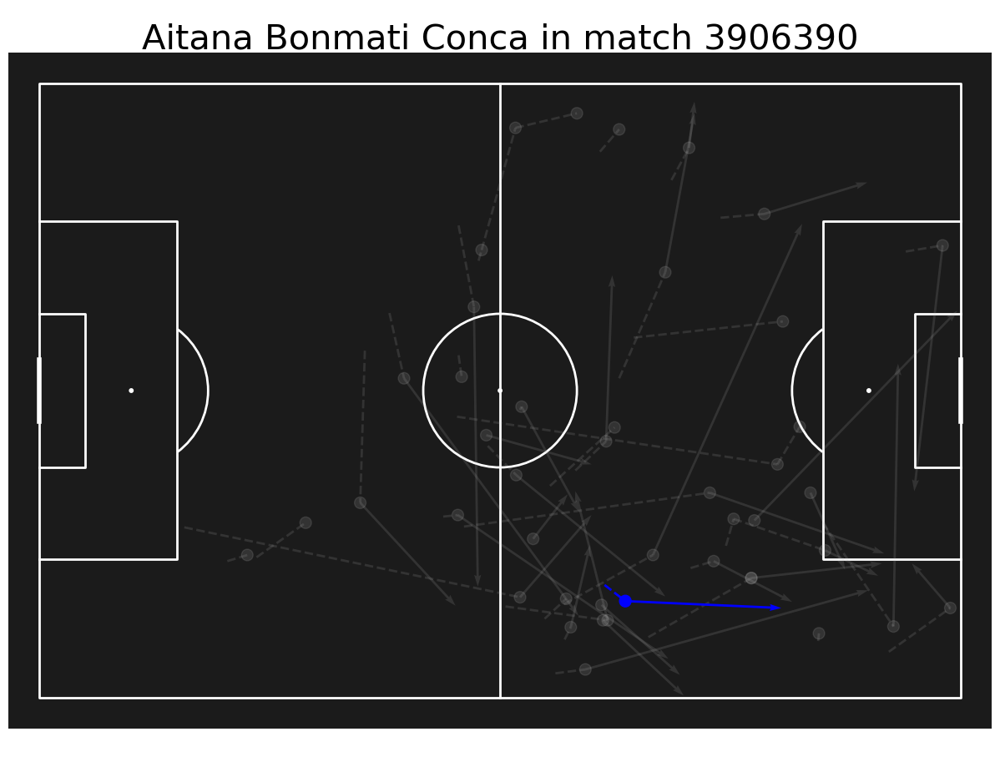

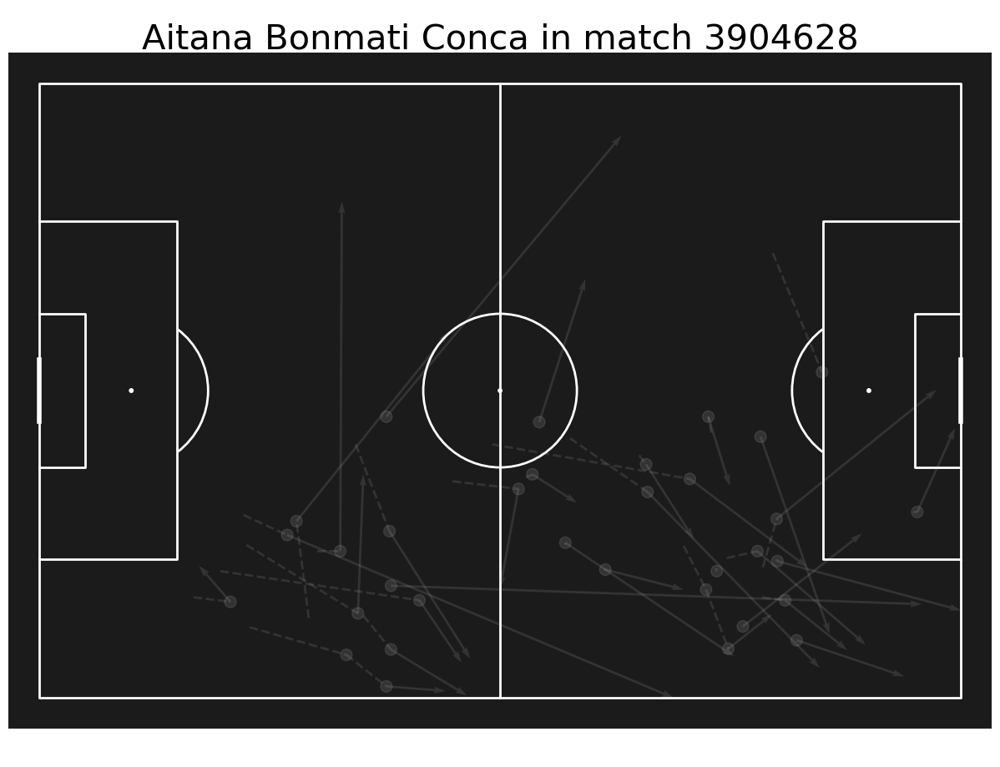

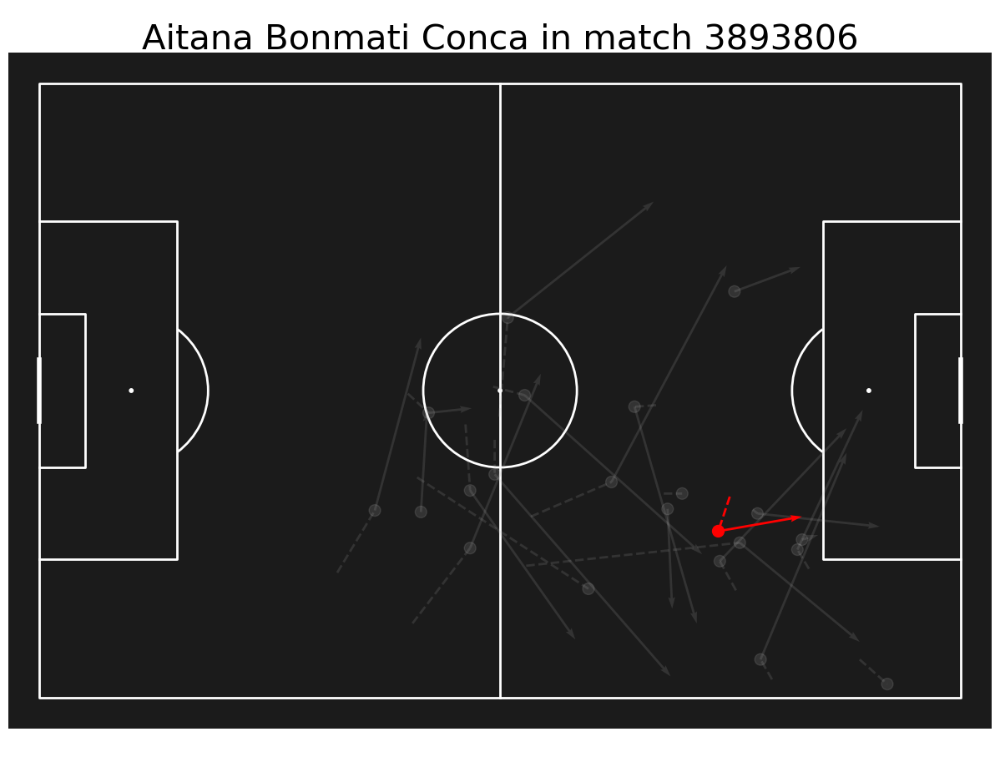

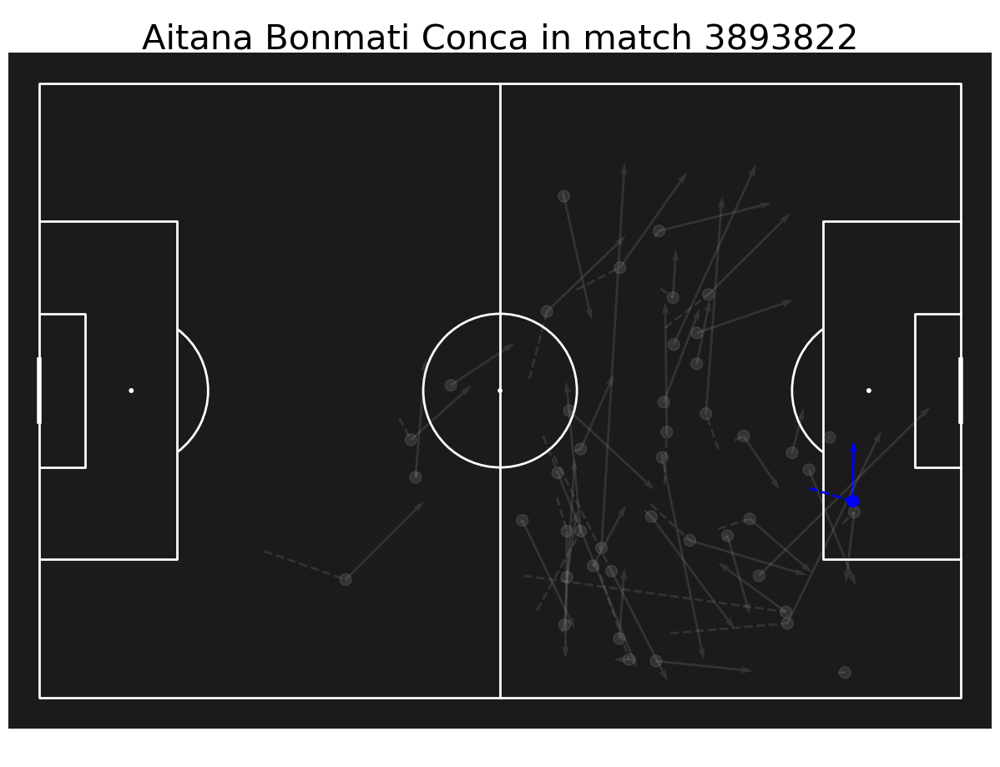

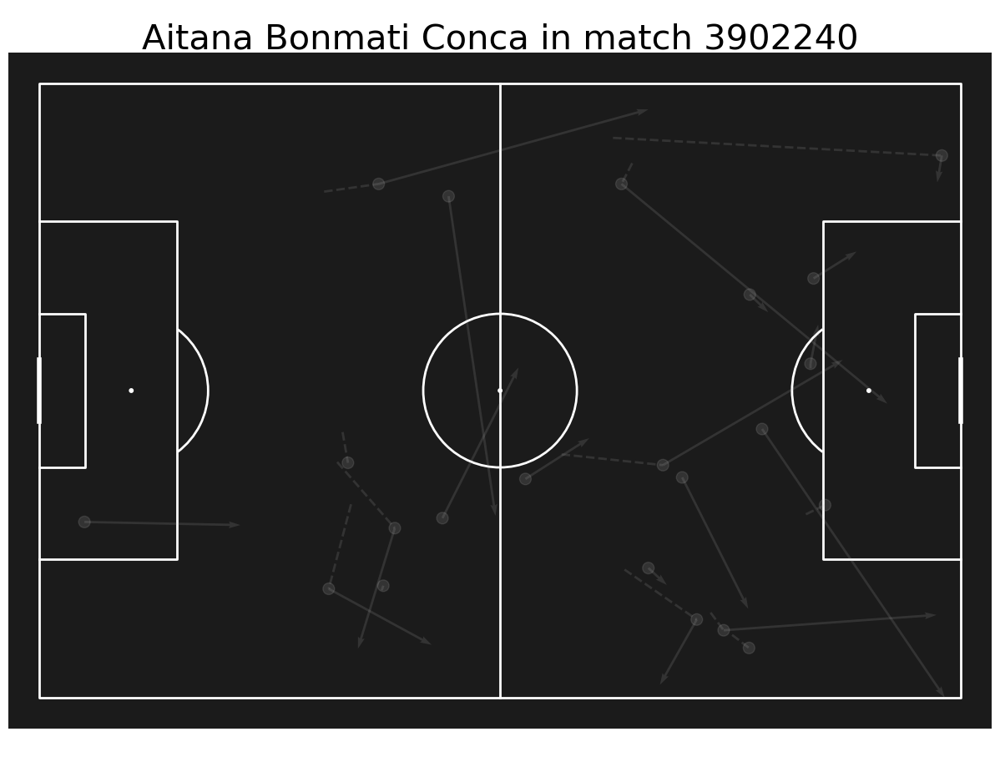

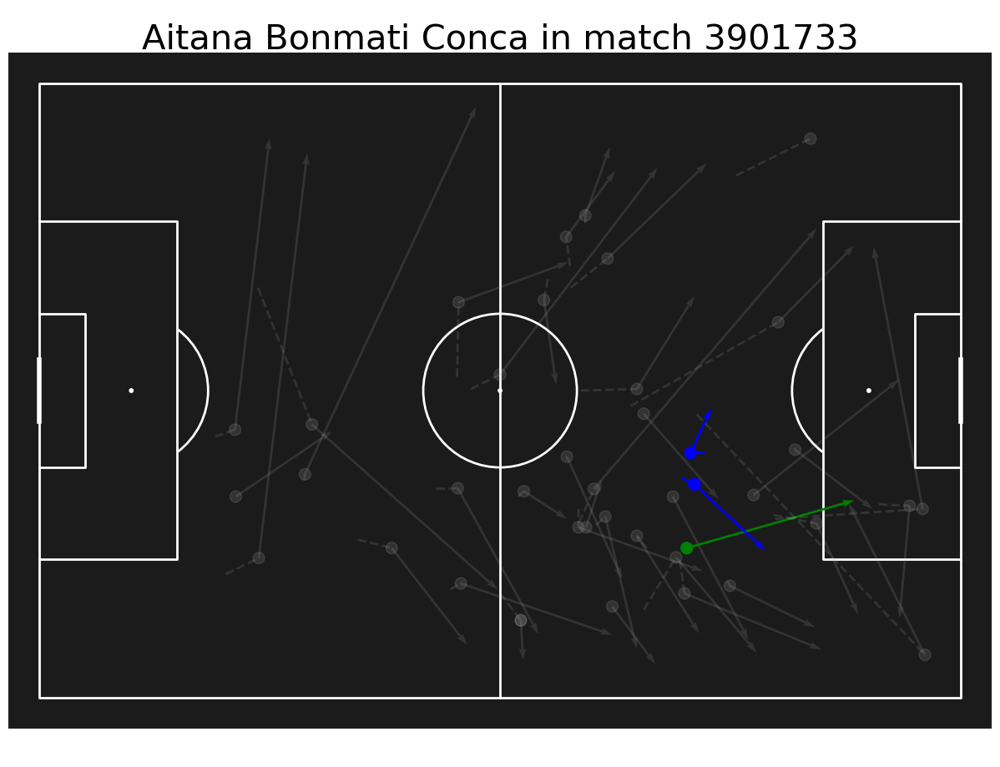

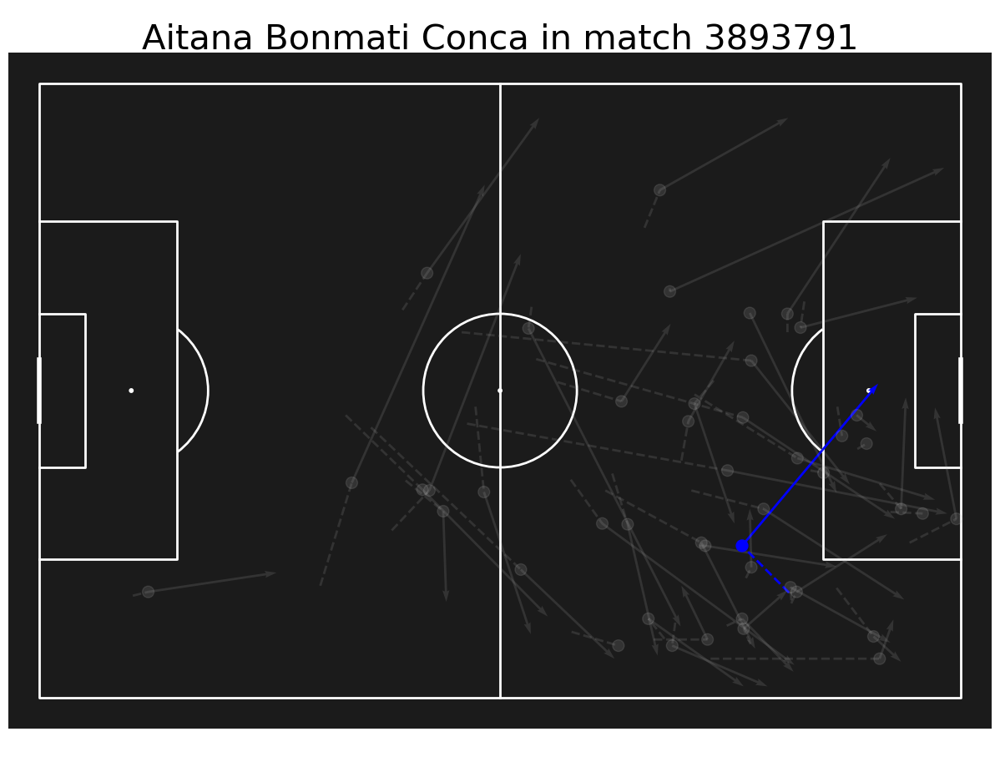

final_type
Carry            5.000000
Carry + Pass    26.142857
Pass             4.857143
dtype: float64
13.15079365079365


In [159]:
player_name = "Aitana Bonmati Conca"

player_df = pd.DataFrame()
for match_id in team_matches_id:
    match_events = wwc2023_events[wwc2023_events['match_id'] == match_id].sort_values('index')

    # Passes
    pass_not_preceded_by_carry_mask = (
        match_events['type'].eq('Pass') &
        ~(match_events['type'].shift(1).eq('Carry') |
            (match_events['type'].shift(1).isin(events_between_carry_and_pass) &
             match_events['type'].shift(2).eq('Carry')
            )
        )
    )

    pass_not_preceded_by_carry_df = match_events[pass_not_preceded_by_carry_mask][cols]
    forward_pass_not_preceded_by_carry_df = pass_not_preceded_by_carry_df[pass_not_preceded_by_carry_df['location'].apply(lambda x: x[0]) < pass_not_preceded_by_carry_df['pass_end_location'].apply(lambda x: x[0])]
    aitana_forward_pass_not_preceded_by_carry_df = forward_pass_not_preceded_by_carry_df[forward_pass_not_preceded_by_carry_df['player'] == player_name]

    only_pass_start_x = [location[0] for location in aitana_forward_pass_not_preceded_by_carry_df['location']]
    only_pass_start_y = [location[1] for location in aitana_forward_pass_not_preceded_by_carry_df['location']]
    only_pass_end_x = [location[0] for location in aitana_forward_pass_not_preceded_by_carry_df['pass_end_location']]
    only_pass_end_y = [location[1] for location in aitana_forward_pass_not_preceded_by_carry_df['pass_end_location']]

    if len(aitana_forward_pass_not_preceded_by_carry_df) > 0:
        only_pass_colors_and_alphas = aitana_forward_pass_not_preceded_by_carry_df.apply(determine_color_and_alpha_and_zorder, axis=1)
        only_pass_colors, only_pass_alphas, only_pass_zorder = zip(*only_pass_colors_and_alphas)

    player_df = pd.concat([player_df, aitana_forward_pass_not_preceded_by_carry_df], ignore_index = True)


    # Carry + passes
    carry_and_pass_mask = (
        (match_events['type'].eq('Carry') & 
         match_events['type'].shift(-1).eq('Pass') &
         match_events['player'].eq(match_events['player'].shift(-1))
        ) |
        (match_events['type'].eq('Carry') & 
         match_events['type'].shift(-1).isin(events_between_carry_and_pass) & 
         match_events['type'].shift(-2).eq('Pass') & 
         match_events['player'].eq(match_events['player'].shift(-2))
        )
    )

    carry_and_pass_df = match_events[carry_and_pass_mask][cols]
    carry_and_pass_df['next_type'] = match_events['type'].shift(-1).where(carry_and_pass_mask)

    carry_and_pass_df['pass_location'] = match_events['location'].shift(-1).where(carry_and_pass_mask)
    carry_and_pass_df['pass_location'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['location'].shift(-2).where(carry_and_pass_mask),
                                            inplace=True)

    carry_and_pass_df['pass_end_location'] = match_events['pass_end_location'].shift(-1).where(carry_and_pass_mask)
    carry_and_pass_df['pass_end_location'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_end_location'].shift(-2).where(carry_and_pass_mask),
                                            inplace=True)
    carry_and_pass_df['pass_shot_assist'] = match_events['pass_shot_assist'].shift(-1).where(carry_and_pass_mask)
    carry_and_pass_df['pass_shot_assist'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_shot_assist'].shift(-2).where(carry_and_pass_mask),
                                            inplace=True)
    carry_and_pass_df['pass_goal_assist'] = match_events['pass_goal_assist'].shift(-1).where(carry_and_pass_mask)
    carry_and_pass_df['pass_goal_assist'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_goal_assist'].shift(-2).where(carry_and_pass_mask),
                                            inplace=True)
    carry_and_pass_df['pass_through_ball'] = match_events['pass_through_ball'].shift(-1).where(carry_and_pass_mask)
    carry_and_pass_df['pass_through_ball'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_through_ball'].shift(-2).where(carry_and_pass_mask),
                                            inplace=True)
    forward_carry_and_pass_df = carry_and_pass_df[carry_and_pass_df['location'].apply(lambda x: x[0]) < carry_and_pass_df['pass_end_location'].apply(lambda x: x[0])]
    aitana_forward_carry_and_pass_df = forward_carry_and_pass_df[forward_carry_and_pass_df['player'] == player_name]

    carry_start_x = [location[0] for location in aitana_forward_carry_and_pass_df['location']]
    carry_start_y = [location[1] for location in aitana_forward_carry_and_pass_df['location']]
    pass_start_x = [location[0] for location in aitana_forward_carry_and_pass_df['pass_location']]
    pass_start_y = [location[1] for location in aitana_forward_carry_and_pass_df['pass_location']]
    pass_end_x = [location[0] for location in aitana_forward_carry_and_pass_df['pass_end_location']]
    pass_end_y = [location[1] for location in aitana_forward_carry_and_pass_df['pass_end_location']]

    if len(aitana_forward_carry_and_pass_df) > 0:
        carry_and_pass_colors_and_alphas = aitana_forward_carry_and_pass_df.apply(determine_color_and_alpha_and_zorder, axis=1)
        carry_and_pass_colors, carry_and_pass_alphas, carry_and_pass_zorder = zip(*carry_and_pass_colors_and_alphas)

    player_df = pd.concat([player_df, aitana_forward_carry_and_pass_df], ignore_index = True)

    # Carrys
    carry_mask = match_events['type'].eq('Carry')

    carry_not_followed_by_pass_mask = carry_mask & ~carry_and_pass_mask

    carry_not_followed_by_pass_df = match_events[carry_not_followed_by_pass_mask][cols]
    forward_carry_not_followed_by_pass_df = carry_not_followed_by_pass_df[carry_not_followed_by_pass_df['location'].apply(lambda x: x[0]) < carry_not_followed_by_pass_df['carry_end_location'].apply(lambda x: x[0])]
    aitana_forward_carry_not_followed_by_pass_df = forward_carry_not_followed_by_pass_df[forward_carry_not_followed_by_pass_df['player'] == player_name]

    only_carry_start_x = [location[0] for location in aitana_forward_carry_not_followed_by_pass_df['location']]
    only_carry_start_y = [location[1] for location in aitana_forward_carry_not_followed_by_pass_df['location']]
    only_carry_end_x = [location[0] for location in aitana_forward_carry_not_followed_by_pass_df['carry_end_location']]
    only_carry_end_y = [location[1] for location in aitana_forward_carry_not_followed_by_pass_df['carry_end_location']]

    if len(aitana_forward_carry_not_followed_by_pass_df) > 0:
        only_carry_colors_and_alphas = aitana_forward_carry_not_followed_by_pass_df.apply(determine_color_and_alpha_and_zorder, axis=1)
        only_carry_colors, only_carry_alphas, only_carry_zorder = zip(*only_carry_colors_and_alphas)

    player_df = pd.concat([player_df, aitana_forward_carry_not_followed_by_pass_df], ignore_index = True)

    # Plot   
    pitch = Pitch(line_color='white', pitch_color=black_color)
    fig, ax = pitch.grid(grid_height=0.9, title_height=0.06, axis=False,
                         endnote_height=0.04, title_space=0, endnote_space=0)

    if len(aitana_forward_pass_not_preceded_by_carry_df) > 0:
        # Plot passes
        pitch.scatter(only_pass_start_x, only_pass_start_y, alpha=only_pass_alphas, s=circle_size, color=only_pass_colors,
                      ax=ax['pitch'], zorder=2)
        pitch.arrows(only_pass_start_x, only_pass_start_y,
                     only_pass_end_x, only_pass_end_y,
                     color=only_pass_colors, linestyle='-', width=line_width, alpha=only_pass_alphas,
                     ax=ax['pitch'], zorder=1)

    if len(aitana_forward_carry_not_followed_by_pass_df) > 0:
        # Plot carrys
        pitch.scatter(only_carry_end_x, only_carry_end_y, alpha=only_carry_alphas, s=circle_size, color=only_carry_colors,
                      ax=ax['pitch'], zorder=2)
        pitch.lines(only_carry_start_x, only_carry_start_y, 
                    only_carry_end_x, only_carry_end_y,
                    color=only_carry_colors, linestyles='--', linewidth=line_width, alpha=only_carry_alphas,
                    ax=ax['pitch'], zorder=1)

    if len(aitana_forward_carry_and_pass_df) > 0:
        # Plot carrys + passes
        pitch.scatter(pass_start_x, pass_start_y, alpha=carry_and_pass_alphas, s=circle_size, color=carry_and_pass_colors,
                      ax=ax['pitch'], zorder=2)
        pitch.arrows(pass_start_x, pass_start_y,
                     pass_end_x, pass_end_y,
                     color=carry_and_pass_colors, linestyle='-', width=line_width, alpha=carry_and_pass_alphas,
                     ax=ax['pitch'], zorder=1)
        pitch.lines(carry_start_x, carry_start_y, 
                    pass_start_x, pass_start_y,
                    color=carry_and_pass_colors, linestyles='--', linewidth=line_width, alpha=carry_and_pass_alphas,
                    ax=ax['pitch'], zorder=1)

        fig.suptitle(f"{player_name} in match {match_id}", fontsize=30)
        plt.savefig(f"img/{player_name}_{match_id}.png")
        plt.show()

conditions = [
    (player_df['type'] == 'Pass'),
    (player_df['type'] == 'Carry') & (player_df['pass_end_location'].isnull())
]
choices = ['Pass', 'Carry']

player_df['final_type'] = np.select(conditions, choices, default='Carry + Pass')
print(player_df.groupby('match_id')['final_type'].value_counts().unstack(fill_value=0).mean())

player_df['new_column'] = player_df.apply(calculate_result, axis=1)
x = player_df.new_column.mean()
print(x)


n_passes = len(player_df)

player_names.append(player_name)
forward_meters.append(x)
n_passes_list.append(n_passes)

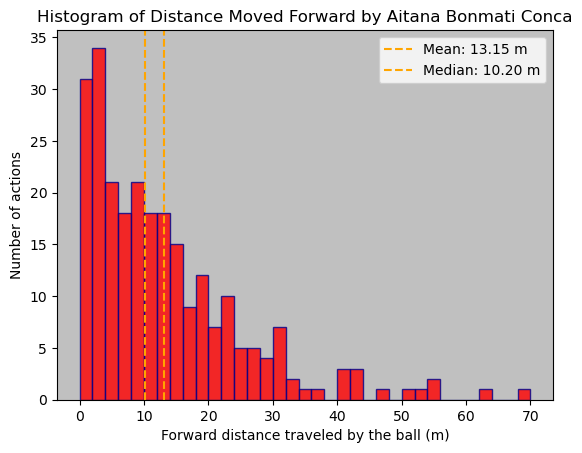

In [172]:
import matplotlib.pyplot as plt

# Set the number of bins and customize the size of bins
# num_bins = 35 
# bin_size = (player_df['new_column'].max() - player_df['new_column'].min()) / num_bins

bin_size = 2
bin_edges = np.arange(0, 70 + bin_size, bin_size)

mean_distance = player_df['new_column'].mean()
median_distance = player_df['new_column'].median()


# Create the histogram
plt.hist(player_df['new_column'], bins=bin_edges, edgecolor='darkblue', alpha=0.8, color='red')

# Customize the plot
plt.title(f'Histogram of Distance Moved Forward by {player_name}')
plt.xlabel('Forward distance traveled by the ball (m)')
plt.ylabel('Number of actions')

plt.axvline(mean_distance, color='orange', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_distance:.2f} m')
plt.axvline(median_distance, color='orange', linestyle='dashed', linewidth=1.5, label=f'Median: {median_distance:.2f} m')
plt.legend()

ax = plt.gca()
ax.set_facecolor(gray_color)


# Show the histogram
plt.show()

In [82]:
df['Number of Passes'].median()

91.0

In [121]:
conditions = [
    (player_df['type'] == 'Pass'),
    (player_df['type'] == 'Carry') & (player_df['pass_end_location'].isnull())
]
choices = ['Pass', 'Carry']

player_df['final_type'] = np.select(conditions, choices, default='Carry + Pass')
player_df.groupby('match_id')['final_type'].value_counts().unstack(fill_value=0).mean()

final_type
Carry            5.000000
Carry + Pass    26.142857
Pass             4.857143
dtype: float64

In [118]:
player_df.groupby('match_id')['final_type'].value_counts().unstack(fill_value=0)

final_type,Carry,Carry + Pass,Pass
match_id,,,
3893791,3,13,1
3893806,7,38,6
3893822,5,28,3
3902240,11,31,9
3904628,6,27,1
3906390,6,24,5


## PO matches

In [62]:
cols = ['id', 'index', 'match_id', 'player', 'type', 'location', 'carry_end_location', 'pass_end_location', 'pass_shot_assist', 
        'pass_goal_assist', 'pass_through_ball']

C:\Users\Alvaro\AppData\Local\Temp\ipykernel_13412\2620626010.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  match_events['pass_danger_assist'] = match_events['id'].isin(danger_passes['id'])


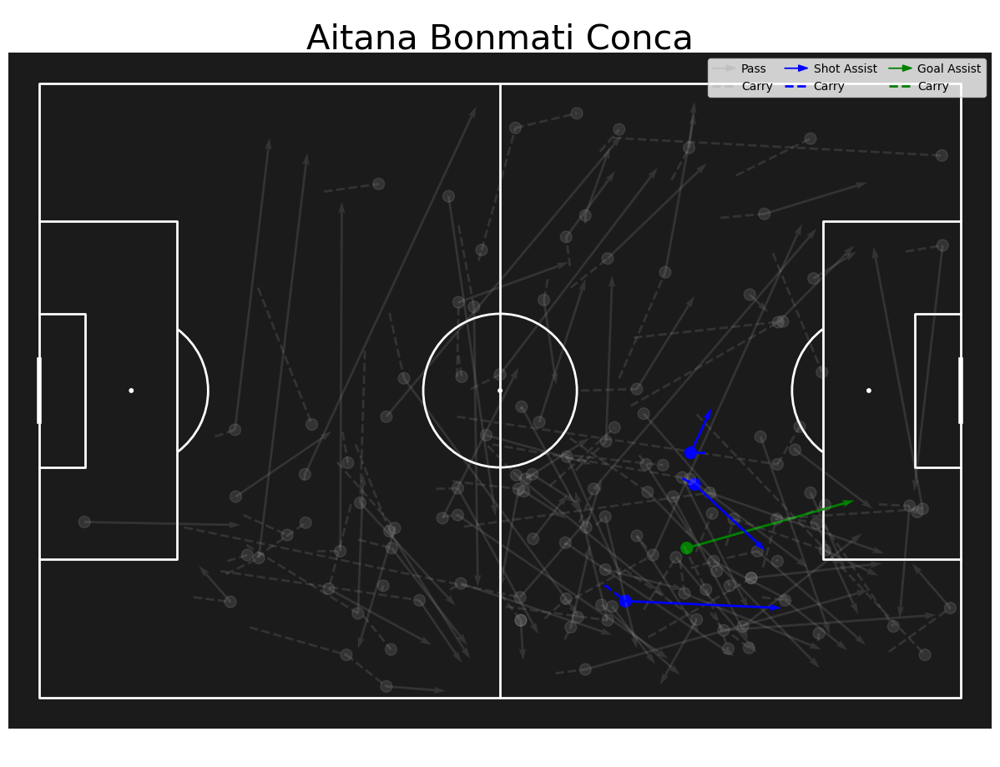

In [59]:
final_third_x = 0
po_matches = [3906390, 3904628, 3902240, 3901733]
match_events = wwc2023_events[wwc2023_events['match_id'].isin(po_matches)].sort_values(by=['match_id', 'index'])

danger_passes = pd.DataFrame()
for match_id in po_matches:
    the_match_events = match_events[match_events['match_id'] == match_id]
    for period in [1, 2]:
        mask_pass = (the_match_events.team == team_name) & (the_match_events.type == "Pass") & (the_match_events.period == period)
        passes = the_match_events.loc[mask_pass, cols + ['minute', 'second']]
        mask_shot = (the_match_events.team == team_name) & (the_match_events.type == "Shot") & (the_match_events.period == period)
        shots = the_match_events.loc[mask_shot, ["minute", "second"]]
        shot_times = shots['minute']*60+shots['second']
        shot_window = 5  # seconds
        shot_start = shot_times - shot_window
        shot_start = shot_start.apply(lambda i: i if i>0 else (period-1)*45)
        pass_times = passes['minute']*60+passes['second']
        pass_to_shot = pass_times.apply(lambda x: True in ((shot_start < x) & (x < shot_times)).unique())
        danger_passes_period = passes.loc[pass_to_shot]
        danger_passes = pd.concat([danger_passes, danger_passes_period], ignore_index = True)


match_events['pass_danger_assist'] = match_events['id'].isin(danger_passes['id'])
cols.append('pass_danger_assist')

# Passes
pass_not_preceded_by_carry_mask = (
    match_events['type'].eq('Pass') & match_events['pass_outcome'].isnull() &
    ~(match_events['type'].shift(1).eq('Carry') |
        (match_events['type'].shift(1).isin(events_between_carry_and_pass) &
         match_events['type'].shift(2).eq('Carry')
        )
    )
)

pass_not_preceded_by_carry_df = match_events[pass_not_preceded_by_carry_mask][cols]
forward_pass_not_preceded_by_carry_df = pass_not_preceded_by_carry_df[pass_not_preceded_by_carry_df['location'].apply(lambda x: x[0]) < pass_not_preceded_by_carry_df['pass_end_location'].apply(lambda x: x[0])]
aitana_forward_pass_not_preceded_by_carry_df = forward_pass_not_preceded_by_carry_df[forward_pass_not_preceded_by_carry_df['player'] == player_name]
aitana_finalthird_forward_pass_not_preceded_by_carry_df = aitana_forward_pass_not_preceded_by_carry_df[aitana_forward_pass_not_preceded_by_carry_df['pass_end_location'].apply(lambda x: x[0]) >= final_third_x]

only_pass_start_x = [location[0] for location in aitana_finalthird_forward_pass_not_preceded_by_carry_df['location']]
only_pass_start_y = [location[1] for location in aitana_finalthird_forward_pass_not_preceded_by_carry_df['location']]
only_pass_end_x = [location[0] for location in aitana_finalthird_forward_pass_not_preceded_by_carry_df['pass_end_location']]
only_pass_end_y = [location[1] for location in aitana_finalthird_forward_pass_not_preceded_by_carry_df['pass_end_location']]

only_pass_colors_and_alphas = aitana_finalthird_forward_pass_not_preceded_by_carry_df.apply(determine_color_and_alpha_and_zorder, axis=1)
only_pass_colors, only_pass_alphas, _ = zip(*only_pass_colors_and_alphas)


# Carry + passes
carry_and_pass_mask = (
    (match_events['type'].eq('Carry') & 
     match_events['type'].shift(-1).eq('Pass') & match_events['pass_outcome'].shift(-1).isnull() &
     match_events['player'].eq(match_events['player'].shift(-1))
    ) |
    (match_events['type'].eq('Carry') & 
     match_events['type'].shift(-1).isin(events_between_carry_and_pass) & 
     match_events['type'].shift(-2).eq('Pass') & match_events['pass_outcome'].shift(-2).isnull() &
     match_events['player'].eq(match_events['player'].shift(-2))
    )
)

carry_and_pass_df = match_events[carry_and_pass_mask][cols]
carry_and_pass_df['next_type'] = match_events['type'].shift(-1).where(carry_and_pass_mask)

carry_and_pass_df['pass_location'] = match_events['location'].shift(-1).where(carry_and_pass_mask)
carry_and_pass_df['pass_location'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['location'].shift(-2).where(carry_and_pass_mask),
                                        inplace=True)

carry_and_pass_df['pass_end_location'] = match_events['pass_end_location'].shift(-1).where(carry_and_pass_mask)
carry_and_pass_df['pass_end_location'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_end_location'].shift(-2).where(carry_and_pass_mask),
                                        inplace=True)
carry_and_pass_df['pass_shot_assist'] = match_events['pass_shot_assist'].shift(-1).where(carry_and_pass_mask)
carry_and_pass_df['pass_shot_assist'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_shot_assist'].shift(-2).where(carry_and_pass_mask),
                                        inplace=True)
carry_and_pass_df['pass_goal_assist'] = match_events['pass_goal_assist'].shift(-1).where(carry_and_pass_mask)
carry_and_pass_df['pass_goal_assist'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_goal_assist'].shift(-2).where(carry_and_pass_mask),
                                        inplace=True)
carry_and_pass_df['pass_through_ball'] = match_events['pass_through_ball'].shift(-1).where(carry_and_pass_mask)
carry_and_pass_df['pass_through_ball'].mask(carry_and_pass_df['next_type'].isin(events_between_carry_and_pass), match_events['pass_through_ball'].shift(-2).where(carry_and_pass_mask),
                                        inplace=True)
forward_carry_and_pass_df = carry_and_pass_df[carry_and_pass_df['location'].apply(lambda x: x[0]) < carry_and_pass_df['pass_end_location'].apply(lambda x: x[0])]
aitana_forward_carry_and_pass_df = forward_carry_and_pass_df[forward_carry_and_pass_df['player'] == player_name]
aitana_finalthird_forward_carry_and_pass_df = aitana_forward_carry_and_pass_df[aitana_forward_carry_and_pass_df['pass_end_location'].apply(lambda x: x[0]) >= final_third_x]


carry_start_x = [location[0] for location in aitana_finalthird_forward_carry_and_pass_df['location']]
carry_start_y = [location[1] for location in aitana_finalthird_forward_carry_and_pass_df['location']]
pass_start_x = [location[0] for location in aitana_finalthird_forward_carry_and_pass_df['pass_location']]
pass_start_y = [location[1] for location in aitana_finalthird_forward_carry_and_pass_df['pass_location']]
pass_end_x = [location[0] for location in aitana_finalthird_forward_carry_and_pass_df['pass_end_location']]
pass_end_y = [location[1] for location in aitana_finalthird_forward_carry_and_pass_df['pass_end_location']]

carry_and_pass_colors_and_alphas = aitana_finalthird_forward_carry_and_pass_df.apply(determine_color_and_alpha_and_zorder, axis=1)
carry_and_pass_colors, carry_and_pass_alphas, _ = zip(*carry_and_pass_colors_and_alphas)


# Carrys
carry_mask = match_events['type'].eq('Carry')

carry_not_followed_by_pass_mask = carry_mask & ~carry_and_pass_mask

carry_not_followed_by_pass_df = match_events[carry_not_followed_by_pass_mask][cols]
forward_carry_not_followed_by_pass_df = carry_not_followed_by_pass_df[carry_not_followed_by_pass_df['location'].apply(lambda x: x[0]) < carry_not_followed_by_pass_df['carry_end_location'].apply(lambda x: x[0])]
aitana_forward_carry_not_followed_by_pass_df = forward_carry_not_followed_by_pass_df[forward_carry_not_followed_by_pass_df['player'] == player_name]
aitana_finalthird_forward_carry_not_followed_by_pass_df = aitana_forward_carry_not_followed_by_pass_df[aitana_forward_carry_not_followed_by_pass_df['carry_end_location'].apply(lambda x: x[0]) >= final_third_x]

only_carry_start_x = [location[0] for location in aitana_finalthird_forward_carry_not_followed_by_pass_df['location']]
only_carry_start_y = [location[1] for location in aitana_finalthird_forward_carry_not_followed_by_pass_df['location']]
only_carry_end_x = [location[0] for location in aitana_finalthird_forward_carry_not_followed_by_pass_df['carry_end_location']]
only_carry_end_y = [location[1] for location in aitana_finalthird_forward_carry_not_followed_by_pass_df['carry_end_location']]

only_carry_colors_and_alphas = aitana_finalthird_forward_carry_not_followed_by_pass_df.apply(determine_color_and_alpha_and_zorder, axis=1)
only_carry_colors, only_carry_alphas, _ = zip(*only_carry_colors_and_alphas)


# Plot   
pitch = Pitch(line_color='white', pitch_color=black_color)
fig, ax = pitch.grid(grid_height=0.9, title_height=0.06, axis=False,
                     endnote_height=0.04, title_space=0, endnote_space=0)

# Plot passes
pitch.scatter(only_pass_start_x, only_pass_start_y, alpha=only_pass_alphas, s=circle_size, color=only_pass_colors, ax=ax['pitch'], zorder=1)
pitch.arrows(only_pass_start_x, only_pass_start_y,
             only_pass_end_x, only_pass_end_y,
             color=only_pass_colors, linestyle='-', width=line_width, alpha=only_pass_alphas,
             ax=ax['pitch'], zorder=1)

# Plot carrys
pitch.scatter(only_carry_end_x, only_carry_end_y, alpha=only_carry_alphas, s=circle_size, color=only_carry_colors, ax=ax['pitch'], zorder=1)
pitch.lines(only_carry_start_x, only_carry_start_y, 
            only_carry_end_x, only_carry_end_y,
            color=only_carry_colors, linestyles='--', linewidth=line_width, alpha=only_carry_alphas,
            ax=ax['pitch'], zorder=1)

# Plot carrys + passes
pitch.scatter(pass_start_x, pass_start_y, alpha=carry_and_pass_alphas, s=circle_size, color=carry_and_pass_colors, ax=ax['pitch'], zorder=1)
pitch.arrows(pass_start_x, pass_start_y,
             pass_end_x, pass_end_y,
             color=carry_and_pass_colors, linestyle='-', width=line_width, alpha=carry_and_pass_alphas,
             ax=ax['pitch'], zorder=1)
pitch.lines(carry_start_x, carry_start_y, 
            pass_start_x, pass_start_y,
            color=carry_and_pass_colors, linestyles='--', linewidth=line_width, alpha=carry_and_pass_alphas,
            ax=ax['pitch'], zorder=1)


# Create custom legend elements
legend_elements = [mpatches.FancyArrow(0, 0, 1, 0, color=gray_color),
                   Line2D([0], [0], color=gray_color, lw=2, linestyle='--'),
                   mpatches.FancyArrow(0, 0, 1, 0, color='blue'),
                   Line2D([0], [0], color='blue', lw=2, linestyle='--'),
                   mpatches.FancyArrow(0, 0, 1, 0, color='g'),
                   Line2D([0], [0], color='g', lw=2, linestyle='--')]

# Create a custom legend
legend = ax['pitch'].legend(legend_elements, ['Pass', 'Carry', 'Shot Assist', 'Carry', 'Goal Assist', 'Carry'], 
                            handler_map={mpatches.FancyArrow : HandlerPatch(patch_func=make_legend_arrow)}, 
                            ncol=3, handletextpad=0.5, columnspacing=1, loc='upper right')


fig.suptitle(f"{player_name}", fontsize=30)
plt.savefig(f"img/po_matches.png")
plt.show()

In [26]:
from matplotlib.legend_handler import HandlerPatch
import matplotlib.patches as mpatches

# Custom handler for arrows
def make_legend_arrow(legend, orig_handle,
                      xdescent, ydescent,
                      width, height, fontsize):
    p = mpatches.FancyArrow(0, 0.5*height, width, 0, length_includes_head=True, head_width=0.75*height )
    return p

In [ ]:
# passes_and_carrys = pd.concat([wwc2023_events["carrys"], wwc2023_events["passes"]], axis=0).reset_index(drop=True)
# aitana_match = passes_and_carrys[(passes_and_carrys.player == "Aitana Bonmati Conca") & (passes_and_carrys.match_id == match_id)]
# aitana_match.columns

In [ ]:
carry_and_pass_mask = aitana_match['type'].eq('Carry') & aitana_match['type'].shift(-1).eq('Pass')
aitana_match[carry_and_pass_mask]

In [ ]:
aitana_match[aitana_match['index'].isin([3287, 3288])][cols]

In [ ]:
carrys = wwc2023_events["carrys"]
passes = wwc2023_events["passes"]

In [ ]:
aitana_match_carrys_mask = (carrys.player == player_name) & (carrys.match_id == match_id)
aitana_match_carrys = carrys[aitana_match_carrys_mask]

In [ ]:
aitana_match_passes_mask = (passes.player == player_name) & (passes.match_id == match_id)
aitana_match_passes = passes[aitana_match_passes_mask]

In [ ]:
aitana_match_passes.index

In [ ]:
uuid = '5d3b3608-7cf4-4c4b-895a-abf2ccae2aa0'
aitana_match_passes[aitana_match_passes['id'] == uuid]

In [ ]:
cols = ['id', 'location', 'carry_end_location']
aitana_match_carrys[cols]

In [ ]:
aitana_match_carrys[['id', 'related_events', 'related_pass_event']]

In [ ]:
aitana_match['related_events']

In [ ]:
wwc2023_events["carrys"]

In [ ]:
wwc2023_events["passes"]

In [ ]:
wwc2023_events = sb.competition_events(
    country=wwc2023['country_name'].iloc[0],
    division=wwc2023['competition_name'].iloc[0],
    season=wwc2023['season_name'].iloc[0],
    gender=wwc2023['competition_gender'].iloc[0]
)
wwc2023_team_events = wwc2023_events[wwc2023_events['team'] == team_name]
wwc2023_team_events

In [ ]:
wwc2023_team_events.type.unique()

In [ ]:
passes_df = wwc2023_team_events[wwc2023_team_events.type == 'Pass']
passes_df

In [ ]:
passes_df.groupby('match_id').size().reset_index(name='count')

In [ ]:
for column in passes_df.columns:
    print(column)

In [ ]:
cols = ['id', 'player_id', 'location', 'match_id', 'timestamp', 'pass_body_part', 'pass_end_location', 'pass_height', 'pass_outcome', 'pass_shot_assist', 'pass_goal_assist', 'pass_through_ball', 'pass_type', 'under_pressure']
cols

In [ ]:
passes_df[cols].pass_body_part.unique()

In [ ]:
passes_df[cols].pass_outcome.unique()

In [ ]:
passes_df[cols].pass_through_ball.unique()

In [ ]:
passes_df[cols].pass_type.unique()

In [ ]:
passes_df[cols].under_pressure.unique()

In [ ]:
events.info()

In [ ]:
events.type.unique()

In [ ]:
shot_events = events[events['type'] == 'Shot']
shot_events['end_z'].max()

In [ ]:
shot_events['shot_end_location']

In [ ]:
related

In [ ]:
help(parser)